In [1]:
import plot
import importlib
import numpy as np
import random
import os
import glob
import h5py
import math
import scipy
import random
import classify
import warnings
import preprocess
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from os import path
from scipy import stats
from scipy.io import loadmat
from matplotlib import gridspec
from numpy.linalg import norm
from scipy.spatial import distance
from sklearn import decomposition
from matplotlib.colors import LinearSegmentedColormap
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
warnings.filterwarnings('ignore')
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

np.random.seed(42)
random.seed(42)


In [ ]:
# reload when updating code
importlib.reload(preprocess)
# mouse and date

mice = ['NN28'] 

dates_per_mouse = { #'NN8': [ '210312', '210314', '210316', '210318', '210320']
                    #'NN9': ['210428',  '210429', '210501', '210502'],
                    #'NN11': ['210626', '210627', '210628', '210629']
                    #'NN23': ['220416',  '220417', '220418', '220419', '220420']
                    'NN28': ['230210', '230211', '230212', '230213', '230214']
                   }

all_results = {}

for mouse in mice:
    all_results[mouse] = {}
    dates = dates_per_mouse[mouse]
    
    for date in dates:
        print(f"Processing {mouse} {date}")
        
        # Create storage for this day
        day_results = {}
        
        # Create folders
        paths = preprocess.create_folders(mouse, date)
        day_results['paths'] = paths
        
        # Load session data
        session_data = preprocess.load_data(paths, mouse, date)
        day_results['session_data'] = session_data
        
        # Process behavior
        behavior = preprocess.process_behavior(session_data, paths)
        day_results['behavior'] = behavior
        
        # Process activity
        deconvolved = preprocess.process_activity(paths, 'spks', 3, 0)
        day_results['deconvolved'] = deconvolved
        print('deconvolved done')
        
        # Normalize activity
        norm_deconvolved = preprocess.normalize_deconvolved(deconvolved, behavior, paths, 0)
        day_results['norm_deconvolved'] = norm_deconvolved
        print('norm_deconvolved done')
        
        # Filter activity
        filtered = preprocess.difference_gaussian_filter(norm_deconvolved, 4, behavior, paths, 0)
        day_results['filtered'] = filtered
        print('filtered done')

        
        # Trial-averaged responses
        mean_cs1_df = preprocess.normalized_trial_averaged(norm_deconvolved, behavior, 'cs_1')
        mean_cs2_df = preprocess.normalized_trial_averaged(norm_deconvolved, behavior, 'cs_2')
        day_results['mean_cs1'] = mean_cs1_df
        day_results['mean_cs2'] = mean_cs2_df
        
        # Significant cells
        cs1_pos, cs1_neg = preprocess.sig_test(norm_deconvolved, behavior, 'cs_1')
        cs2_pos, cs2_neg = preprocess.sig_test(norm_deconvolved, behavior, 'cs_2')
        both_pos, both_sig = preprocess.combine_sig(cs1_pos, cs1_neg, cs2_pos, cs2_neg)
        day_results['sig_cells'] = {'cs1_pos': cs1_pos, 'cs1_neg': cs1_neg,
                                    'cs2_pos': cs2_pos, 'cs2_neg': cs2_neg,
                                    'both_pos': both_pos, 'both_sig': both_sig}
        
        # Index of top cell differences
        idx = preprocess.get_index(behavior, mean_cs1_df, mean_cs2_df, cs1_pos, cs2_pos, both_pos, both_sig, paths, 1)
        day_results['idx'] = idx
        print('idx done')


        # Prior
        prior = classify.prior(filtered, idx['cs_1'], idx['cs_2'], behavior, [])
        day_results['prior'] = prior
        
        # Logistic regression
        y_pred_log = classify.log_regression(behavior, norm_deconvolved, filtered, both_pos, prior)
        day_results['y_pred_log'] = y_pred_log
        
        # Process classified output
        y_pred = classify.process_classified(y_pred_log, prior, paths, 1)
        day_results['y_pred'] = y_pred
        
        # Save day's results
        all_results[mouse][date] = day_results
        
        print(f"Finished {mouse} {date}")

In [ ]:
import matplotlib.lines as mlines
from plot import Loess
from statsmodels.nonparametric.smoothers_lowess import lowess
import pickle

def plot_panel_loess(ax, sim_cs, sim_r, trials_r, colors, labels, ylim=None):
    ax.scatter(range(len(sim_cs)), sim_cs, color=colors[0], s=10)
    ax.scatter(trials_r, sim_r, color=colors[1], s=10)
    ax.set_xlabel('Trial number')
    ax.set_ylabel(labels[2])
    ax.legend(handles=[
        mlines.Line2D([], [], color=colors[0], label=labels[0]),
        mlines.Line2D([], [], color=colors[1], label=labels[1])
    ], frameon=False)
    return ax

def analyze_day(day_results, topn=0.05, p_threshold=0.75, window_s=61):
    # unpack
    behavior      = day_results['behavior']
    full_act      = day_results['filtered']
    idx_both      = day_results['idx']['both'].index
    y_pred        = day_results['y_pred']
    activity      = full_act[idx_both]
    onsets_all    = np.array(behavior['onsets'], dtype=int)
    wf            = int(behavior['framerate'] * window_s)
    
    mean_activity_cs_1      = []
    mean_activity_cs_2      = []
    mean_activity_cs_any    = []
    onsets_cs_1             = []
    onsets_cs_2             = []

    for on, off, cue in zip(onsets_all, behavior['offsets'], behavior['cue_codes']):
        on_i, off_i = int(on), int(off)
        temp_act = activity[:, on_i : off_i + 1].mean(axis=1)

        if cue == behavior['cs_1_code']:
            mean_activity_cs_1.append(temp_act)
            onsets_cs_1.append(on_i)
            mean_activity_cs_any.append(temp_act)

        if cue == behavior['cs_2_code']:
            mean_activity_cs_2.append(temp_act)
            onsets_cs_2.append(on_i)
            mean_activity_cs_any.append(temp_act)

    gm = np.vstack(mean_activity_cs_any).mean(axis=0)
    mean_activity_cs_1 = np.stack(mean_activity_cs_1) / gm
    mean_activity_cs_2 = np.stack(mean_activity_cs_2) / gm

    def find_global_trial(frame_idx):
        for t, onset in enumerate(onsets_all):
            if onset <= frame_idx < onset + wf:
                return t
        return None

    # now detect reactivation events exactly as before, but on this day's data:
    rcs1 = y_pred[:,0].copy()
    rcs2 = y_pred[:,1].copy()
    on_all = np.array(behavior['onsets'], int)
    wf     = int(behavior['framerate'] * window_s)

    mean_activity_r_1, mean_activity_r_2, mean_activity_r_any = [], [], []
    trial_r_1, trial_r_2 = [], []
    trial_reacts_all = []

    cs1_peak = cs2_peak = 0
    i = next_r = 0
    while i < len(rcs1)-1:
        if rcs1[i]>0 or rcs2[i]>0:
            if next_r==0:
                r_start = i
                next_r = 1
            cs1_peak = max(cs1_peak, rcs1[i])
            cs2_peak = max(cs2_peak, rcs2[i])

            if rcs1[i+1]==0 and rcs2[i+1]==0:
                r_end = i+1
                next_r = 0
                if cs1_peak>p_threshold:
                    for j in range(1,len(onsets_cs_1)):
                        if onsets_cs_1[j-1]<r_start<onsets_cs_1[j] and r_start<onsets_cs_1[j-1]+wf:
                            seg = activity[:, r_start:r_end].mean(axis=1)
                            mean_activity_r_1.append(seg); trial_r_1.append(j-1); mean_activity_r_any.append(seg)
                            g = find_global_trial(r_start)
                            if g is not None:
                                trial_reacts_all.append(g)
                            break
                if cs2_peak>p_threshold:
                    for j in range(1,len(onsets_cs_2)):
                        if onsets_cs_2[j-1]<r_start<onsets_cs_2[j] and r_start<onsets_cs_2[j-1]+wf:
                            seg = activity[:, r_start:r_end].mean(axis=1)
                            mean_activity_r_2.append(seg); trial_r_2.append(j-1); mean_activity_r_any.append(seg)
                            g = find_global_trial(r_start)
                            if g is not None:
                                trial_reacts_all.append(g)
                            break
                i = r_end
                cs1_peak = cs2_peak = 0
        i += 1

    #mean_activity_r_1 = mean_activity_r_1 / np.mean(mean_activity_r_any, axis=0)
    #mean_activity_r_2 = mean_activity_r_2 / np.mean(mean_activity_r_any, axis=0)

    mean_activity_r_1 = np.stack(mean_activity_r_1) 
    mean_activity_r_2 = np.stack(mean_activity_r_2) 
    mean_activity_r_any = np.stack(mean_activity_r_any) 

    #ordering sers:
    sers = np.concatenate([mean_activity_cs_1, mean_activity_cs_2], axis=0)

    cue_codes = np.array(behavior['cue_codes'])
    cs1_code, cs2_code = behavior['cs_1_code'], behavior['cs_2_code']

    n_cs1 = np.sum(cue_codes == cs1_code)
    n_cs2 = np.sum(cue_codes == cs2_code)
    assert mean_activity_cs_1.shape[0] == n_cs1
    assert mean_activity_cs_2.shape[0] == n_cs2

    # Pre‐allocate the output so we can also assert lengths
    n_total, n_neurons = len(cue_codes), sers.shape[1]
    sers_ordered = np.zeros((n_total, n_neurons), dtype=sers.dtype)

    cs1_idx = cs2_idx = 0
    for i, code in enumerate(cue_codes):
        if code == cs1_code:
            sers_ordered[i] = mean_activity_cs_1[cs1_idx]
            cs1_idx += 1
        elif code == cs2_code:
            sers_ordered[i] = mean_activity_cs_2[cs2_idx]
            cs2_idx += 1
        else:
            raise ValueError(f"Unexpected cue code {code!r} at position {i}")


    n_centroids = 3
    mean_activity_cs_1_mean = [np.mean(mean_activity_cs_1[0:n_centroids], axis=0), np.mean(mean_activity_cs_1[len(mean_activity_cs_1) - n_centroids:len(mean_activity_cs_1)], axis=0)]
    mean_activity_cs_2_mean = [np.mean(mean_activity_cs_2[0:n_centroids], axis=0), np.mean(mean_activity_cs_2[len(mean_activity_cs_2) - n_centroids:len(mean_activity_cs_2)], axis=0)]

    # Calculate the difference vectors between the early and late mean activities for cs_1 and cs_2.
    mean_activity_cs_1_vec = mean_activity_cs_1_mean[1] - mean_activity_cs_1_mean[0]
    mean_activity_cs_2_vec = mean_activity_cs_2_mean[1] - mean_activity_cs_2_mean[0]

    late_trails_1 = mean_activity_cs_1_mean[1]
    top_n_percent_indices_1 = np.argsort(late_trails_1)[-int(len(late_trails_1) * topn):]
    mean_activity_cstopn_1 = mean_activity_cs_1[:, top_n_percent_indices_1]
    mean_activity_cstopn_1_late = mean_activity_cs_1_mean[1][top_n_percent_indices_1]

    late_trails_2 = mean_activity_cs_2_mean[1]
    top_n_percent_indices_2 = np.argsort(late_trails_2)[-int(len(late_trails_2) * topn):]
    print(top_n_percent_indices_2.shape)
    mean_activity_cstopn_2 = mean_activity_cs_2[:, top_n_percent_indices_2]
    mean_activity_cstopn_2_late = mean_activity_cs_2_mean[1][top_n_percent_indices_2]

    sim_cs_1 = np.zeros(len(mean_activity_cs_1))
    sim_cs_2 = np.zeros(len(mean_activity_cs_2))

    cos_sim = lambda a, b: np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

    # Normalize the mean activities for each trial using the difference vectors.
    for i in range(0, len(mean_activity_cs_1)):
        sim_cs_1[i] = cos_sim(mean_activity_cstopn_1[i], mean_activity_cstopn_1_late)
    for i in range(0, len(mean_activity_cs_2)):
        sim_cs_2[i] = cos_sim(mean_activity_cstopn_2[i], mean_activity_cstopn_2_late)

    sim_r_1 = np.zeros(len(mean_activity_r_1))
    sim_r_2 = np.zeros(len(mean_activity_r_2))

    sim_r_1_random = np.zeros(len(mean_activity_r_1))

    zero_indices = np.where(mean_activity_r_1 != 0)
        
    for i in range(0, len(mean_activity_r_1)):
        top_n_percent_indices_r_1 = np.argsort(mean_activity_r_1[i])[-int(len(mean_activity_r_1[i]) * topn):]
        sim_r_1[i] = cos_sim(mean_activity_r_1[i][np.intersect1d(top_n_percent_indices_r_1, top_n_percent_indices_1)], mean_activity_cs_1_mean[1][np.intersect1d(top_n_percent_indices_r_1, top_n_percent_indices_1)])
        chosen_indices = np.random.randint(0, len(mean_activity_r_1[i]), 27)
        sim_r_1_random[i] = cos_sim(mean_activity_r_1[i][chosen_indices], mean_activity_cs_1_mean[1][chosen_indices])
    for i in range(0, len(mean_activity_r_2)):
        top_n_percent_indices_r_2 = np.argsort(mean_activity_r_2[i])[-int(len(mean_activity_r_2[i]) * topn):]
        sim_r_2[i] = cos_sim(mean_activity_r_2[i][np.intersect1d(top_n_percent_indices_r_2, top_n_percent_indices_2)], mean_activity_cs_2_mean[1][np.intersect1d(top_n_percent_indices_r_2, top_n_percent_indices_2)])

    fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)
    sns.set_style("whitegrid", {'axes.grid': False})

    plot_panel_loess(axes[0], sim_cs_1[:-3], sim_r_1[:-3], trial_r_1[:-3],
               ('darkgreen', 'lime'), ('S1', 'S1 reactivation', 'Similarity to early vs. late\n S1 response pattern'))
    plot_panel_loess(axes[1], sim_cs_2[:-3], sim_r_2[:-3], trial_r_2[:-3],
               ('darkred', 'hotpink'), ('S2', 'S2 reactivation', 'Similarity to early vs. late\n S2 response pattern'))

    # Apply LOESS smoothing
    def add_loess(ax, x, y, color, window):
        lo = Loess(x, y)
        xs, ys = zip(*[
            (xi, lo.estimate(xi, window=window, use_matrix=False, degree=1))
            for xi in range(max(x) + 1)
        ])
        print("Non-NaN smoothed points:", sum(~np.isnan(ys)))
        ax.plot(xs, ys, color=color, linewidth=3)

    #Loess doesnt always add the line
    #window1 = max(20, len(sim_cs_1) // 3)
    #add_loess(axes[0], list(range(len(sim_cs_1))), sim_cs_1, 'darkgreen', window1)
    #add_loess(axes[0], trial_r_1, sim_r_1, 'lime', min(window1, len(sim_r_1)))

    #window2 = max(20, len(sim_cs_2) // 3)
    #add_loess(axes[1], list(range(len(sim_cs_2))), sim_cs_2, 'darkred', window2)
    #add_loess(axes[1], trial_r_2, sim_r_2, 'hotpink', min(window2, len(sim_r_2)))


    x_cs1 = list(range(len(sim_cs_1)))
    smoothed_cs1 = lowess(endog=sim_cs_1[:-3], exog=x_cs1[:-3], frac=0.3, return_sorted=False)
    x_r1 = trial_r_1
    smoothed_r1 = lowess(endog=sim_r_1, exog=x_r1, frac=0.3, return_sorted=False)
    axes[0].plot(x_cs1[:-3], smoothed_cs1, color='darkgreen', linewidth=3)
    axes[0].plot(x_r1, smoothed_r1, color='lime', linewidth=3)


    x_cs2 = list(range(len(sim_cs_2)))
    smoothed_cs2 = lowess(endog=sim_cs_2[:-3], exog=x_cs2[:-3], frac=0.3, return_sorted=False)
    x_r2 = trial_r_2
    smoothed_r2 = lowess(endog=sim_r_2, exog=x_r2, frac=0.3, return_sorted=False)
    axes[1].plot(x_cs2[:-3], smoothed_cs2, color='darkred', linewidth=3)
    axes[1].plot(x_r2, smoothed_r2, color='hotpink', linewidth=3)


    for ax in axes.flatten():
        sns.despine(ax=ax)
    fig.suptitle(f"Day: {behavior.get('date', '')}")
    fig.tight_layout()

    return {
        'mean_activity_cs_1': mean_activity_cs_1,
        'mean_activity_cs_2': mean_activity_cs_2,
        'mean_activity_r_1':  mean_activity_r_1,
        'mean_activity_r_2':  mean_activity_r_2,
        'mean_activity_r_any':mean_activity_r_any,
        'trial_r_1': trial_r_1,
        'trial_r_2': trial_r_2,
        'trials_ordered': trial_reacts_all,
        'behavior': behavior,
        'activity': activity,
        'idx': idx_both,
        'sim_cs_1': sim_cs_1,
        'sim_r_1': sim_r_1,
        'sim_cs_2': sim_cs_2,
        'sim_r_2': sim_r_2,
        'sers_ordered': sers_ordered
    }, fig

# ----------------------------------------------------------------

day_outputs = {}
for mouse, dates_dict in all_results.items():
    day_outputs[mouse] = {}
    for date, day_res in dates_dict.items():
        out, fig = analyze_day(day_res)
        day_outputs[mouse][date] = out
        fig.suptitle(f"mouse {mouse} date {date}", fontsize=14)
        fig.show()





In [2]:
import os, pickle

base_dir = "variables_all_mouse/day_outputs"
day_outputs = {}

for fname in os.listdir(base_dir):
    # only look at your “<mouse>_day_outputs.pkl” files
    if not fname.endswith("_day_outputs.pkl"):
        continue

    mouse = fname.split("_")[0]               # e.g. "M28" from "M28_day_outputs.pkl"
    path  = os.path.join(base_dir, fname)
    with open(path, "rb") as f:
        mouse_data = pickle.load(f)           # this should be the dict you saved for that mouse

    day_outputs[mouse] = mouse_data

print("Loaded day_outputs for mice:", list(day_outputs.keys()))


Loaded day_outputs for mice: ['M9', 'M8', 'M11', 'M23', 'M28']


In [3]:
raw = day_outputs  

day_outputs_flat = {}
for outer_key, nested in raw.items():
    if isinstance(nested, dict) and len(nested)==1:
        real_mouse = next(iter(nested))        # e.g. 'NN9'
        day_outputs_flat[real_mouse] = nested[real_mouse]
    else:
        day_outputs_flat[outer_key] = nested

day_outputs = day_outputs_flat

print("Now day_outputs keys:", list(day_outputs.keys()))


Now day_outputs keys: ['NN9', 'NN8', 'NN11', 'NN23', 'NN28']


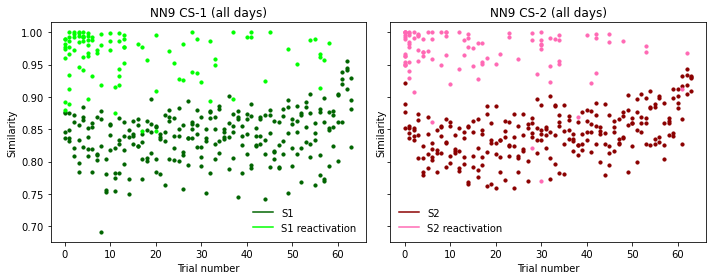

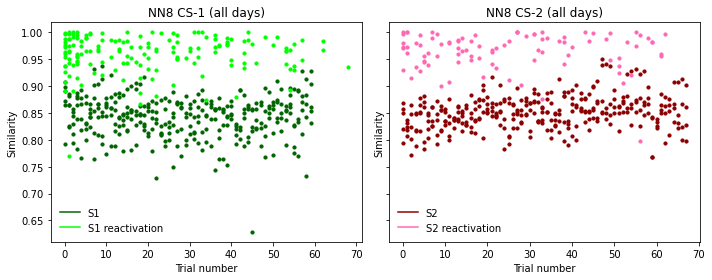

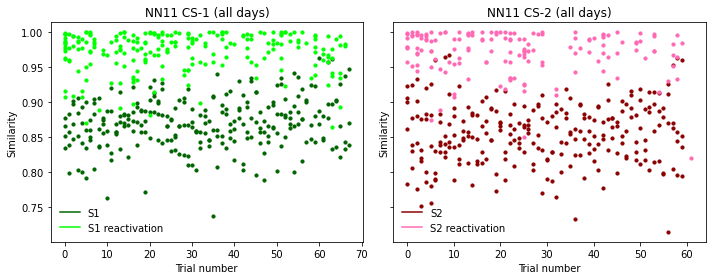

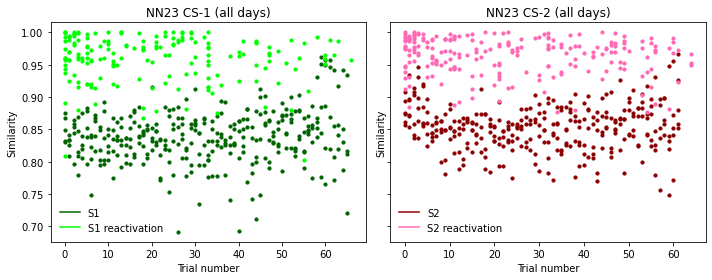

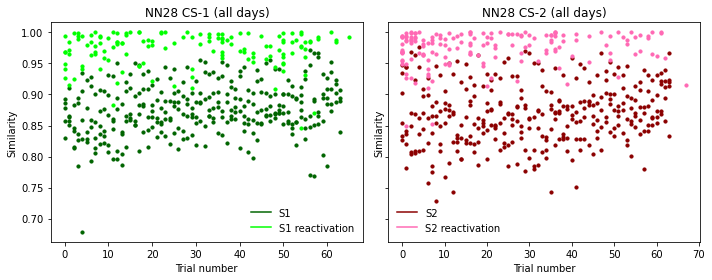

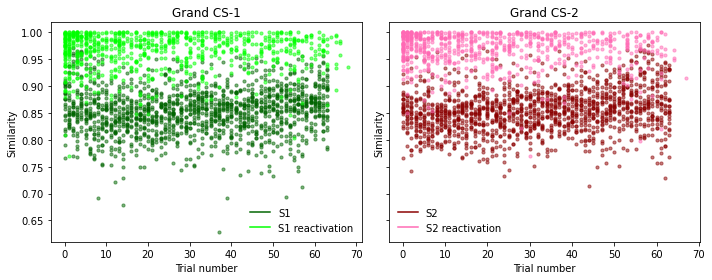

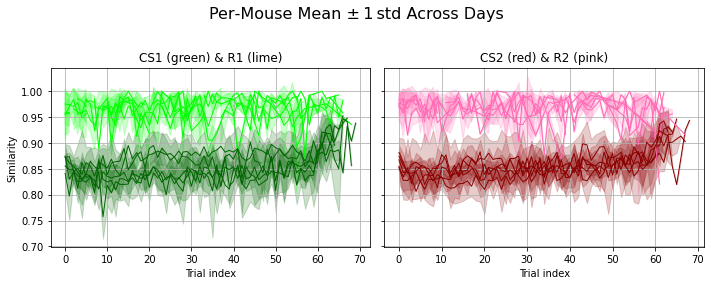

In [5]:
def plot_panel(ax, sim_cs, sim_r, trials_r, colors, labels, alpha, cs_x=None, reac_x=None):
    """
    If cs_x is given, use it for the CS scatter; otherwise default to range(len(sim_cs)).
    If reac_x is given, use it for the R scatter; otherwise use trials_r.
    """
    x_cs = cs_x if cs_x is not None else np.arange(len(sim_cs))
    x_r  = reac_x if reac_x is not None else trials_r

    ax.scatter(x_cs, sim_cs,   color=colors[0], s=10, alpha=alpha)
    ax.scatter(x_r,  sim_r,    color=colors[1], s=10, alpha=alpha)
    ax.set_xlabel('Trial number')
    ax.set_ylabel(labels[2])
    ax.legend(handles=[
        mlines.Line2D([], [], color=colors[0], label=labels[0]),
        mlines.Line2D([], [], color=colors[1], label=labels[1])
    ], frameon=False)
    return ax


def plot_mouse_summary(mouse, day_dict):
    # gather flat lists
    all_cs1, all_r1, all_t1 = [], [], []
    all_cs2, all_r2, all_t2 = [], [], []
    for out in day_dict.values():
        all_cs1.extend(out['sim_cs_1'])
        all_r1.extend(out['sim_r_1'])
        all_t1.extend(out['trial_r_1'])
        all_cs2.extend(out['sim_cs_2'])
        all_r2.extend(out['sim_r_2'])
        all_t2.extend(out['trial_r_2'])

    # figure out the original CS‐trial length
    first_out = next(iter(day_dict.values()))
    n_cs1 = len(first_out['sim_cs_1'])
    n_cs2 = len(first_out['sim_cs_2'])
    # tile 0..n_cs−1 across the concatenated list
    cs1_x = np.arange(len(all_cs1)) % n_cs1
    cs2_x = np.arange(len(all_cs2)) % n_cs2

    fig, axes = plt.subplots(1,2, figsize=(10,4), sharey=True)
    plot_panel(axes[0],
               sim_cs=all_cs1, sim_r=all_r1, trials_r=all_t1,
               colors=('darkgreen','lime'),
               labels=('S1','S1 reactivation','Similarity'),
               alpha=1,
               cs_x=cs1_x)

    axes[0].set_title(f"{mouse} CS-1 (all days)")
    plot_panel(axes[1],
               sim_cs=all_cs2, sim_r=all_r2, trials_r=all_t2,
               colors=('darkred','hotpink'),
               labels=('S2','S2 reactivation','Similarity'),
               alpha=1,
               cs_x=cs2_x)

    axes[1].set_title(f"{mouse} CS-2 (all days)")
    plt.tight_layout()
    plt.show()


def plot_grand_summary(day_outputs):
    all_cs1, all_r1, all_t1 = [], [], []
    all_cs2, all_r2, all_t2 = [], [], []
    for day_dict in day_outputs.values():
        for out in day_dict.values():
            all_cs1.extend(out['sim_cs_1'])
            all_r1.extend(out['sim_r_1'])
            all_t1.extend(out['trial_r_1'])
            all_cs2.extend(out['sim_cs_2'])
            all_r2.extend(out['sim_r_2'])
            all_t2.extend(out['trial_r_2'])

    # infer CS lengths from *any* single session
    any_out = next(iter(next(iter(day_outputs.values())).values()))
    n_cs1 = len(any_out['sim_cs_1'])
    n_cs2 = len(any_out['sim_cs_2'])
    cs1_x = np.arange(len(all_cs1)) % n_cs1
    cs2_x = np.arange(len(all_cs2)) % n_cs2

    trials1 = np.arange(n_cs1)
    mean_cs1 = [np.mean([v for v,x in zip(all_cs1, cs1_x) if x==t]) for t in trials1]
    trialsr1 = sorted(set(all_t1))
    mean_r1 = [np.mean([v for v,x in zip(all_r1, all_t1) if x==t]) for t in trialsr1]

    trials2 = np.arange(n_cs2)
    mean_cs2 = [np.mean([v for v,x in zip(all_cs2, cs2_x) if x==t]) for t in trials2]
    trialsr2 = sorted(set(all_t2))
    mean_r2 = [np.mean([v for v,x in zip(all_r2, all_t2) if x==t]) for t in trialsr2]

    fig, axes = plt.subplots(1,2, figsize=(10,4), sharey=True)
    plot_panel(axes[0],
               sim_cs=all_cs1, sim_r=all_r1, trials_r=all_t1,
               colors=('darkgreen','lime'),
               labels=('S1','S1 reactivation','Similarity'),
               alpha = 0.5,
               cs_x=cs1_x)
    axes[0].set_title("Grand CS-1")
    plot_panel(axes[1],
               sim_cs=all_cs2, sim_r=all_r2, trials_r=all_t2,
               colors=('darkred','hotpink'),
               labels=('S2','S2 reactivation','Similarity'),
               alpha = 0.5,
               cs_x=cs2_x)
    axes[1].set_title("Grand CS-2")
    plt.tight_layout()
    plt.show()

            # ─── Per‐mouse curves (thin line + ±1 std band, with padding) ───────────
    fig, axes = plt.subplots(1, 2, figsize=(10,4), sharey=True)
    fig.suptitle("Per‐Mouse Mean ± 1 std Across Days", fontsize=16)

    for mouse, days in day_outputs.items():
        # 1) find max CS1 / CS2 length for this mouse
        cs1_lens = [len(out['sim_cs_1']) for out in days.values()]
        cs2_lens = [len(out['sim_cs_2']) for out in days.values()]
        max_cs1 = max(cs1_lens)
        max_cs2 = max(cs2_lens)

        # 2) build padded matrix of shape (n_days, max_cs1)
        cs1_mat = []
        for out in days.values():
            arr = out['sim_cs_1']
            if len(arr) < max_cs1:
                pad = np.full(max_cs1 - len(arr), np.nan)
                arr = np.concatenate([arr, pad])
            cs1_mat.append(arr)
        cs1_mat = np.vstack(cs1_mat)  # now safe

        # same for CS2
        cs2_mat = []
        for out in days.values():
            arr = out['sim_cs_2']
            if len(arr) < max_cs2:
                pad = np.full(max_cs2 - len(arr), np.nan)
                arr = np.concatenate([arr, pad])
            cs2_mat.append(arr)
        cs2_mat = np.vstack(cs2_mat)

        # compute mean & std ignoring NaNs
        mean_cs1 = np.nanmean(cs1_mat, axis=0)
        std_cs1  = np.nanstd( cs1_mat, axis=0)
        mean_cs2 = np.nanmean(cs2_mat, axis=0)
        std_cs2  = np.nanstd( cs2_mat, axis=0)

        t_cs1 = np.arange(max_cs1)
        t_cs2 = np.arange(max_cs2)

        # 3) reactivation curves per mouse 
        all_r1    = np.concatenate([out['sim_r_1']   for out in days.values()])
        all_tr1   = np.concatenate([out['trial_r_1'] for out in days.values()])
        trial_idx1 = np.unique(all_tr1)
        mean_r1 = np.array([ all_r1[all_tr1==t].mean() for t in trial_idx1 ])
        std_r1  = np.array([ all_r1[all_tr1==t].std()  for t in trial_idx1 ])

        all_r2    = np.concatenate([out['sim_r_2']   for out in days.values()])
        all_tr2   = np.concatenate([out['trial_r_2'] for out in days.values()])
        trial_idx2 = np.unique(all_tr2)
        mean_r2 = np.array([ all_r2[all_tr2==t].mean() for t in trial_idx2 ])
        std_r2  = np.array([ all_r2[all_tr2==t].std()  for t in trial_idx2 ])

        ax = axes[0]
        ax.plot(t_cs1, mean_cs1, color='darkgreen', linewidth=1)
        ax.fill_between(t_cs1, mean_cs1-std_cs1, mean_cs1+std_cs1,
                        color='darkgreen', alpha=0.2)
        ax.plot(trial_idx1, mean_r1, color='lime', linewidth=1)
        ax.fill_between(trial_idx1, mean_r1-std_r1, mean_r1+std_r1,
                        color='lime', alpha=0.2)

        # CS2 & R2 on axes[1]
        ax = axes[1]
        ax.plot(t_cs2, mean_cs2, color='darkred', linewidth=1)
        ax.fill_between(t_cs2, mean_cs2-std_cs2, mean_cs2+std_cs2,
                        color='darkred', alpha=0.2)
        ax.plot(trial_idx2, mean_r2, color='hotpink', linewidth=1)
        ax.fill_between(trial_idx2, mean_r2-std_r2, mean_r2+std_r2,
                        color='hotpink', alpha=0.2)

    # decorate
    axes[0].set_title("CS1 (green) & R1 (lime)")
    axes[0].set_xlabel("Trial index")
    axes[0].set_ylabel("Similarity")
    axes[0].grid(True)

    axes[1].set_title("CS2 (red) & R2 (pink)")
    axes[1].set_xlabel("Trial index")
    axes[1].grid(True)

    plt.tight_layout(rect=[0,0,1,0.95])
    plt.show()



for mouse, days in day_outputs.items():
    plot_mouse_summary(mouse, days)

plot_grand_summary(day_outputs)


# Compare to first 3 stim-evoked trial means

(135,)
(120,)
(88,)
(86,)
(206,)
(179,)
(121,)
(83,)
(64,)
(118,)
(106,)
(85,)
(65,)
(194,)
(134,)
(90,)
(83,)
(69,)
(107,)
(141,)
(109,)
(45,)
(63,)


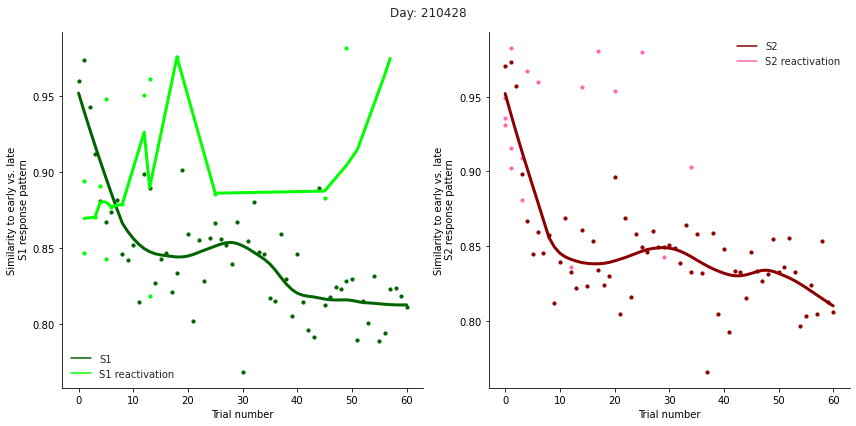

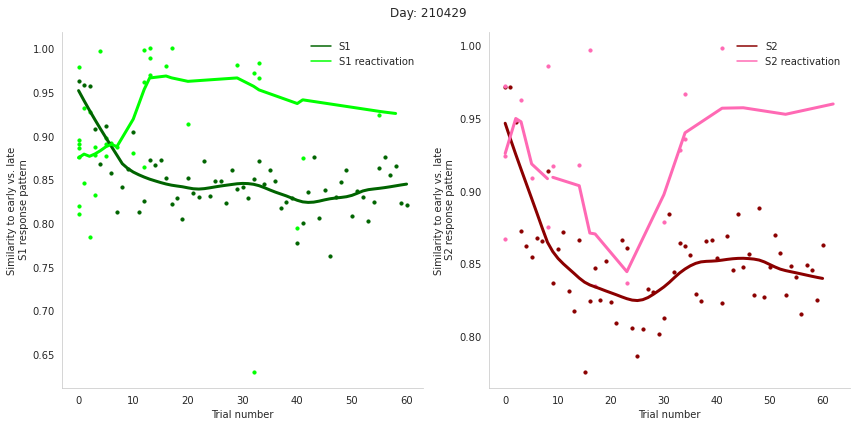

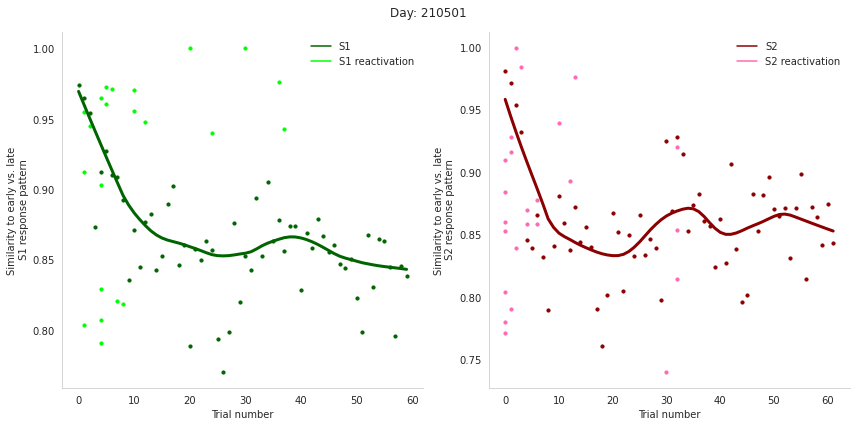

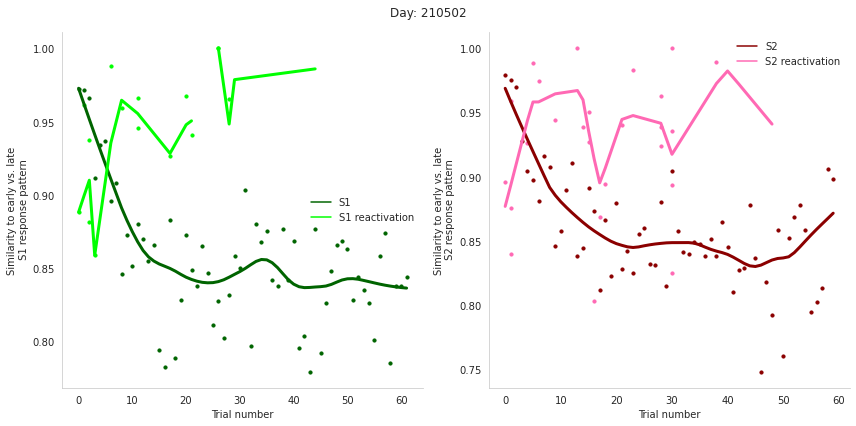

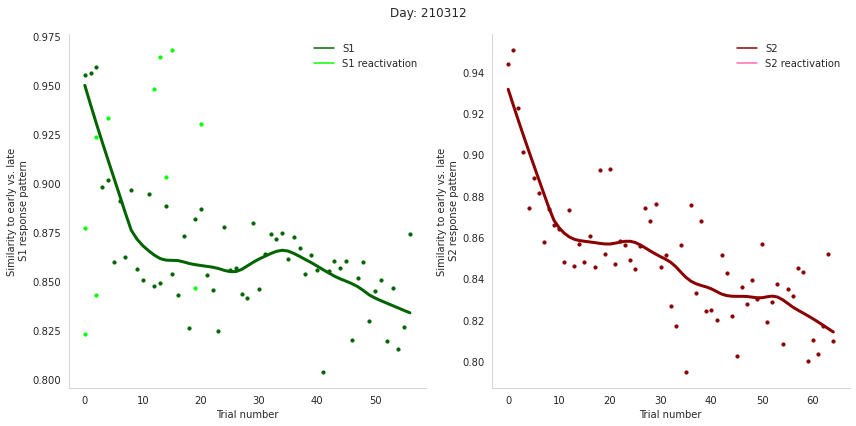

...

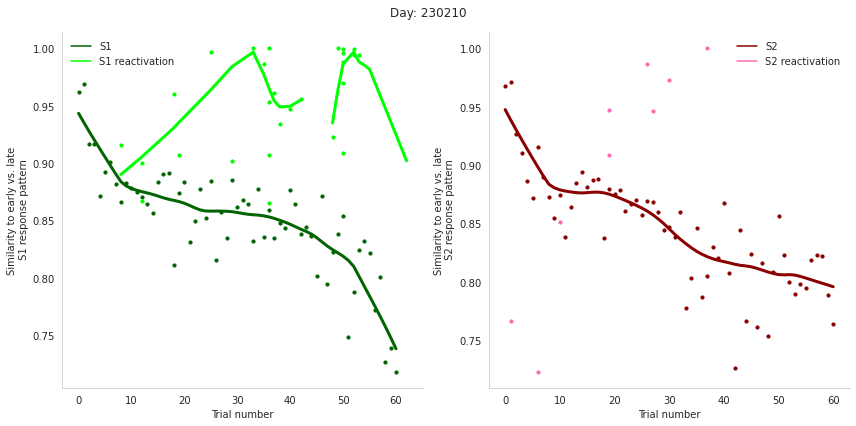

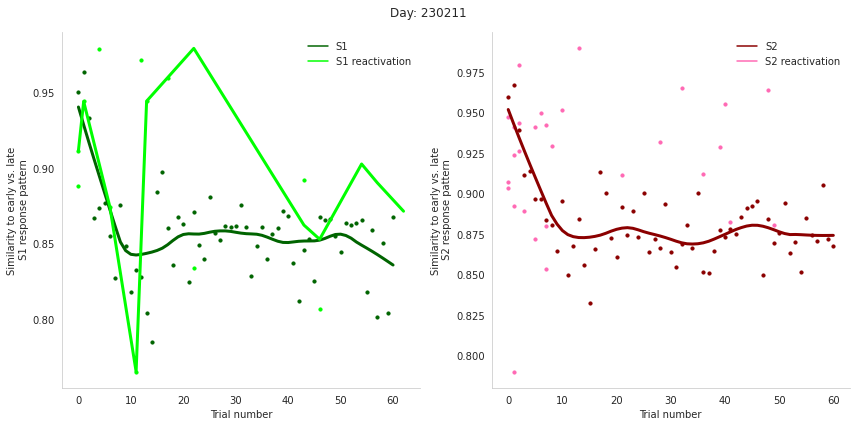

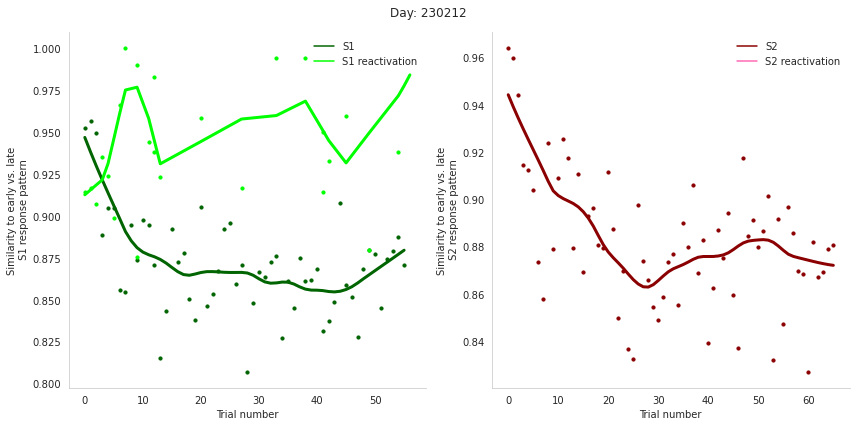

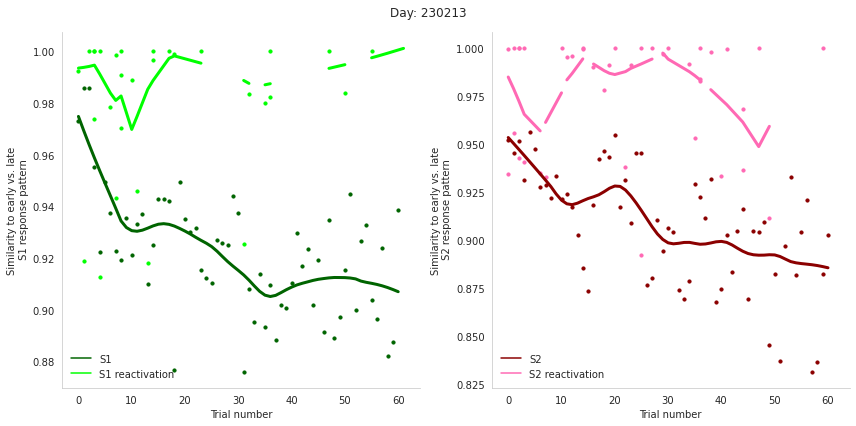

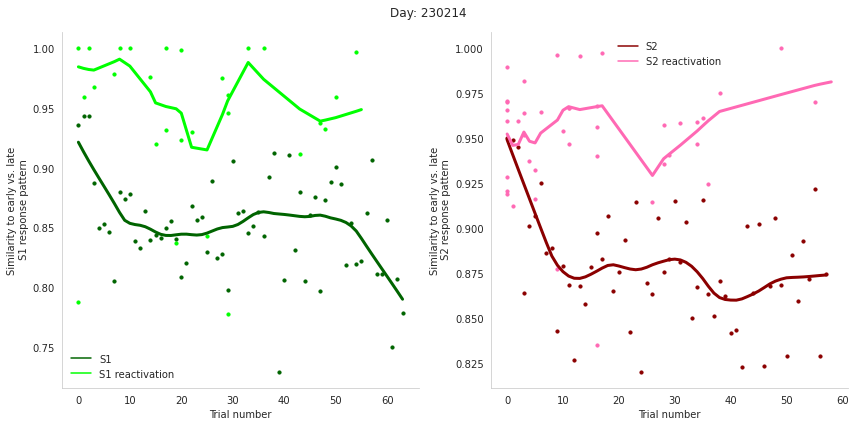

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.nonparametric.smoothers_lowess import lowess

def plot_panel_loess(ax, sim_cs, sim_r, trials_r, colors, labels, ylim=None):
    ax.scatter(range(len(sim_cs)), sim_cs, color=colors[0], s=10)
    ax.scatter(trials_r, sim_r, color=colors[1], s=10)
    ax.set_xlabel('Trial number')
    ax.set_ylabel(labels[2])
    ax.legend(handles=[
        mlines.Line2D([], [], color=colors[0], label=labels[0]),
        mlines.Line2D([], [], color=colors[1], label=labels[1])
    ], frameon=False)
    return ax

def reversed_target(day_outputs,
                    topn: float = 0.05,
                    plot_mouse: bool = True,
                    plot_grand: bool = True):
    reversed_target_computed = {}
    for mouse, dates_dict in day_outputs.items():
        reversed_target_computed[mouse] = {}

        for date, out in dates_dict.items():
            r1, r2 = out['mean_activity_r_1'], out['mean_activity_r_2']
            cs1, cs2 = out['mean_activity_cs_1'], out['mean_activity_cs_2']
            t1, t2 = out['trial_r_1'], out['trial_r_2']

            n_centroids = 3
            mean_activity_cs_1_mean = [np.mean(cs1[0:n_centroids], axis=0), np.mean(cs1[len(cs1) - n_centroids:len(cs1)], axis=0)]
            mean_activity_cs_2_mean = [np.mean(cs2[0:n_centroids], axis=0), np.mean(cs2[len(cs2) - n_centroids:len(cs1)], axis=0)]

            late_trails_1 = mean_activity_cs_1_mean[0]
            top_n_percent_indices_1 = np.argsort(late_trails_1)[-int(len(late_trails_1) * topn):]
            mean_activity_cstopn_1 = cs1[:, top_n_percent_indices_1]
            mean_activity_cstopn_1_late = mean_activity_cs_1_mean[0][top_n_percent_indices_1]

            late_trails_2 = mean_activity_cs_2_mean[0]
            top_n_percent_indices_2 = np.argsort(late_trails_2)[-int(len(late_trails_2) * topn):]
            print(top_n_percent_indices_2.shape)
            mean_activity_cstopn_2 = cs2[:, top_n_percent_indices_2]
            mean_activity_cstopn_2_late = mean_activity_cs_2_mean[0][top_n_percent_indices_2]

            sim_cs_1 = np.zeros(len(cs1))
            sim_cs_2 = np.zeros(len(cs2))

            cos_sim = lambda a, b: np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

            # Normalize the mean activities for each trial using the difference vectors.
            for i in range(0, len(cs1)):
                sim_cs_1[i] = cos_sim(mean_activity_cstopn_1[i], mean_activity_cstopn_1_late)
            for i in range(0, len(cs2)):
                sim_cs_2[i] = cos_sim(mean_activity_cstopn_2[i], mean_activity_cstopn_2_late)

            sim_r_1 = np.zeros(len(r1))
            sim_r_2 = np.zeros(len(r2))

            sim_r_1_random = np.zeros(len(r1))

            zero_indices = np.where(r1 != 0)
                
            for i in range(0, len(r1)):
                top_n_percent_indices_r_1 = np.argsort(r1[i])[-int(len(r1[i]) * topn):]
                sim_r_1[i] = cos_sim(r1[i][np.intersect1d(top_n_percent_indices_r_1, top_n_percent_indices_1)], mean_activity_cs_1_mean[1][np.intersect1d(top_n_percent_indices_r_1, top_n_percent_indices_1)])
                chosen_indices = np.random.randint(0, len(r1[i]), 27)
                sim_r_1_random[i] = cos_sim(r1[i][chosen_indices], mean_activity_cs_1_mean[1][chosen_indices])
            for i in range(0, len(r2)):
                top_n_percent_indices_r_2 = np.argsort(r2[i])[-int(len(r2[i]) * topn):]
                sim_r_2[i] = cos_sim(r2[i][np.intersect1d(top_n_percent_indices_r_2, top_n_percent_indices_2)], mean_activity_cs_2_mean[1][np.intersect1d(top_n_percent_indices_r_2, top_n_percent_indices_2)])

            fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)
            sns.set_style("whitegrid", {'axes.grid': False})

            plot_panel_loess(axes[0], sim_cs_1[:-3], sim_r_1[:-3], t1[:-3],
                    ('darkgreen', 'lime'), ('S1', 'S1 reactivation', 'Similarity to early vs. late\n S1 response pattern'))
            plot_panel_loess(axes[1], sim_cs_2[:-3], sim_r_2[:-3], t2[:-3],
                    ('darkred', 'hotpink'), ('S2', 'S2 reactivation', 'Similarity to early vs. late\n S2 response pattern'))

            # Apply LOESS smoothing
            def add_loess(ax, x, y, color, window):
                lo = Loess(x, y)
                xs, ys = zip(*[
                    (xi, lo.estimate(xi, window=window, use_matrix=False, degree=1))
                    for xi in range(max(x) + 1)
                ])
                print("Non-NaN smoothed points:", sum(~np.isnan(ys)))
                ax.plot(xs, ys, color=color, linewidth=3)

            #Loess doesnt always add the line
            #window1 = max(20, len(sim_cs_1) // 3)
            #add_loess(axes[0], list(range(len(sim_cs_1))), sim_cs_1, 'darkgreen', window1)
            #add_loess(axes[0], trial_r_1, sim_r_1, 'lime', min(window1, len(sim_r_1)))

            #window2 = max(20, len(sim_cs_2) // 3)
            #add_loess(axes[1], list(range(len(sim_cs_2))), sim_cs_2, 'darkred', window2)
            #add_loess(axes[1], trial_r_2, sim_r_2, 'hotpink', min(window2, len(sim_r_2)))


            x_cs1 = list(range(len(sim_cs_1)))
            smoothed_cs1 = lowess(endog=sim_cs_1[:-3], exog=x_cs1[:-3], frac=0.3, return_sorted=False)
            x_r1 = t1
            smoothed_r1 = lowess(endog=sim_r_1, exog=x_r1, frac=0.3, return_sorted=False)
            axes[0].plot(x_cs1[:-3], smoothed_cs1, color='darkgreen', linewidth=3)
            axes[0].plot(x_r1, smoothed_r1, color='lime', linewidth=3)


            x_cs2 = list(range(len(sim_cs_2)))
            smoothed_cs2 = lowess(endog=sim_cs_2[:-3], exog=x_cs2[:-3], frac=0.3, return_sorted=False)
            x_r2 = t2
            smoothed_r2 = lowess(endog=sim_r_2, exog=x_r2, frac=0.3, return_sorted=False)
            axes[1].plot(x_cs2[:-3], smoothed_cs2, color='darkred', linewidth=3)
            axes[1].plot(x_r2, smoothed_r2, color='hotpink', linewidth=3)


            for ax in axes.flatten():
                sns.despine(ax=ax)
            fig.suptitle(f"Day: {date}")
            fig.tight_layout()


            reversed_target_computed[mouse][date] = {
                'sim_cs_1': sim_cs_1,
                'sim_r_1':  sim_r_1,
                'sim_cs_2': sim_cs_2,
                'sim_r_2':  sim_r_2,
                'trial_r_1': t1,
                'trial_r_2': t2,
                'mean_activity_cs_1': cs1,
                'mean_activity_cs_2': cs2,
                'mean_activity_r_1':  r1,
                'mean_activity_r_2':  r2
            }

    return reversed_target_computed


reversed_target_computed = reversed_target(day_outputs,
                    topn=0.05,
                    plot_mouse=True,
                    plot_grand=True)



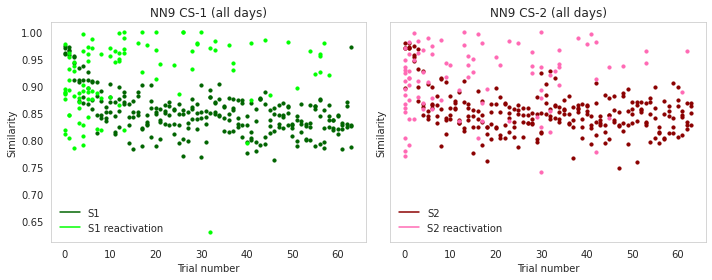

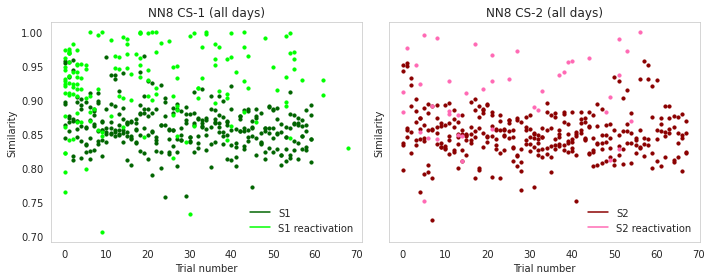

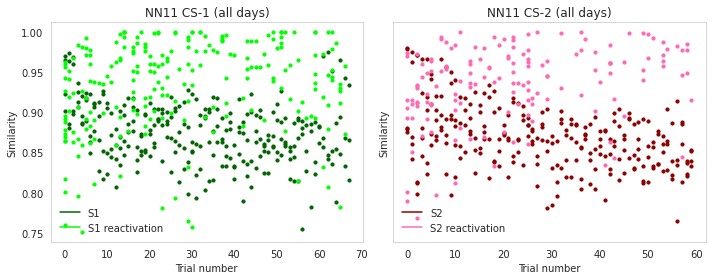

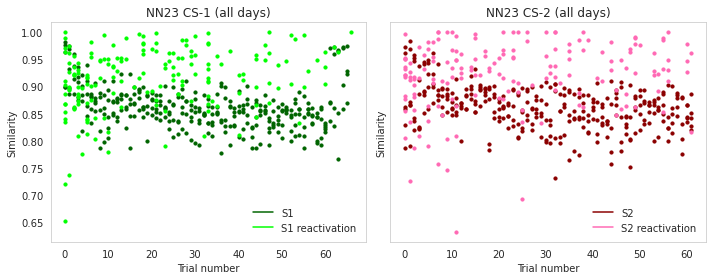

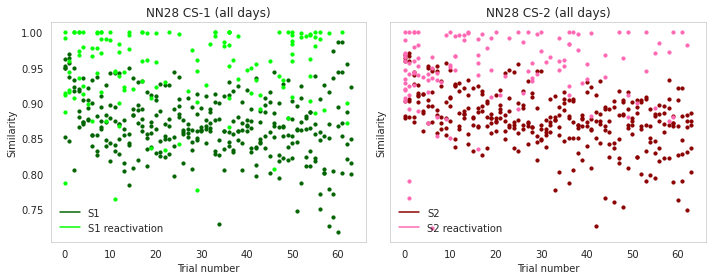

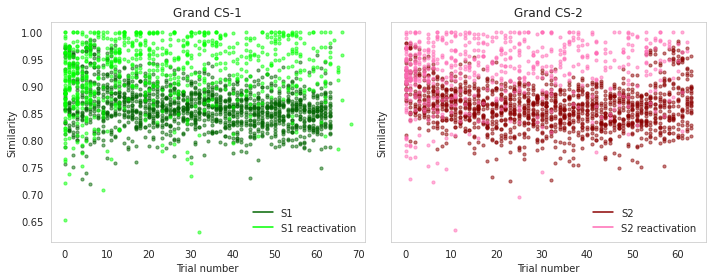

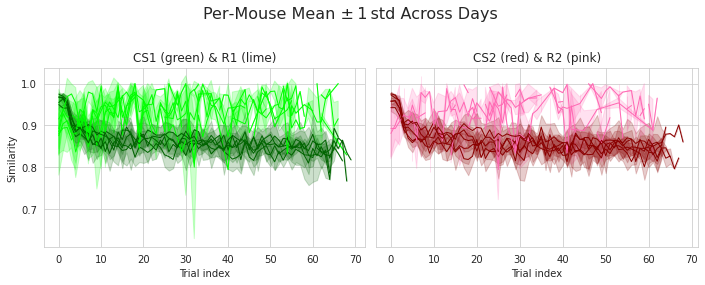

In [7]:
for mouse, days in reversed_target_computed.items():
    plot_mouse_summary(mouse, days)

plot_grand_summary(reversed_target_computed)

# Ensembles

In [ ]:
def ensembles(mean_activity, top_pct, n_last):
    n_trials, n_neurons = mean_activity.shape
    last_idx = np.arange(max(0, n_trials - n_last), n_trials)
    k = max(1, int(np.ceil(top_pct * n_neurons)))

    print('# of top neurons', n_neurons * top_pct)

    top_ind = {}
    for t in last_idx:
        resp = np.abs(mean_activity[t])
        top_idx = np.argsort(resp)[-k:]
        top_ind[t] = top_idx

    records = []
    for t1, t2 in zip(last_idx[:-1], last_idx[1:]):
        set1 = set(top_ind[t1])
        set2 = set(top_ind[t2])
        overlap = sorted(set1 & set2)
        overlap_count = len(overlap)
        overlap_pct = overlap_count / k
        records.append({'trial': t1,
                        'next_trial': t2,
                        'overlap count': overlap_count,
                        'overlap pct': overlap_pct,
                        'overlap indices': overlap})

    overlap_df = pd.DataFrame.from_records(records)

    all_top = np.concatenate([top_ind[t] for t in last_idx])
    counts = pd.Series(all_top).value_counts().sort_values(ascending=False)

    all_neurons = pd.Series(np.arange(n_neurons))
    consistency_counts = all_neurons.map(counts).fillna(0).astype(int)
    consistency_counts.index = np.arange(n_neurons)
    consistency_counts.name = 'count_in_top'
    consistency_counts = consistency_counts.sort_values(ascending=False)
    #consistency_counts = consistency_counts[consistency_counts > 5]

    return top_ind, overlap_df, consistency_counts

def day_ensemble_summary(day_outputs, top_pct=0.05, n_last=15):
    """
    For each day in day_outputs, run `ensembles` on CS1 and CS2 data,
    print the overlap tables, and plot stability curves.

    Parameters
    ----------
    day_outputs : dict
        Mapping date string -> dict containing keys
          'mean_activity_cs_1', 'mean_activity_cs_2', etc.
    top_pct : float
        Fraction of neurons to take as “top active.”
    n_last : int
        Number of last trials to analyze.

    Returns
    -------
    summary : dict
        Mapping date -> {
          'cs1': (top_ind1, overlap_df1, consistency1),
          'cs2': (top_ind2, overlap_df2, consistency2)
        }
    """

    summary = {}

    for mouse, date_dict in day_outputs.items():
        summary[mouse] = {}
        for date, out in date_dict.items():
            print(f"\n{mouse}")
            print(f"\n=== Ensemble stability for {date} ===")
            m1 = out['mean_activity_cs_1']
            m2 = out['mean_activity_cs_2']

            # run your existing ensembles function
            top1, overlap1, cons1 = ensembles(m1, top_pct, n_last)
            top2, overlap2, cons2 = ensembles(m2, top_pct, n_last)

            # print the overlap tables
            #print(f"\nCS-1 overlap (last {n_last} trials):")
            #display(overlap1)       # or print(overlap1) in plain scripts
            #print(f"\nCS-2 overlap (last {n_last} trials):")
            #display(overlap2)

            # quick stats
            #print(f"CS-1   mean overlap pct: {overlap1['overlap pct'].mean():.3f}")
            #print(f"CS-2   mean overlap pct: {overlap2['overlap pct'].mean():.3f}")
            #print(f"CS-1   top‐neuron consistency top counts:\n{cons1.head(5)}")
            #print(f"CS-2   top‐neuron consistency top counts:\n{cons2.head(5)}")

            # side‐by‐side plots
            fig, axes = plt.subplots(1,2, figsize=(10,4), sharey=True)
            axes[0].plot(overlap1['trial'], overlap1['overlap count'], '-o', color='darkgreen')
            axes[0].set_title(f"{date} CS-1 Ensemble Stability")
            axes[0].set_xlabel('Trial'); axes[0].set_ylabel('Overlap count')
            axes[0].grid(True)

            axes[1].plot(overlap2['trial'], overlap2['overlap count'], '-o', color='darkred')
            axes[1].set_title(f"{date} CS-2 Ensemble Stability")
            axes[1].set_xlabel('Trial')
            axes[1].grid(True)

            plt.tight_layout()
            plt.show()

            # store the results
            summary[mouse][date] = {
                'cs1': (top1, overlap1, cons1),
                'cs2': (top2, overlap2, cons2)
            }

    return summary

ensemble_summary = day_ensemble_summary(
    day_outputs,
    top_pct=0.05,
    n_last=15
)

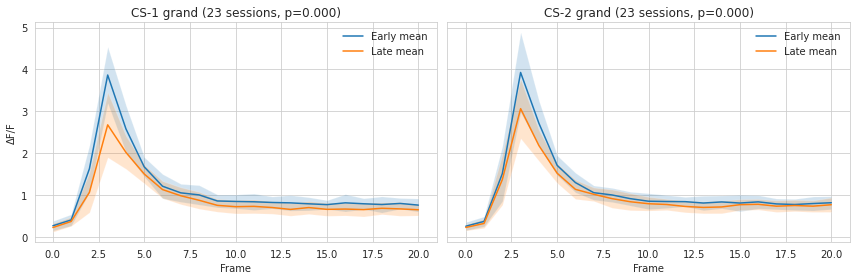

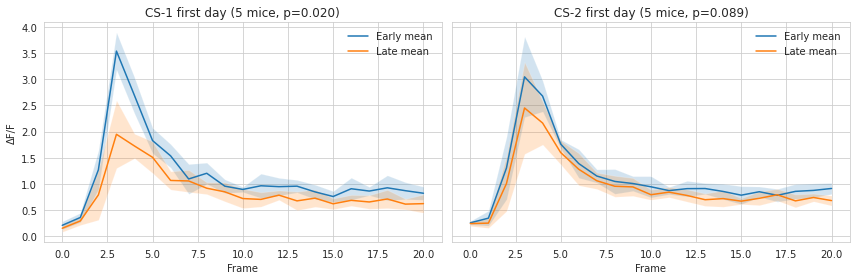

In [18]:
from scipy.stats import ttest_rel

def analyze_early_late_all_days(
    day_outputs,
    crop_frames=22,
    early_cs1_slice=slice(0,5),
    late_cs1_slice =slice(-10,-5),
    early_cs2_slice=slice(0,5),
    late_cs2_slice =slice(35,40)
):
    """
    day_outputs: dict of mouse -> dict of date -> day_results
    Removes per-day plotting; returns per_day dict and shows two summary figures:
      1) grand mean across all mice & days
      2) mean across mice on their first day only
    """
    per_day = {}

    for mouse, dates_dict in day_outputs.items():
        per_day[mouse] = {}
        for date, dr in dates_dict.items():
            beh  = dr['behavior']
            act  = dr['activity']  # neurons x frames x trials

            # build trial lists
            raw_any, raw_cs1, raw_cs2 = [], [], []
            for on, off, cue in zip(beh['onsets'], beh['offsets'], beh['cue_codes']):
                s, e = int(on), int(off)+1
                trial = act[:, s:e][:, :crop_frames]
                raw_any.append(trial)
                if cue == beh['cs_1_code']:
                    raw_cs1.append(trial)
                elif cue == beh['cs_2_code']:
                    raw_cs2.append(trial)

            # trim to equal length then stack
            def trim_to_min(trials):
                if not trials: return trials
                m = min(t.shape[1] for t in trials)
                return [t[:, :m] for t in trials]

            raw_cs1 = np.stack(trim_to_min(raw_cs1), axis=2)
            raw_cs2 = np.stack(trim_to_min(raw_cs2), axis=2)

            any_arr = np.stack(trim_to_min(raw_any), axis=2)
            baseline = any_arr.mean(axis=(1,2))
            raw_cs1 /= baseline[:, None, None]
            raw_cs2 /= baseline[:, None, None]

            # mean over neurons → time x trials
            mt1 = raw_cs1[0:21].mean(axis=0)
            mt2 = raw_cs2[0:21].mean(axis=0)
            time = np.arange(mt1.shape[0])

            # split into early vs late trials
            e1 = mt1[:, early_cs1_slice];  l1 = mt1[:, late_cs1_slice]
            e2 = mt2[:, early_cs2_slice];  l2 = mt2[:, late_cs2_slice]

            # mean & sem over trials → time course
            em1 = e1.mean(axis=1);  es1 = e1.std(axis=1, ddof=1)/np.sqrt(e1.shape[1])
            lm1 = l1.mean(axis=1);  ls1 = l1.std(axis=1, ddof=1)/np.sqrt(l1.shape[1])
            em2 = e2.mean(axis=1);  es2 = e2.std(axis=1, ddof=1)/np.sqrt(e2.shape[1])
            lm2 = l2.mean(axis=1);  ls2 = l2.std(axis=1, ddof=1)/np.sqrt(l2.shape[1])

            # paired AUC test across trials
            auc_e1 = np.trapz(e1, dx=1, axis=0)
            auc_l1 = np.trapz(l1, dx=1, axis=0)
            _, p1  = ttest_rel(auc_e1, auc_l1)

            auc_e2 = np.trapz(e2, dx=1, axis=0)
            auc_l2 = np.trapz(l2, dx=1, axis=0)
            _, p2  = ttest_rel(auc_e2, auc_l2)

            per_day[mouse][date] = {
                'em1': em1, 'es1': es1, 'lm1': lm1, 'ls1': ls1,
                'em2': em2, 'es2': es2, 'lm2': lm2, 'ls2': ls2,
                'p1': p1, 'p2': p2,
                'time': time
            }

    all_em1, all_lm1 = [], []
    all_em2, all_lm2 = [], []
    for mouse, days in per_day.items():
        for stats in days.values():
            all_em1.append(stats['em1'])
            all_lm1.append(stats['lm1'])
            all_em2.append(stats['em2'])
            all_lm2.append(stats['lm2'])

    min_t = min(arr.shape[0] for arr in all_em1 + all_lm1 + all_em2 + all_lm2)

    # truncate then stack
    em1_arr = np.vstack([a[:min_t] for a in all_em1])
    lm1_arr = np.vstack([a[:min_t] for a in all_lm1])
    em2_arr = np.vstack([a[:min_t] for a in all_em2])
    lm2_arr = np.vstack([a[:min_t] for a in all_lm2])
    t       = stats['time'][:min_t]

    # Means & stds
    m_em1, s_em1 = em1_arr.mean(0), em1_arr.std(0)
    m_lm1, s_lm1 = lm1_arr.mean(0), lm1_arr.std(0)
    m_em2, s_em2 = em2_arr.mean(0), em2_arr.std(0)
    m_lm2, s_lm2 = lm2_arr.mean(0), lm2_arr.std(0)

    # Grand AUC test (across recordings)
    auc_e1_all = np.trapz(em1_arr, dx=1, axis=1)
    auc_l1_all = np.trapz(lm1_arr, dx=1, axis=1)
    _, p1_all  = ttest_rel(auc_e1_all, auc_l1_all)

    auc_e2_all = np.trapz(em2_arr, dx=1, axis=1)
    auc_l2_all = np.trapz(lm2_arr, dx=1, axis=1)
    _, p2_all  = ttest_rel(auc_e2_all, auc_l2_all)

    fig, axs = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
    # CS1 grand
    axs[0].plot(t, m_em1, label='Early mean');   axs[0].fill_between(t, m_em1-s_em1, m_em1+s_em1, alpha=0.2)
    axs[0].plot(t, m_lm1, label='Late mean');    axs[0].fill_between(t, m_lm1-s_lm1, m_lm1+s_lm1, alpha=0.2)
    axs[0].set_title(f"CS-1 grand ({em1_arr.shape[0]} sessions, p={p1_all:.3f})")
    axs[0].set_xlabel('Frame'); axs[0].set_ylabel('ΔF/F')
    axs[0].legend(frameon=False); axs[0].grid(True)

    # CS2 grand
    axs[1].plot(t, m_em2, label='Early mean');   axs[1].fill_between(t, m_em2-s_em2, m_em2+s_em2, alpha=0.2)
    axs[1].plot(t, m_lm2, label='Late mean');    axs[1].fill_between(t, m_lm2-s_lm2, m_lm2+s_lm2, alpha=0.2)
    axs[1].set_title(f"CS-2 grand ({em2_arr.shape[0]} sessions, p={p2_all:.3f})")
    axs[1].set_xlabel('Frame'); axs[1].legend(frameon=False); axs[1].grid(True)

    plt.tight_layout()
    plt.show()

    first_em1, first_lm1 = [], []
    first_em2, first_lm2 = [], []

    for mouse, days in per_day.items():
        first_date = sorted(days.keys())[0]
        s = days[first_date]
        first_em1.append(s['em1'])
        first_lm1.append(s['lm1'])
        first_em2.append(s['em2'])
        first_lm2.append(s['lm2'])

    # truncate all to the same minimum length
    min_t_fd = min(arr.shape[0]
                   for arr in (first_em1 + first_lm1 + first_em2 + first_lm2))
    first_em1 = [a[:min_t_fd] for a in first_em1]
    first_lm1 = [a[:min_t_fd] for a in first_lm1]
    first_em2 = [a[:min_t_fd] for a in first_em2]
    first_lm2 = [a[:min_t_fd] for a in first_lm2]

    # stack into arrays
    f_em1_arr = np.vstack(first_em1)
    f_lm1_arr = np.vstack(first_lm1)
    f_em2_arr = np.vstack(first_em2)
    f_lm2_arr = np.vstack(first_lm2)

    # time-vector for first-day plots
    t_fd = s['time'][:min_t_fd]

    # compute mean & std
    m_fe1, s_fe1 = f_em1_arr.mean(0), f_em1_arr.std(0)
    m_fl1, s_fl1 = f_lm1_arr.mean(0), f_lm1_arr.std(0)
    m_fe2, s_fe2 = f_em2_arr.mean(0), f_em2_arr.std(0)
    m_fl2, s_fl2 = f_lm2_arr.mean(0), f_lm2_arr.std(0)

    # paired‐AUC test
    auc_fe1 = np.trapz(f_em1_arr, dx=1, axis=1)
    auc_fl1 = np.trapz(f_lm1_arr, dx=1, axis=1)
    _, p1_fd = ttest_rel(auc_fe1, auc_fl1)

    auc_fe2 = np.trapz(f_em2_arr, dx=1, axis=1)
    auc_fl2 = np.trapz(f_lm2_arr, dx=1, axis=1)
    _, p2_fd = ttest_rel(auc_fe2, auc_fl2)

    # plotting
    fig, axs = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
    # CS-1 first day
    axs[0].plot(t_fd, m_fe1, label='Early mean')
    axs[0].fill_between(t_fd, m_fe1 - s_fe1, m_fe1 + s_fe1, alpha=0.2)
    axs[0].plot(t_fd, m_fl1, label='Late mean')
    axs[0].fill_between(t_fd, m_fl1 - s_fl1, m_fl1 + s_fl1, alpha=0.2)
    axs[0].set_title(f"CS-1 first day ({f_em1_arr.shape[0]} mice, p={p1_fd:.3f})")
    axs[0].set_xlabel('Frame'); axs[0].set_ylabel('ΔF/F')
    axs[0].legend(frameon=False); axs[0].grid(True)

    # CS-2 first day
    axs[1].plot(t_fd, m_fe2, label='Early mean')
    axs[1].fill_between(t_fd, m_fe2 - s_fe2, m_fe2 + s_fe2, alpha=0.2)
    axs[1].plot(t_fd, m_fl2, label='Late mean')
    axs[1].fill_between(t_fd, m_fl2 - s_fl2, m_fl2 + s_fl2, alpha=0.2)
    axs[1].set_title(f"CS-2 first day ({f_em2_arr.shape[0]} mice, p={p2_fd:.3f})")
    axs[1].set_xlabel('Frame'); axs[1].legend(frameon=False); axs[1].grid(True)

    plt.tight_layout()
    plt.show()



summary_neuralresp_days = analyze_early_late_all_days(day_outputs)



--- Drift curves for 210428 ---


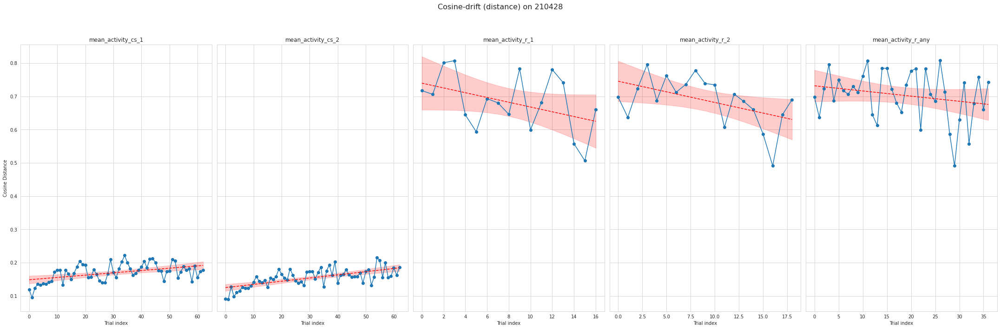


--- Drift curves for 210429 ---


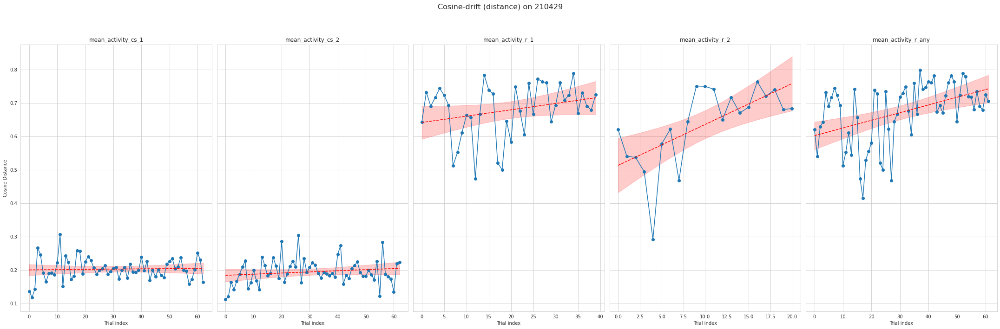


--- Drift curves for 210501 ---


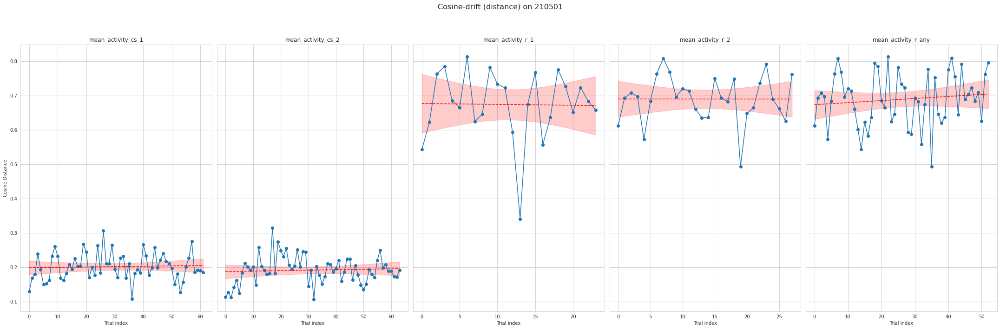


--- Drift curves for 210502 ---


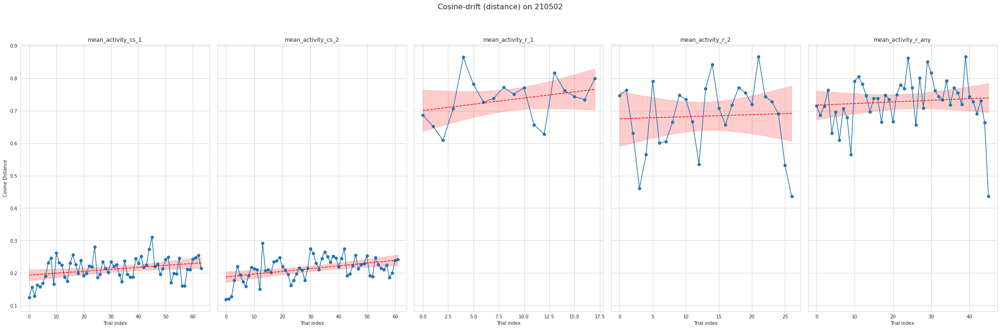


--- Drift curves for 210312 ---


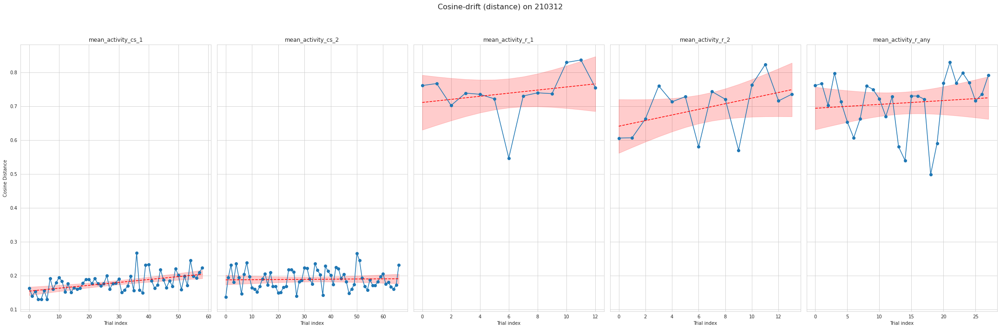


--- Drift curves for 210314 ---


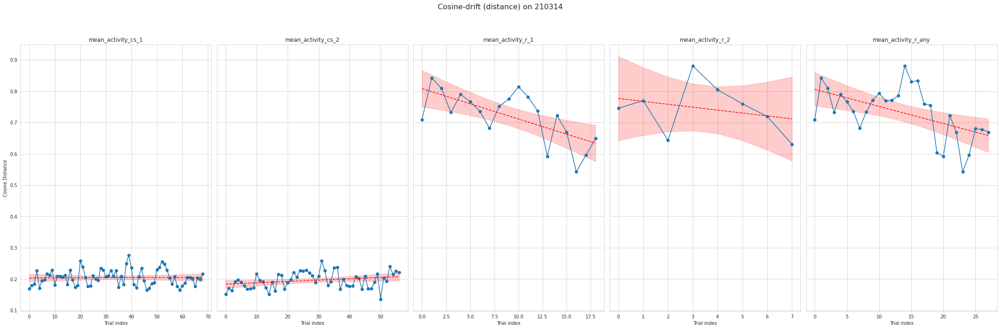


--- Drift curves for 210316 ---


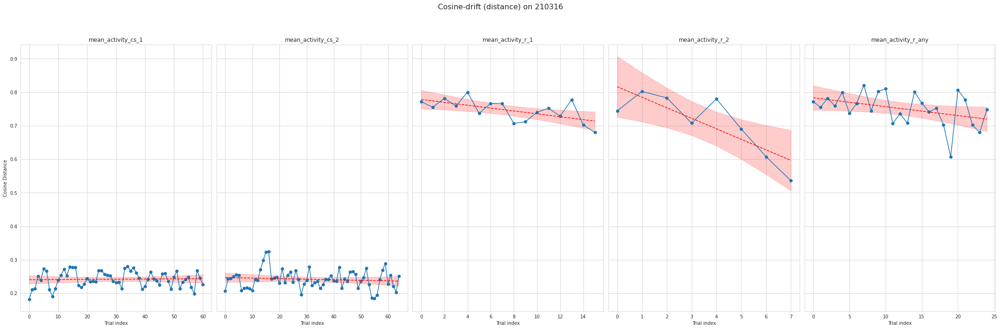


--- Drift curves for 210318 ---


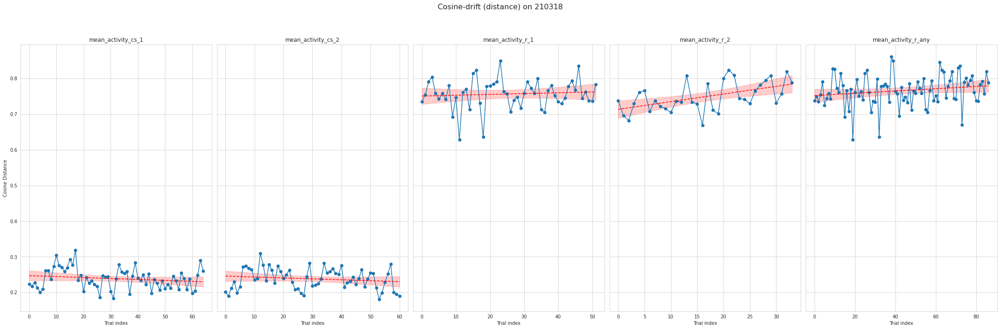


--- Drift curves for 210320 ---


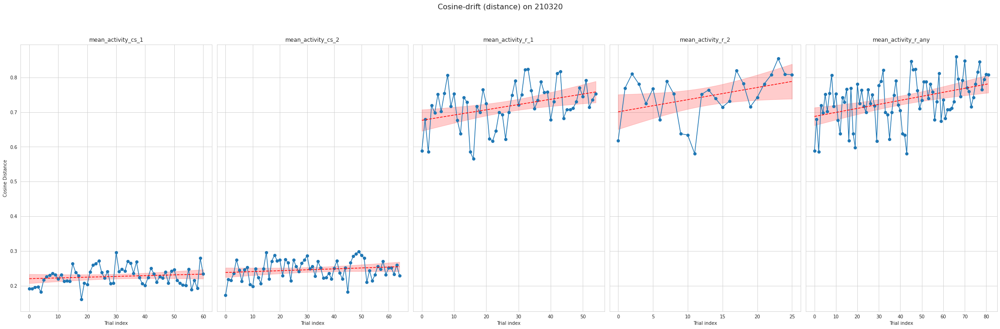


--- Drift curves for 210626 ---


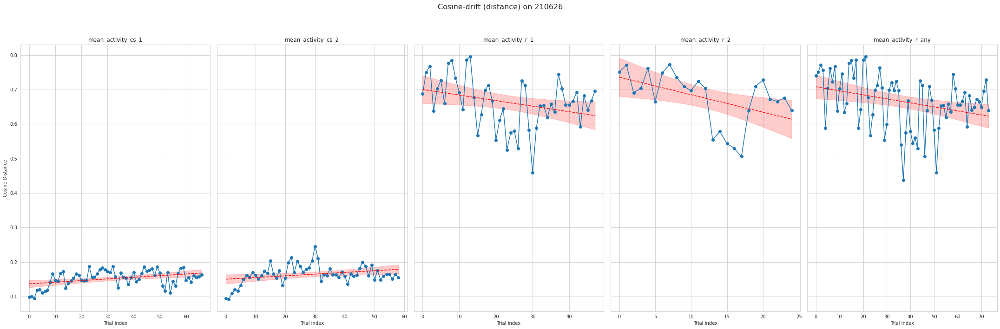


--- Drift curves for 210627 ---


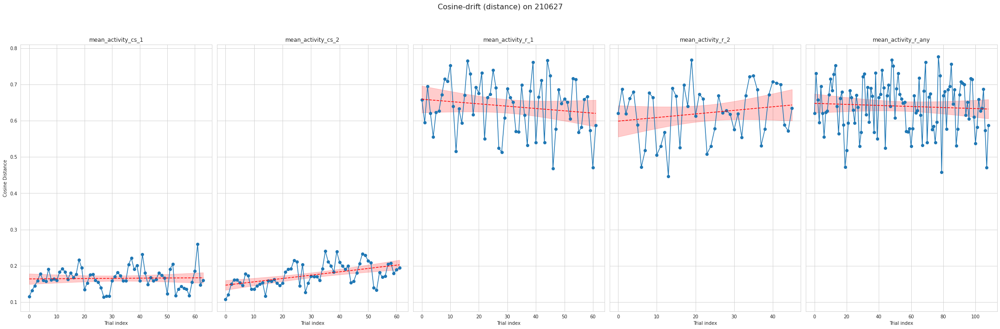


--- Drift curves for 210628 ---


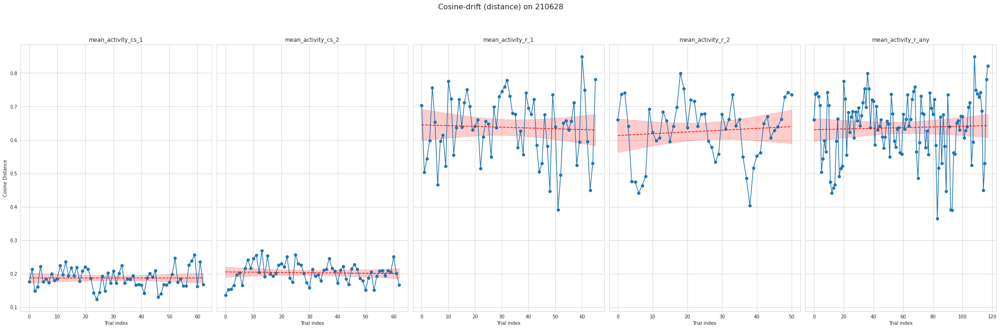


--- Drift curves for 210629 ---


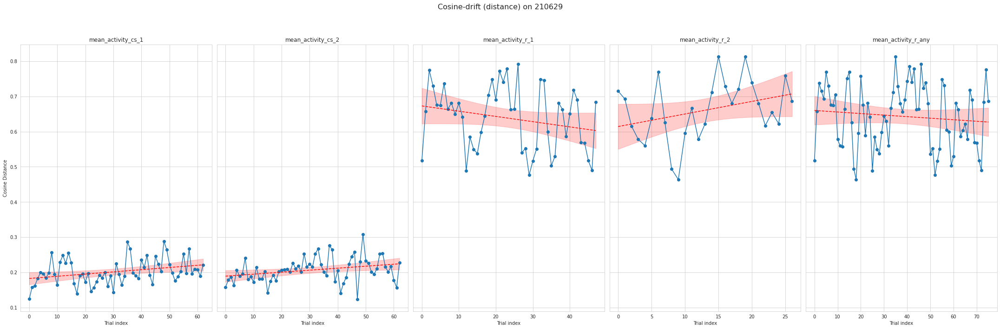


--- Drift curves for 220416 ---


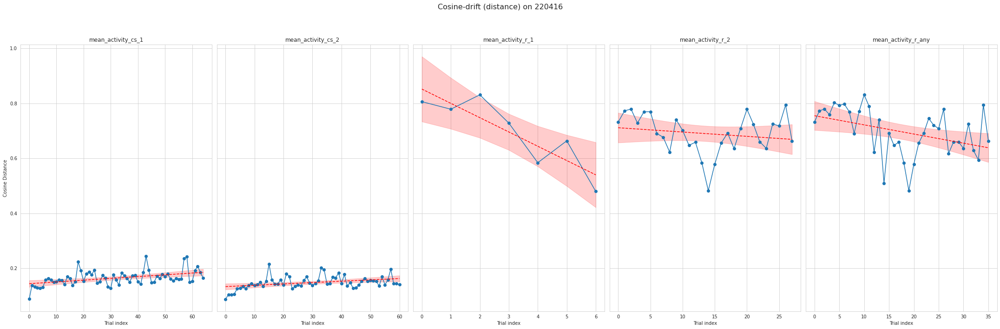


--- Drift curves for 220417 ---


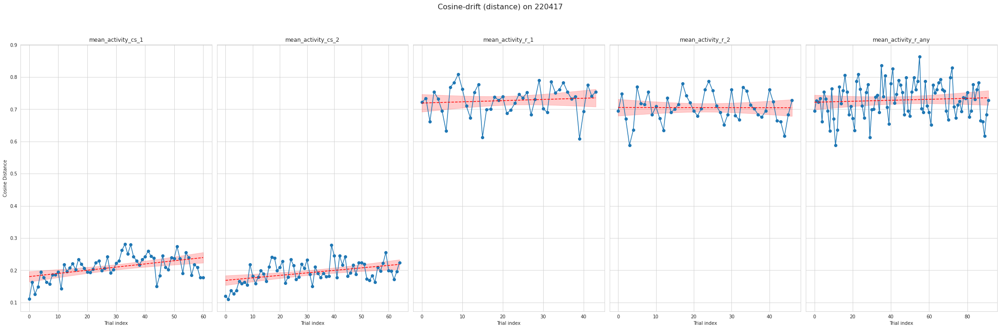


--- Drift curves for 220418 ---


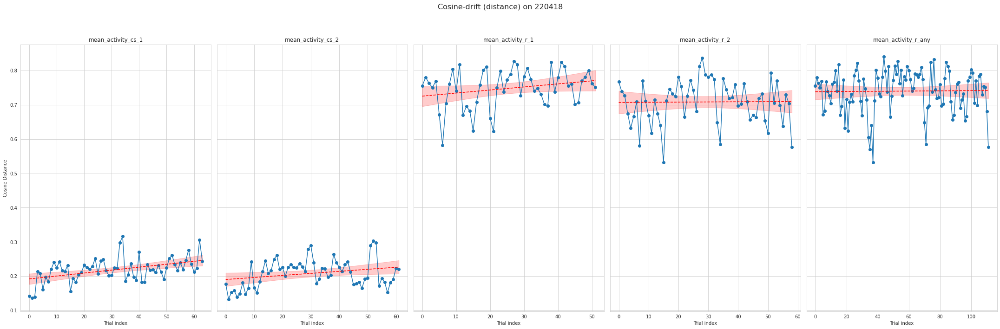


--- Drift curves for 220419 ---


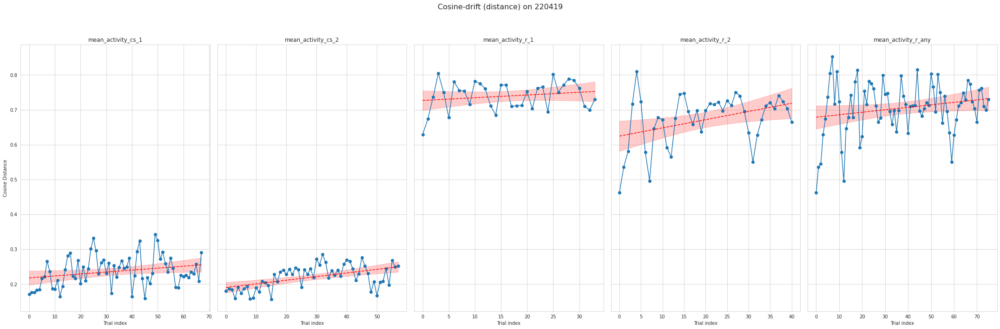


--- Drift curves for 220420 ---


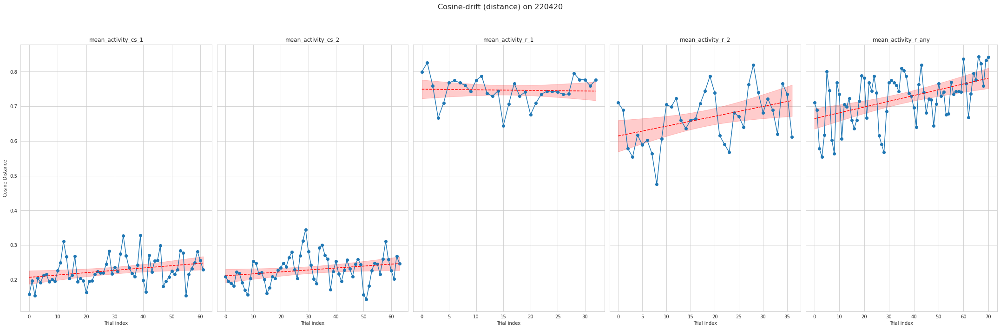


--- Drift curves for 230210 ---


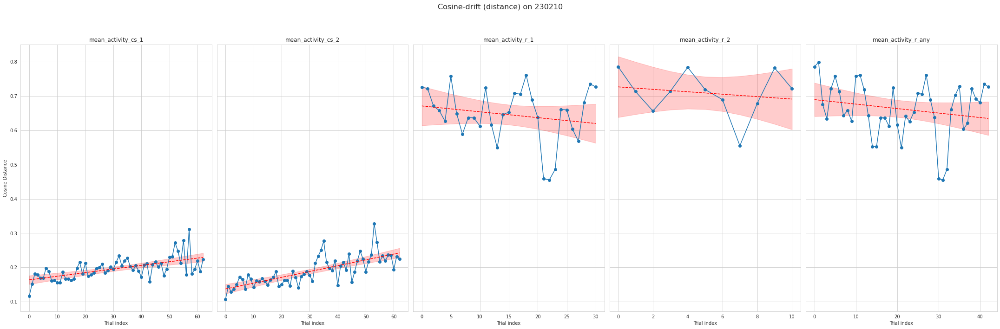


--- Drift curves for 230211 ---


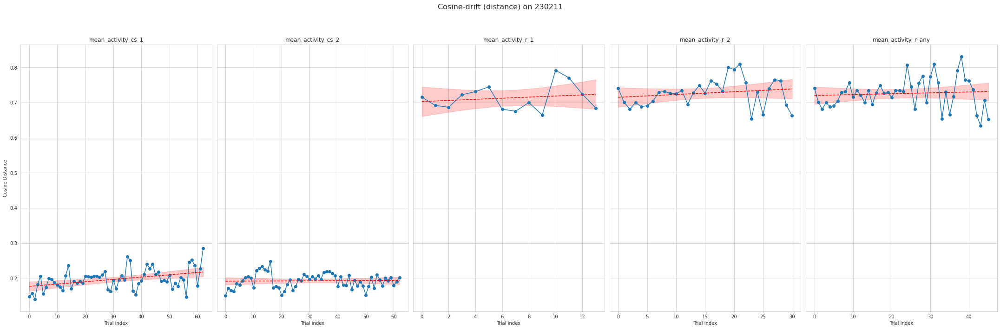


--- Drift curves for 230212 ---


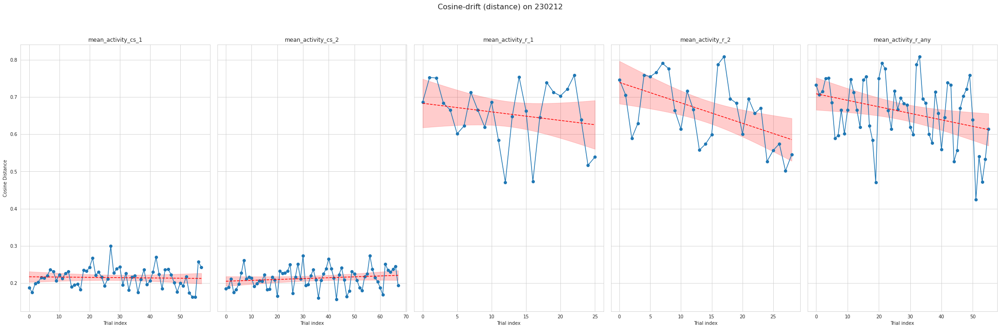


--- Drift curves for 230213 ---


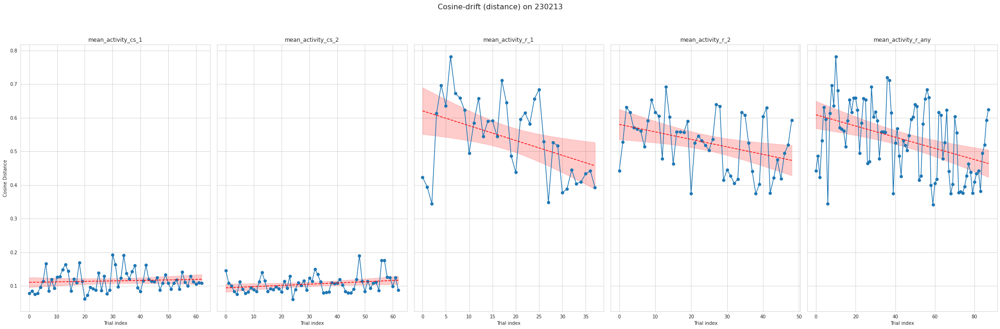


--- Drift curves for 230214 ---


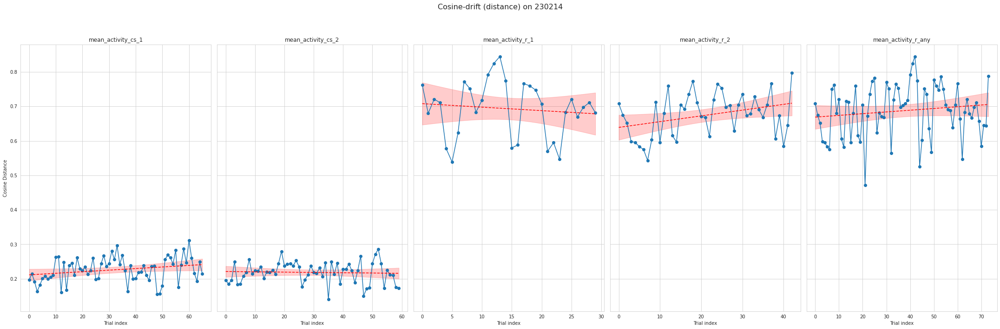

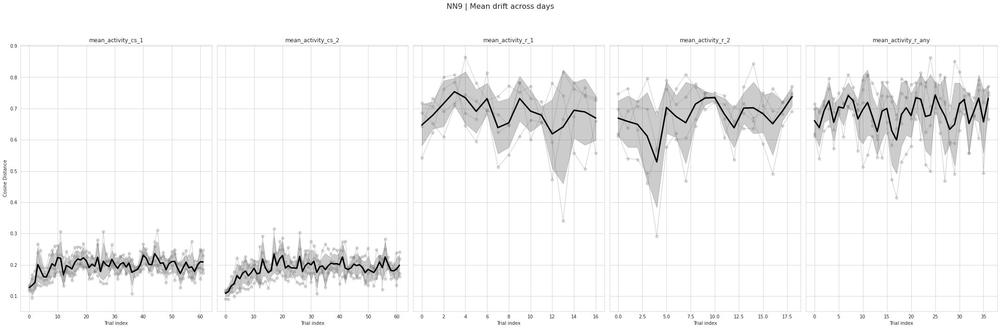

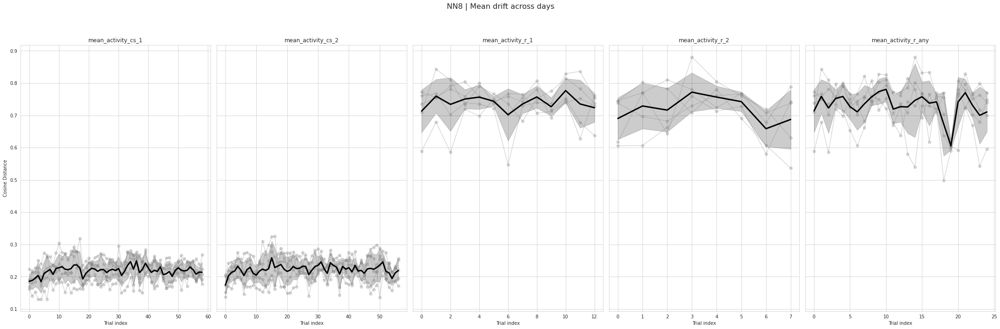

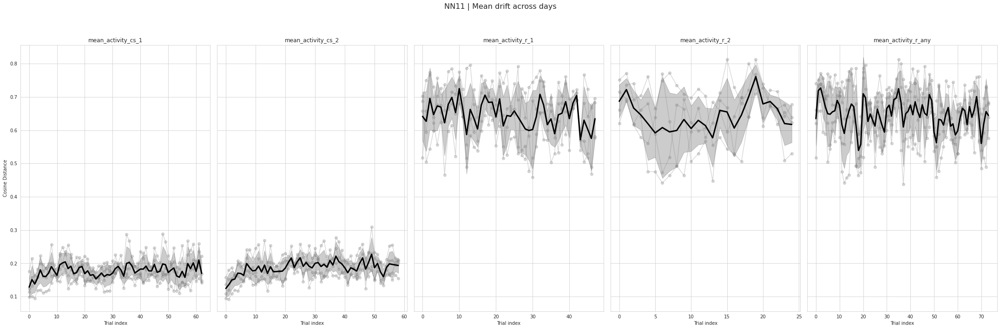

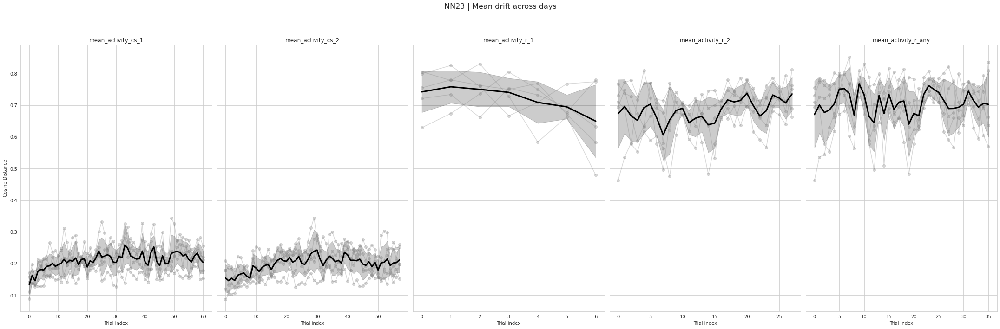

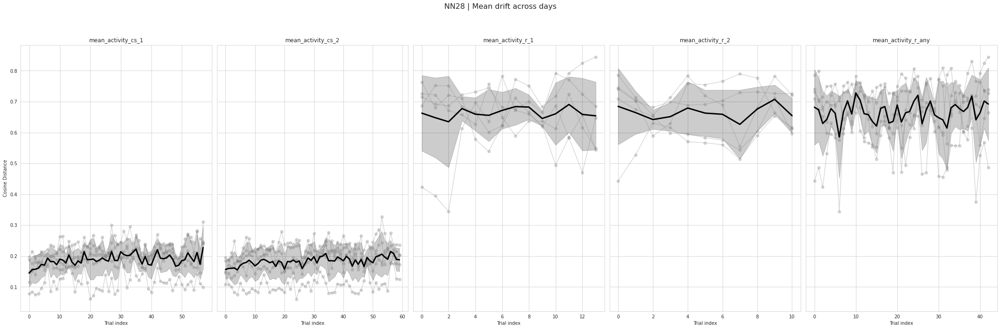

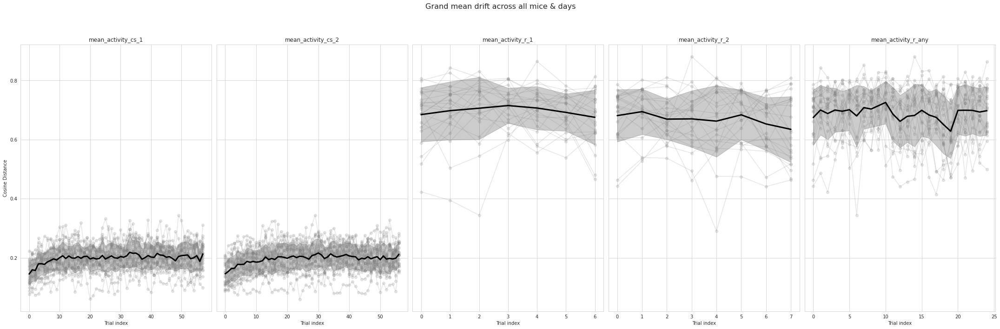

In [19]:
from sklearn.linear_model import LinearRegression
from scipy.stats import linregress, t as t_dist

def compute_drift_cosine(
    mean_activity, 
    confidence, 
    measure, 
    top_percent,
    baseline
):
    n_trials, n_neurons = mean_activity.shape

    # how many neurons to pick if using top_percent
    if top_percent is not None:
        n_top = max(1, int(np.ceil(top_percent * n_neurons)))

    cos_sims = []
    for t in range(n_trials - 1):
        v1 = mean_activity[t]
        v2 = mean_activity[t+1]

        # optionally restrict to intersection of top X%
        if top_percent is not None:
            top1 = np.argsort(v1)[-n_top:]
            top2 = np.argsort(v2)[-n_top:]
            idx = np.intersect1d(top1, top2)
            if idx.size == 0:
                cos_sims.append(np.nan)
                continue
            v1_sub, v2_sub = v1[idx], v2[idx]
        else:
            v1_sub, v2_sub = v1, v2

        denom = norm(v1_sub) * norm(v2_sub)
        if denom == 0:
            cos_sims.append(np.nan)
        else:
            cos_sims.append(np.dot(v1_sub, v2_sub) / denom)

    cos_sims = np.array(cos_sims)
    if measure == "distance":
        drift_values = 1 - cos_sims
        y_label = "Cosine Distance (1 – cos_sim)"
        title_str = "Cosine Distance Across Trials"
    else:
        drift_values = cos_sims
        y_label = "Cosine Similarity"
        title_str = "Cosine Similarity Across Trials"


    return drift_values

def analyze_drift_all_days(
    day_outputs,
    confidence,
    measure,
    top_percent,
    baseline
):
    var_keys = [
        'mean_activity_cs_1',
        'mean_activity_cs_2',
        'mean_activity_r_1',
        'mean_activity_r_2',
        'mean_activity_r_any',
    ]
    drift_results = {}

    #per mouse, per day
    for mouse, dates_dict in day_outputs.items():
        drift_results[mouse] = {}

        for date, dr in dates_dict.items():
            print(f"\n--- Drift curves for {date} ---")
            fig, axes = plt.subplots(1, len(var_keys), figsize=(30, 10), sharey=True)
            fig.suptitle(f"Cosine‐drift ({measure}) on {date}", fontsize=16)

            drift_results[mouse][date] = {}
            for ax, key in zip(axes, var_keys):
                ma = dr[key]              # (n_trials, n_neurons)

                # compute and plot
                dv = compute_drift_cosine(
                    ma,
                    confidence=0.95,
                    measure=measure,
                    top_percent=top_percent,
                    baseline=baseline
                )
                drift_results[mouse][date][key] = dv

                x = np.arange(len(dv))
                ax.plot(x, dv, 'o-', label='data')

                valid = ~np.isnan(dv)
                xv = x[valid].reshape(-1,1)
                yv = dv[valid]
                reg = LinearRegression().fit(xv, yv)
                y_trend = reg.predict(x.reshape(-1,1))

                # CI
                n = valid.sum()
                dof = n-2
                tcrit = t_dist.ppf((1+confidence)/2, dof)
                resid = yv - reg.predict(xv)
                s_err = np.sqrt((resid**2).sum() / dof)
                xm = xv.mean()
                Sxx = ((xv.flatten() - xm)**2).sum()
                ci = tcrit * s_err * np.sqrt(1/n + ((x - xm)**2)/Sxx)

                ax.plot(x, y_trend, '--r', label='trend')
                ax.fill_between(x, y_trend - ci, y_trend + ci,
                                color='r', alpha=0.2,
                                label=f"{int(confidence*100)}% CI")

                ax.set_title(key)
                ax.set_xlabel("Trial index")
                if ax is axes[0]:
                    ylabel = "Cosine Distance" if measure=="distance" else "Cosine Similarity"
                    ax.set_ylabel(ylabel)
                ax.grid(True)

            plt.tight_layout(rect=[0, 0, 1, 0.93])
            plt.show()

    # mean across days per mouse
    for mouse, dates_dict in drift_results.items():
        fig, axes = plt.subplots(1, len(var_keys), figsize=(30,10), sharey=True)
        fig.suptitle(f"{mouse} | Mean drift across days", fontsize=16)

        for ax, key in zip(axes, var_keys):
            # collect all days’ drifts for this key
            dv_list = [dates_dict[date][key] for date in dates_dict]
            # align lengths by truncating to the shortest
            L = min(len(dv) for dv in dv_list)
            stack = np.vstack([dv[:L] for dv in dv_list])
            mean_dv = stack.mean(axis=0)
            std_dv  = stack.std(axis=0)
            x = np.arange(L)

            # plot individual days (faded)
            for dv in dv_list:
                ax.plot(x, dv[:L], 'o-', alpha=0.3, color='gray')

            # overlay mean ± std
            ax.plot(x, mean_dv, '-k', lw=3, label='Mean')
            ax.fill_between(x, mean_dv-std_dv, mean_dv+std_dv,
                            color='k', alpha=0.2, label='±1 s.d.')

            ax.set_title(key)
            ax.set_xlabel("Trial index")
            if ax is axes[0]:
                ax.set_ylabel(ylabel)
            ax.grid(True)

        plt.tight_layout(rect=[0, 0, 1, 0.93])
        plt.show()

    # ─── grand across‐all‐mice summary ───────────────
    fig, axes = plt.subplots(1, len(var_keys), figsize=(30,10), sharey=True)
    fig.suptitle(f"Grand mean drift across all mice & days", fontsize=16)

    for ax, key in zip(axes, var_keys):
        # collect every mouse & day
        dv_list = []
        for mouse in drift_results:
            for date in drift_results[mouse]:
                dv_list.append(drift_results[mouse][date][key])
        L = min(len(dv) for dv in dv_list)
        stack = np.vstack([dv[:L] for dv in dv_list])
        mean_dv = stack.mean(axis=0)
        std_dv  = stack.std(axis=0)
        x = np.arange(L)

        for dv in dv_list:
            ax.plot(x, dv[:L], 'o-', alpha=0.2, color='gray')

        ax.plot(x, mean_dv, '-k', lw=3, label='Mean')
        ax.fill_between(x, mean_dv-std_dv, mean_dv+std_dv,
                        color='k', alpha=0.2, label='±1 s.d.')

        ax.set_title(key)
        ax.set_xlabel("Trial index")
        if ax is axes[0]:
            ax.set_ylabel(ylabel)
        ax.grid(True)

    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()

    return drift_results

drift_by_day = analyze_drift_all_days(
    day_outputs,
    confidence=0.95,
    measure="distance",    # or "similarity"
    top_percent=None,      # or e.g. 0.1 to restrict to top 10% overlap
    baseline=False         # True will label the x-axis “frames” instead of trials
)

#fix x-axis for later plots



=== Cross‐category drift for 210428 ===
CS1 vs CS2: slope 0.001, p = 0.000
R1 vs R2: slope 0.005, p = 0.078
CS1 vs R1: slope 0.003, p = 0.382
CS2 vs R2: slope 0.001, p = 0.372
CS1 vs R2: slope 0.002, p = 0.352
CS2 vs R1: slope 0.002, p = 0.547

=== Cross‐category drift for 210429 ===
CS1 vs CS2: slope 0.001, p = 0.000
R1 vs R2: slope 0.005, p = 0.078
CS1 vs R1: slope 0.002, p = 0.152
CS2 vs R2: slope 0.009, p = 0.003
CS1 vs R2: slope 0.010, p = 0.003
CS2 vs R1: slope 0.002, p = 0.050

=== Cross‐category drift for 210501 ===
CS1 vs CS2: slope 0.000, p = 0.084
R1 vs R2: slope 0.001, p = 0.799
CS1 vs R1: slope 0.004, p = 0.168
CS2 vs R2: slope 0.002, p = 0.194
CS1 vs R2: slope 0.001, p = 0.335
CS2 vs R1: slope 0.005, p = 0.084

=== Cross‐category drift for 210502 ===
CS1 vs CS2: slope 0.001, p = 0.000
R1 vs R2: slope 0.008, p = 0.033
CS1 vs R1: slope 0.005, p = 0.096
CS2 vs R2: slope 0.002, p = 0.239
CS1 vs R2: slope 0.003, p = 0.153
CS2 vs R1: slope 0.006, p = 0.061

=== Cross‐category 

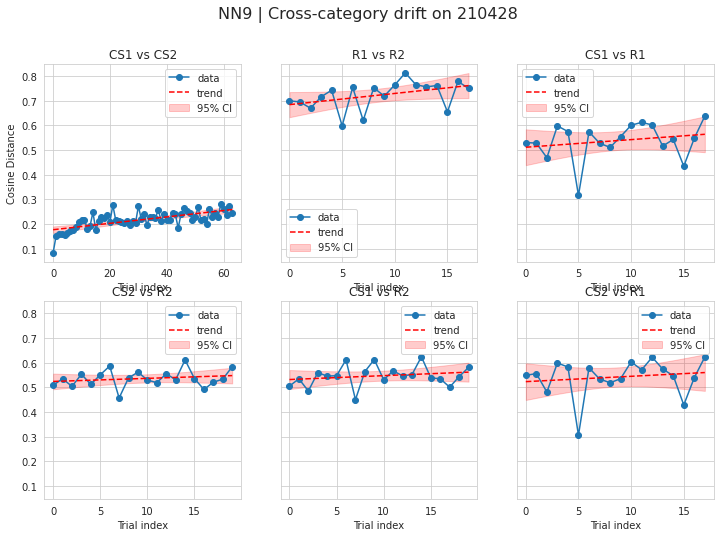

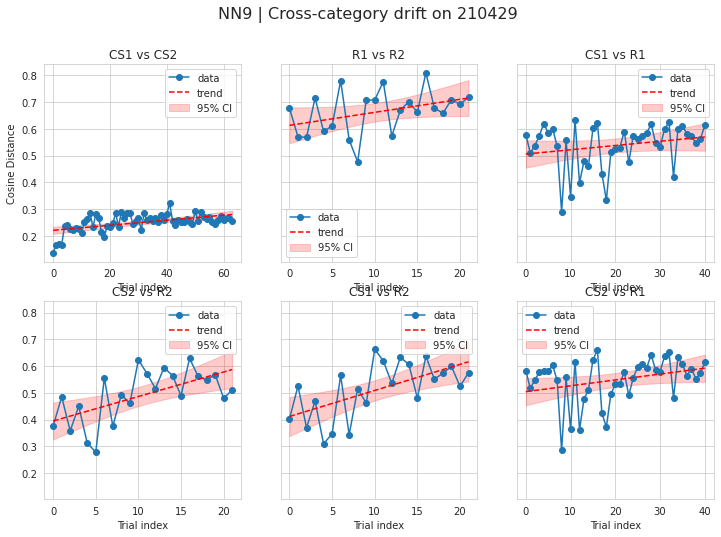

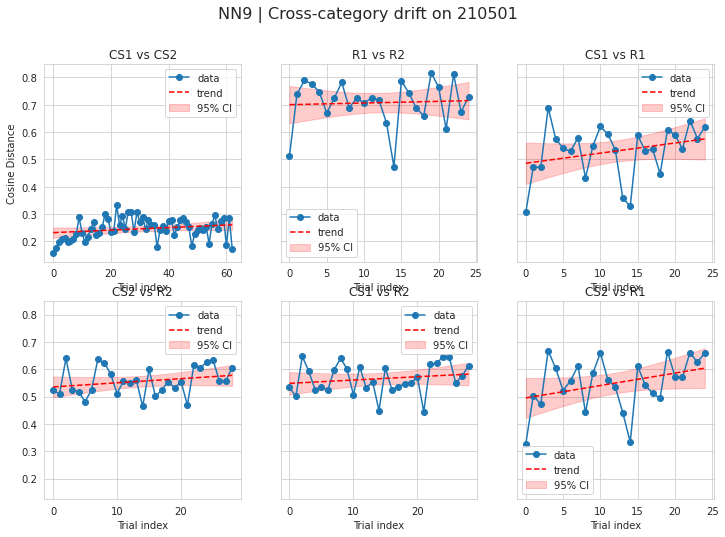

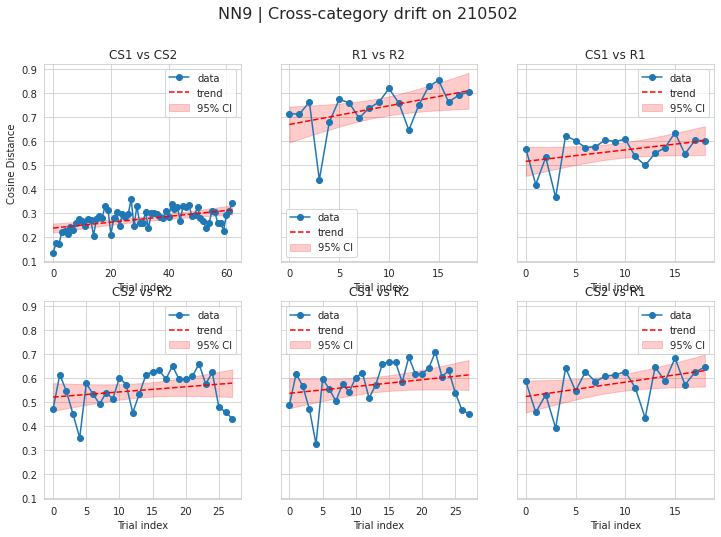

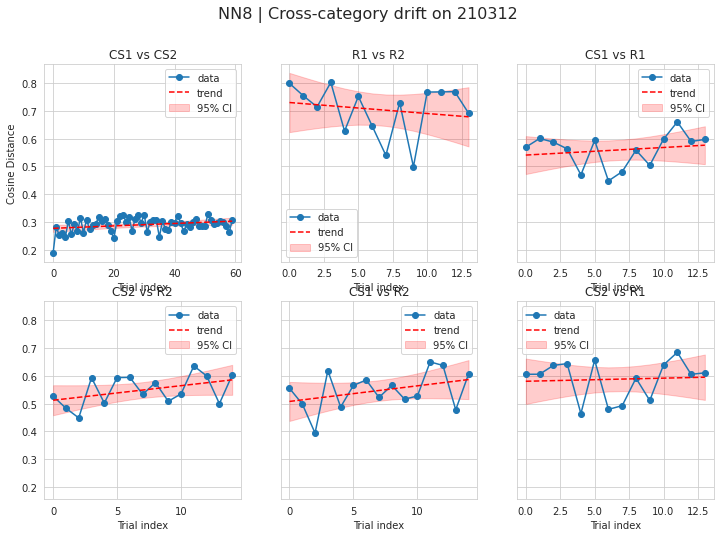

...

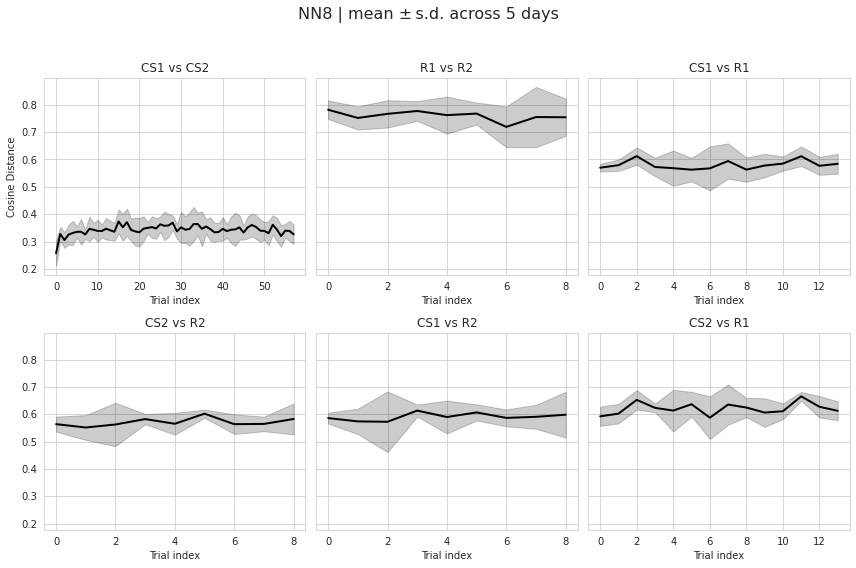

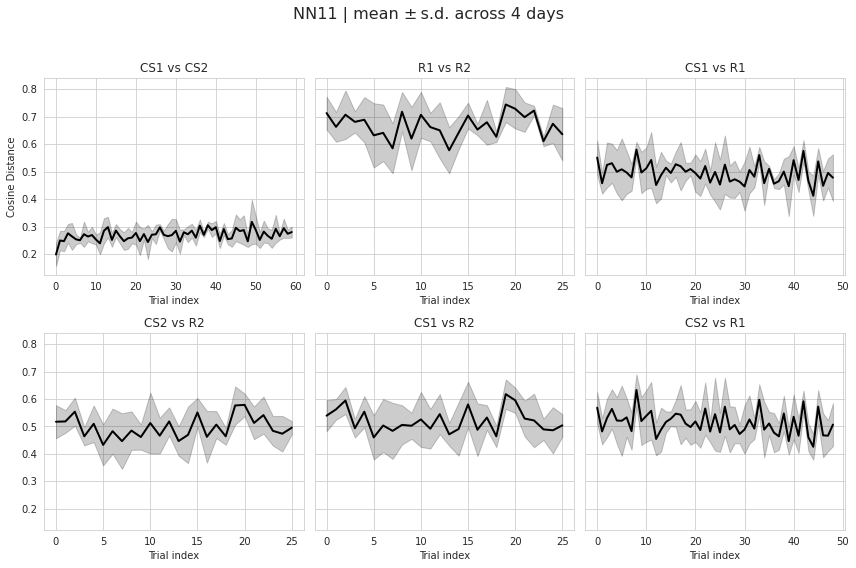

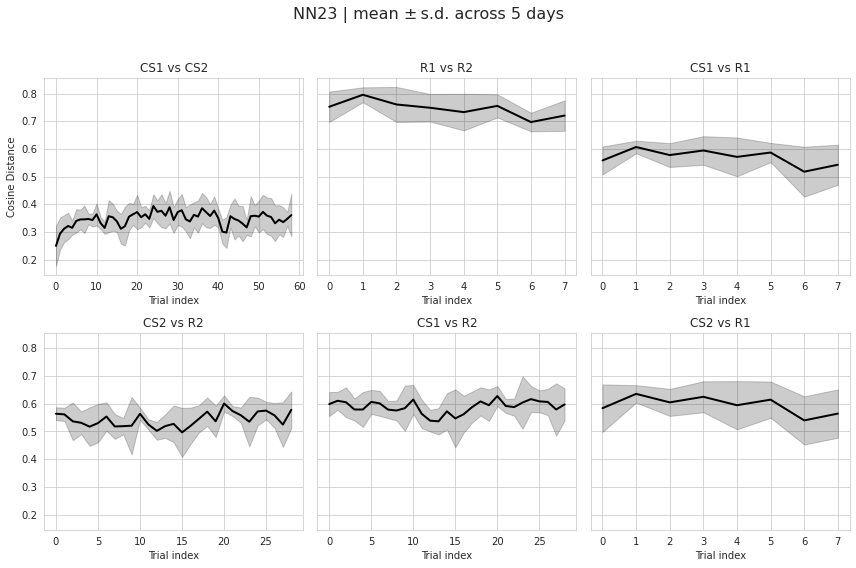

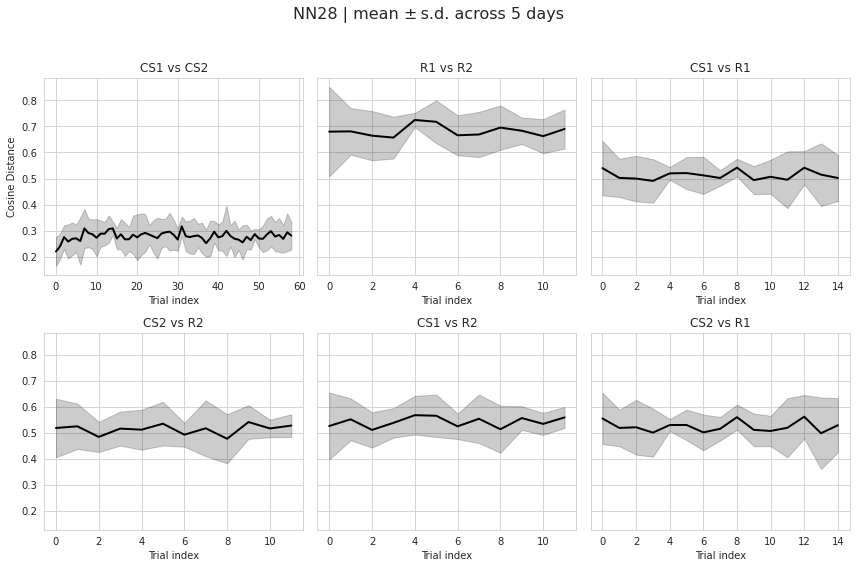

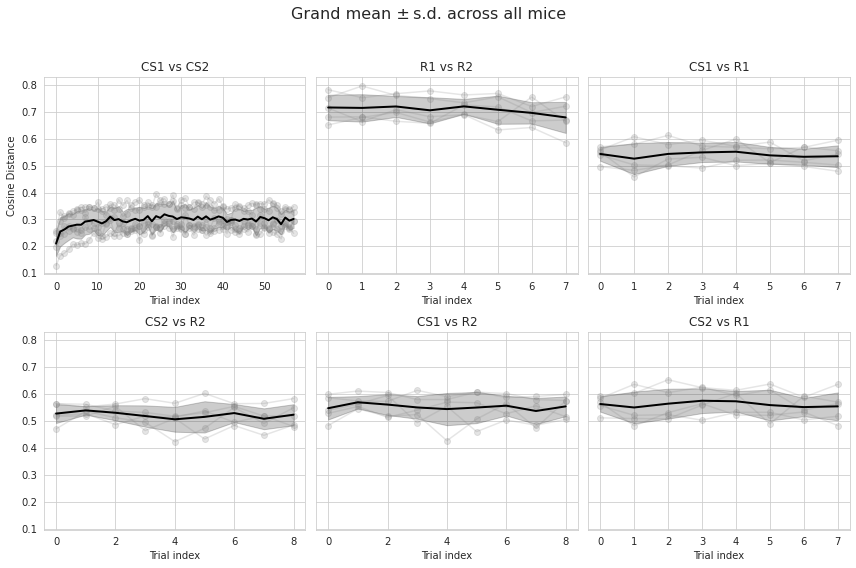

In [20]:
cos_sim = lambda a, b: np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

def analyze_cross_category_all_days(
    day_outputs,
    confidence,
    measure,
    top_percent):
    """
    For each day, compute cross‐category cosine (CS1 vs CS2, R1 vs R2),
    plot them side-by-side with trend & CI, and return the raw curves.
    """
    results = {}
    # per day per mouse
    for mouse, dates_dict in day_outputs.items():
        results[mouse] = {}
        for date, dr in sorted(dates_dict.items()):
            results[mouse][date] = {}

            print(f"\n=== Cross‐category drift for {date} ===")
            # grab the four matrices
            cs1 = dr['mean_activity_cs_1']
            cs2 = dr['mean_activity_cs_2']
            r1  = dr['mean_activity_r_1']
            r2  = dr['mean_activity_r_2']

            # prepare figure & axes
            fig, axes = plt.subplots(2, 3, figsize=(12,8), sharey=True)
            axes = axes.flatten()
            fig.suptitle(f"{mouse} | Cross‐category drift on {date}", fontsize=16)

            pairs = [
                (dr['mean_activity_cs_1'], dr['mean_activity_cs_2'], "CS1 vs CS2"),
                (dr['mean_activity_r_1'],  dr['mean_activity_r_2'],  "R1 vs R2"),
                (dr['mean_activity_cs_1'], dr['mean_activity_r_1'], "CS1 vs R1"),
                (dr['mean_activity_cs_2'], dr['mean_activity_r_2'], "CS2 vs R2"),
                (dr['mean_activity_cs_1'], dr['mean_activity_r_2'], "CS1 vs R2"),
                (dr['mean_activity_cs_2'], dr['mean_activity_r_1'], "CS2 vs R1"),
            ]

            for ax, (m1, m2, label) in zip(axes, pairs):
                # ensure same length
                n = min(m1.shape[0], m2.shape[0])
                sims = []
                for t in range(n):
                    v1, v2 = m1[t], m2[t]
                    if top_percent is not None:
                        k = max(1, int(np.ceil(top_percent * len(v1))))
                        idx = np.intersect1d(
                            np.argsort(v1)[-k:], 
                            np.argsort(v2)[-k:]
                        )
                        if idx.size == 0:
                            sims.append(np.nan)
                            continue
                        v1, v2 = v1[idx], v2[idx]
                    sims.append(cos_sim(v1, v2))
                sims = np.array(sims)
                if measure == "distance":
                    y = 1 - sims
                    ylabel = "Cosine Distance"
                else:
                    y = sims
                    ylabel = "Cosine Similarity"

                # linear trend + CI
                x = np.arange(len(y))
                valid = ~np.isnan(y)
                xv = x[valid].reshape(-1,1)
                yv = y[valid]
                reg = LinearRegression().fit(xv, yv)
                y_trend = reg.predict(x.reshape(-1,1))

                # stats
                slope, intercept, r_val, pval, stderr = linregress(xv.flatten(), yv)
                print(f"{label}: slope {slope:.3f}, p = {pval:.3f}")

                # CI
                n_pts = valid.sum()
                dof   = n_pts - 2
                tcrit = t_dist.ppf((1+confidence)/2, dof)
                resid = yv - reg.predict(xv)
                s_err = np.sqrt((resid**2).sum()/dof)
                xm = xv.mean(); Sxx = ((xv.flatten()-xm)**2).sum()
                ci = tcrit * s_err * np.sqrt(1/n_pts + ((x - xm)**2)/Sxx)

                # plotting
                ax.plot(x, y, 'o-', label='data')
                ax.plot(x, y_trend, '--r', label='trend')
                ax.fill_between(x, y_trend - ci, y_trend + ci,
                                color='r', alpha=0.2,
                                label=f"{int(confidence*100)}% CI")
                ax.set_title(label)
                ax.set_xlabel("Trial index")
                if ax is axes[0]:
                    ax.set_ylabel(ylabel)
                ax.legend(); ax.grid(True)

                # store
                results[mouse][date][label] = y

        cross_labels = ["CS1 vs CS2", "R1 vs R2", "CS1 vs R1", 
                        "CS2 vs R2", "CS1 vs R2", "CS2 vs R1"]

    for mouse, dates_dict in results.items():
        fig, axes = plt.subplots(2, 3, figsize=(12, 8), sharey=True)
        axes = axes.flatten()
        fig.suptitle(f"{mouse} | mean ± s.d. across {len(dates_dict)} days", fontsize=16)

        # for each label (string), gather that mouse’s daily curves
        for ax, label in zip(axes, cross_labels):
            series_list = [ results[mouse][date][label]
                            for date in sorted(dates_dict) ]
            # truncate to the shortest series
            L = min(len(s) for s in series_list)
            data = np.vstack([s[:L] for s in series_list])

            mean_y = data.mean(axis=0)
            std_y  = data.std(axis=0)
            x = np.arange(L)

            # plot each day faintly in gray
            #for s in series_list:
                #ax.plot(x, s[:L], 'o-', color='gray', alpha=0.3)

            # overlay mean ± std
            ax.plot(x, mean_y, '-k', lw=2)
            ax.fill_between(x, mean_y-std_y, mean_y+std_y,
                            color='k', alpha=0.2)

            ax.set_title(label)
            ax.set_xlabel("Trial index")
            if ax is axes[0]:
                ylabel = "Cosine Distance" if measure=="distance" else "Cosine Similarity"
                ax.set_ylabel(ylabel)
            ax.grid(True)

        plt.tight_layout(rect=[0,0,1,0.95])
        plt.show()


    # --- grand across all mice & days ---
    fig, axes = plt.subplots(2, 3, figsize=(12, 8), sharey=True)
    axes = axes.flatten()
    fig.suptitle("Grand mean ± s.d. across all mice", fontsize=16)

    for ax, label in zip(axes, cross_labels):
        mouse_means = []
        # first compute each mouse’s average curve
        for mouse in results:
            series_list = [ results[mouse][date][label]
                            for date in sorted(results[mouse]) ]
            Lm = min(len(s) for s in series_list)
            stack = np.vstack([s[:Lm] for s in series_list])
            mouse_means.append(stack.mean(axis=0))

        # now stack the mice together
        L = min(len(m) for m in mouse_means)
        data = np.vstack([m[:L] for m in mouse_means])

        mean_y = data.mean(axis=0)
        std_y  = data.std(axis=0)
        x = np.arange(L)

        # each mouse in gray
        for m in mouse_means:
            ax.plot(x, m[:L], 'o-', color='gray', alpha=0.2)

        # grand mean ± std
        ax.plot(x, mean_y, '-k', lw=2)
        ax.fill_between(x, mean_y-std_y, mean_y+std_y,
                        color='k', alpha=0.2)

        ax.set_title(label)
        ax.set_xlabel("Trial index")
        if ax is axes[0]:
            ax.set_ylabel(ylabel)
        ax.grid(True)

    plt.tight_layout(rect=[0,0,1,0.95])
    plt.show()

drift_cross = analyze_cross_category_all_days(
    day_outputs,
    confidence=0.95,
    measure="distance",    # or "similarity"
    top_percent=None      # or e.g. 0.10 for top‐10%
)

#here I should do something with making the x-axis the same? what pau said in the meeting but dont really remember
#index the right cs response by the corresponding r index ???

#instead of trimming do padding

# rank-order plots

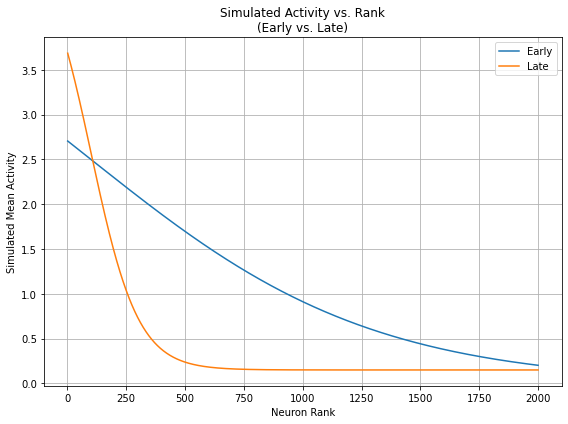

In [21]:
n_neurons = 2000

# Create a rank axis from 1 to 3000
ranks = np.arange(1, n_neurons + 1)

# Choose a midpoint so that the “half‐max” occurs around rank 1500
midpoint = 100

# A larger “slope” denominator → more gradual (gentler) decline.
# A smaller denominator → sharper (quicker) decline.
slope_early = 600   # Early has a broad, gentle S-curve
slope_late  = 100   # Late has a steeper drop

min_early, max_early = 0.0, 5.0
min_late,  max_late  = 0.15, 5.0


# Generate logistic (sigmoid) profiles in [0,1]
early_sigmoid = 1 / (1 + np.exp((ranks - midpoint) / slope_early))
late_sigmoid  = 1 / (1 + np.exp((ranks - midpoint) / slope_late))

# Scale up from [0,1] to a realistic activity range, e.g. [0,50]
max_activity = 5
early_activity = min_early + (max_early - min_early) * early_sigmoid
late_activity  = min_late  + (max_late  - min_late)  * late_sigmoid


# Plotting
plt.figure(figsize=(8, 6))
plt.plot(ranks, early_activity, label='Early')
plt.plot(ranks, late_activity,  label='Late')

plt.xlabel('Neuron Rank')
plt.ylabel('Simulated Mean Activity')
plt.title('Simulated Activity vs. Rank\n(Early vs. Late)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



>>>> DAY 210428 <<<<
-- Condition: CS1 --
Spearman correlation: -0.04 (p = 0.0211)
-- Condition: CS2 --
Spearman correlation: 0.00 (p = 0.844)

>>>> DAY 210429 <<<<
-- Condition: CS1 --
Spearman correlation: 0.14 (p = 1.5e-12)
-- Condition: CS2 --
Spearman correlation: 0.19 (p = 7.94e-22)

>>>> DAY 210501 <<<<
-- Condition: CS1 --
Spearman correlation: 0.04 (p = 0.0857)
-- Condition: CS2 --
Spearman correlation: 0.03 (p = 0.215)

>>>> DAY 210502 <<<<
-- Condition: CS1 --
Spearman correlation: -0.03 (p = 0.296)
-- Condition: CS2 --
Spearman correlation: 0.15 (p = 6.95e-10)

>>>> DAY 210312 <<<<
-- Condition: CS1 --
Spearman correlation: 0.28 (p = 1.12e-77)
-- Condition: CS2 --
Spearman correlation: 0.10 (p = 5.61e-11)

>>>> DAY 210314 <<<<
-- Condition: CS1 --
Spearman correlation: 0.19 (p = 1.27e-30)
-- Condition: CS2 --
Spearman correlation: 0.30 (p = 7.09e-75)

>>>> DAY 210316 <<<<
-- Condition: CS1 --
Spearman correlation: 0.34 (p = 1.18e-68)
-- Condition: CS2 --
Spearman correlati

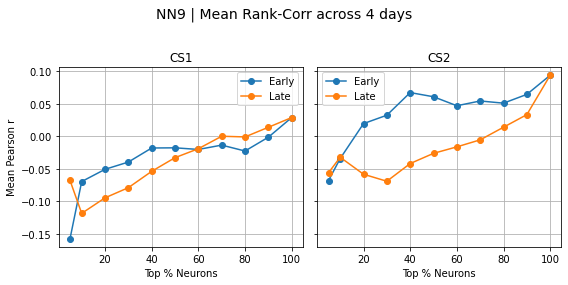

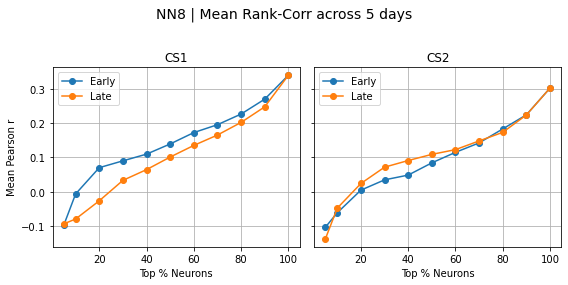

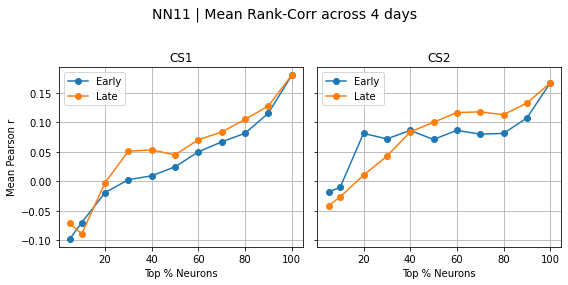

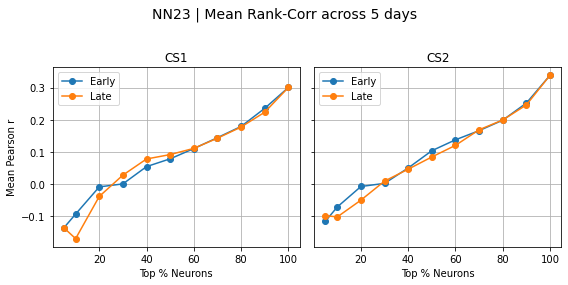

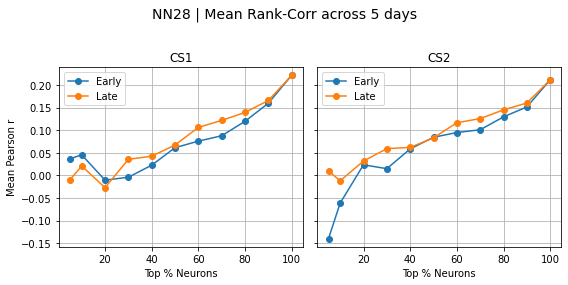


CS1 significance tests:

CS1 paired‐t tests (Bonferroni):
  Top   5%: Early=-0.087, Late=-0.076, p_adj=1
  Top  10%: Early=-0.036, Late=-0.086, p_adj=0.0605
  Top  20%: Early=-0.001, Late=-0.037, p_adj=0.466
  Top  30%: Early=0.012, Late=0.016, p_adj=1
  Top  40%: Early=0.039, Late=0.040, p_adj=1
  Top  50%: Early=0.062, Late=0.059, p_adj=1
  Top  60%: Early=0.083, Late=0.086, p_adj=1
  Top  70%: Early=0.102, Late=0.108, p_adj=1
  Top  80%: Early=0.124, Late=0.131, p_adj=1
  Top  90%: Early=0.165, Late=0.163, p_adj=1
  Top 100%: Early=0.224, Late=0.224, p_adj=1

CS2 significance tests:

CS2 paired‐t tests (Bonferroni):
  Top   5%: Early=-0.093, Late=-0.066, p_adj=1
  Top  10%: Early=-0.050, Late=-0.045, p_adj=1
  Top  20%: Early=0.022, Late=-0.007, p_adj=1
  Top  30%: Early=0.029, Late=0.026, p_adj=1
  Top  40%: Early=0.061, Late=0.051, p_adj=1
  Top  50%: Early=0.082, Late=0.073, p_adj=1
  Top  60%: Early=0.099, Late=0.096, p_adj=1
  Top  70%: Early=0.112, Late=0.116, p_adj=1
  Top  

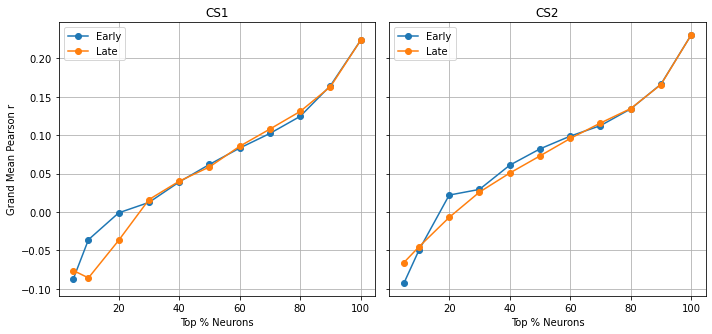

Padding to maximum neuron count = 4134 across sessions for CS1


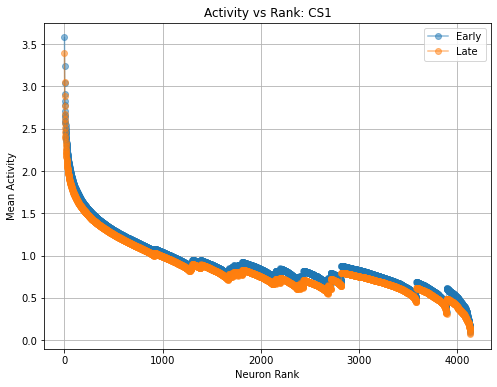

Padding to maximum neuron count = 4134 across sessions for CS2


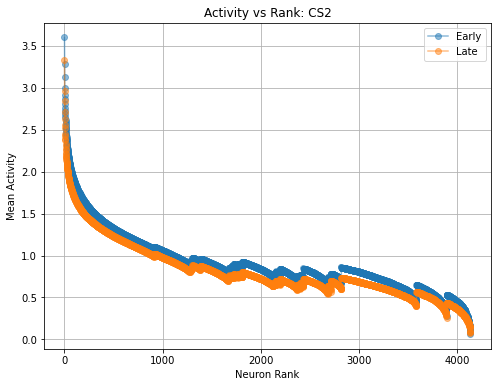

In [11]:
from scipy.stats import spearmanr
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests
from scipy.stats import ttest_rel


def compute_early_late_means(data, n_trials=3):
    """
    Compute the average response across the first n_trials and the last n_trials.
    
    Parameters:
      data: 2D numpy array (trials x neurons)
      n_trials: number of trials to average at the beginning and end (default=5)
      
    Returns:
      early_mean: 1D array of mean activity for each neuron (first n_trials)
      late_mean: 1D array of mean activity for each neuron (last n_trials)
    """
    early_mean = np.mean(data[:n_trials, :], axis=0)
    late_mean = np.mean(data[-n_trials:, :], axis=0)
    return early_mean, late_mean

def plot_combined_rank_plots(early, late, condition_name):
    """
    Creates a combined figure with two subplots:
      - Left: Both early and late curves sorted by their own values (independently sorted).
      - Right: Both curves sorted using the early ordering (late curve "flipped").
    
    Parameters:
      early: 1D array of early mean responses.
      late: 1D array of late mean responses.
      condition_name: string name of the condition.
    """
    n_neurons = len(early)
    # Independent sorting: each curve is sorted in descending order using its own values.
    early_order = np.argsort(early)[::-1]
    late_order= np.argsort(late)[::-1]

    early_sorted_vals = early[early_order]
    late_sorted_vals  = late[late_order]

    # Compute 1-based ranks
    early_rank = np.empty(n_neurons, dtype=int)
    late_rank = np.empty(n_neurons, dtype=int)
    early_rank[early_order] = np.arange(1, n_neurons + 1)
    late_rank[ late_order]  = np.arange(1, n_neurons + 1)


    corr, p = spearmanr(early_rank, late_rank)
    print(f"Spearman correlation: {corr:.2f} (p = {p:.3g})")    


def compute_rank_correlations(early, late, percentiles):
    """
    Compute correlation between early and late neuron ranks for different top-percentile subsets.

    Parameters:
      early: 1D array of early mean responses.
      late: 1D array of late mean responses.
      percentiles: list of percentiles to consider (e.g., [1,5,10,...])

    Returns:
      df: pandas DataFrame with rows ['early_defined', 'late_defined'] and columns ['top_X%'].
    """
    n_neurons = len(early)
    # Sort in descending order
    early_order = np.argsort(early)[::-1]
    late_order = np.argsort(late)[::-1]

    # Compute 1-based ranks
    early_rank = np.empty(n_neurons, dtype=int)
    late_rank = np.empty(n_neurons, dtype=int)
    early_rank[early_order] = np.arange(1, n_neurons + 1)
    late_rank[late_order] = np.arange(1, n_neurons + 1)
    
    results = {'early': [], 'late': []}
    for p in percentiles:
        n_top = max(1, int(np.ceil(n_neurons * p / 100.0)))
        
        idx_early_top = early_order[:n_top]
        corr_e = np.corrcoef(early_rank[idx_early_top], late_rank[idx_early_top])[0, 1]
        
        idx_late_top = late_order[:n_top]
        corr_l = np.corrcoef(early_rank[idx_late_top], late_rank[idx_late_top])[0, 1]
        
        results['early'].append(corr_e)
        results['late'].append(corr_l)
    
    df = pd.DataFrame(results, index=[f'top_{p}%' for p in percentiles])
    return df

def plot_activity_by_rank(day_outputs, n_trials=5, condition_keys=('CS1','CS2')):
    """
    For each condition in condition_keys, aggregate early/late mean activity sorted by rank
    across all mice & days, and plot one figure per condition.
    """
    key_map = {
        'CS1': 'mean_activity_cs_1',
        'CS2': 'mean_activity_cs_2'
    }
    for cond in condition_keys:
        dr_key = key_map.get(cond, cond)
        all_early, all_late = [], []
        # Collect sorted activity arrays
        for mouse, dates in day_outputs.items():
            for date, dr in dates.items():
                data = dr.get(dr_key, None)
                if data is None:
                    continue
                early, late = compute_early_late_means(data, n_trials=n_trials)
                early_s = np.sort(early)[::-1]
                late_s  = np.sort(late)[::-1]
                all_early.append(early_s)
                all_late.append(late_s)
        if not all_early:
            print(f"No data for condition {cond} (key '{dr_key}')")
            continue

        max_len = max(arr.size for arr in all_early)
        if any(arr.size != max_len for arr in all_early):
            print(f"Padding to maximum neuron count = {max_len} across sessions for {cond}")

        padded_E = np.array([np.pad(arr, (0, max_len - arr.size), mode='constant', constant_values=np.nan)
                              for arr in all_early])
        padded_L = np.array([np.pad(arr, (0, max_len - arr.size), mode='constant', constant_values=np.nan)
                              for arr in all_late])

        mean_early = np.nanmean(padded_E, axis=0)
        mean_late  = np.nanmean(padded_L, axis=0)
        ranks = np.arange(1, max_len+1)

        plt.figure(figsize=(8,6))
        plt.plot(ranks, mean_early, marker='o', label='Early', alpha=0.5)
        plt.plot(ranks, mean_late,  marker='o', label='Late', alpha=0.5)
        plt.xlabel('Neuron Rank')
        plt.ylabel('Mean Activity')
        plt.title(f'Activity vs Rank: {cond}')
        plt.legend(); plt.grid(True)
        plt.show()


def analyze_rank_across_days(
    day_outputs,
    n_trials=5,
    percentiles=None
):
    """
    For each day in day_outputs, and for each of the conditions
    (mean_activity_cs_1, mean_activity_cs_2, mean_activity_r_1, mean_activity_r_2,
     mean_activity_r_any), compute and plot:
      - early vs late rank‐curves
      - run rank‐correlations at specified percentiles

    Returns
    -------
    all_correlations : dict of dicts
       { date: { condition_name: DataFrame(percentile x [early, late]) } }
    """
    if percentiles is None:
        percentiles = [5,10,20,30,40,50,60,70,80,90,100]

    all_correlations = {}

    for mouse, date_dict in day_outputs.items():
      all_correlations[mouse] = {}

      for date, dr in sorted(date_dict.items()):
          print(f"\n>>>> DAY {date} <<<<")
          # build a dict of your conditions
          conditions = {
              'CS1':    dr['mean_activity_cs_1'],
              'CS2':    dr['mean_activity_cs_2'],
              #'R1':     dr['mean_activity_r_1'],
              #'R2':     dr['mean_activity_r_2'],
              #'ReactAny': dr.get('mean_activity_r_any', None)
          }
          # drop any None
          conditions = {k:v for k,v in conditions.items() if v is not None}
          
          day_corrs = {}
          for cond_name, data in conditions.items():
              print(f"-- Condition: {cond_name} --")
              early_mean, late_mean = compute_early_late_means(data, n_trials=n_trials)
              
              plot_combined_rank_plots(early_mean, late_mean, f"{mouse} {cond_name} ({date})")
              
              df = compute_rank_correlations(early_mean, late_mean, percentiles)
              day_corrs[cond_name] = df

          all_correlations[mouse][date] = day_corrs 

    # ─── per‐mouse across‐days summary ─────────────────────
    for mouse, date_dict in all_correlations.items():
        fig, ax = plt.subplots(1, len(conditions), figsize=(4*len(conditions),4), sharey=True)
        fig.suptitle(f"{mouse} | Mean Rank‐Corr across {len(date_dict)} days", fontsize=14)
        for idx, cond_name in enumerate(conditions):
            # collect each day's df for this condition
            dfs = [date_dict[date][cond_name] for date in sorted(date_dict)]
            # stack early & late
            early_mat = np.vstack([df['early'].values for df in dfs])
            late_mat  = np.vstack([df['late'].values  for df in dfs])
            mean_early = early_mat.mean(axis=0)
            mean_late  = late_mat.mean(axis=0)
            # plot
            ax[idx].plot(percentiles, mean_early, marker='o', label='Early')
            ax[idx].plot(percentiles, mean_late,  marker='o', label='Late')
            ax[idx].set_title(cond_name)
            ax[idx].set_xlabel('Top % Neurons')
            if idx==0:
                ax[idx].set_ylabel('Mean Pearson r')
            ax[idx].legend(); ax[idx].grid(True)
        plt.tight_layout(rect=[0,0,1,0.95])
        plt.show()

    # ─── grand across‐all‐mice summary ────────────────────
    fig, ax = plt.subplots(1, len(conditions), figsize=(5*len(conditions),5), sharey=True)
    #fig.suptitle("Grand Mean Rank‐Corr across all mice & days", fontsize=16)
    for idx, cond_name in enumerate(conditions):
        # collect all mice & days
        all_early, all_late = [], []
        for mouse in all_correlations:
            for date in all_correlations[mouse]:
                df = all_correlations[mouse][date][cond_name]
                all_early.append(df['early'].values)
                all_late.append(df['late'].values)
        E = np.vstack(all_early)
        L = np.vstack(all_late)
        grand_early = E.mean(axis=0)
        grand_late  = L.mean(axis=0)
        ax[idx].plot(percentiles, grand_early, marker='o', label='Early')
        ax[idx].plot(percentiles, grand_late,  marker='o', label='Late')
        ax[idx].set_title(cond_name)
        ax[idx].set_xlabel('Top % Neurons')
        if idx==0:
            ax[idx].set_ylabel('Grand Mean Pearson r')
        ax[idx].legend(); ax[idx].grid(True)

        print(f"\n{cond_name} significance tests:")
        raw_p = []
        for i in range(len(percentiles)):
            se, sl = E[:, i], L[:, i]
            # if identical across sessions, t-test is undefined:
            if np.allclose(se, sl):
                raw_p.append(1.0)   # no difference ⇒ p=1
            else:
                _, p = ttest_rel(se, sl)
                raw_p.append(p)

        # Bonferroni correction
        reject, p_bonf, _, _ = multipletests(raw_p, alpha=0.05, method='bonferroni')

        print(f"\n{cond_name} paired‐t tests (Bonferroni):")
        for pct, me, ml, padj, sig in zip(percentiles, grand_early, grand_late, p_bonf, reject):
            mark = ' *' if sig else ''
            print(f"  Top {pct:>3}%: Early={me:.3f}, Late={ml:.3f}, p_adj={padj:.3g}{mark}")

    plt.tight_layout(rect=[0,0,1,0.95])
    plt.show()
    
    return all_correlations



percentiles = [5,10,20,30,40,50,60,70,80,90,100]
corrs_by_day = analyze_rank_across_days(
    day_outputs,
    n_trials=5,
    percentiles=percentiles
)

plot_activity_by_rank(day_outputs, n_trials=5, condition_keys=('CS1','CS2'))

#what would be a good baseline comparison? what would signifiy simple sparsification
# and versus deep learning

In [35]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")

class MultiOutputLogistic(nn.Module):
    def __init__(self, in_dim, out_dim):
        super().__init__()
        self.linear = nn.Linear(in_dim, out_dim)
    def forward(self, x):
        return self.linear(x)  # raw logits

def train_epoch(model, loader, optimizer, criterion):
    model.train()
    total_loss = 0.0
    for Xb, yb in loader:
        Xb, yb = Xb.to(device), yb.to(device).float()
        optimizer.zero_grad()
        logits = model(Xb)
        loss = criterion(logits, yb)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * Xb.size(0)
    return total_loss / len(loader.dataset)

def eval_model(model, X, y):
    model.eval()
    with torch.no_grad():
        logits = model(X.to(device))
        probs  = torch.sigmoid(logits).cpu().numpy()
    preds = (probs > 0.5).astype(int)
    y_true = y.cpu().numpy().astype(int)
    # compute metrics per neuron
    accs = []; precs = []; recs = []; f1s = []
    for i in range(y_true.shape[1]):
        accs.append(accuracy_score(y_true[:,i], preds[:,i]))
        precs.append(precision_score(y_true[:,i], preds[:,i], zero_division=0))
        recs.append(recall_score(y_true[:,i], preds[:,i], zero_division=0))
        f1s.append(f1_score(y_true[:,i], preds[:,i], zero_division=0))
    return accs, precs, recs, f1s, probs

def LR_model_torch(X_all, y_all,
                   n_splits=5,
                   num_epochs=50,
                   batch_size=64,
                   lr=1e-3):
    """
    X_all: numpy array (N_samples, N_features)
    y_all: numpy array (N_samples, N_neurons) with 0/1 labels
    """
    y_bin = (y_all > 0 ).astype(np.int64)
    X_tensor = torch.tensor(X_all, dtype=torch.float32)
    y_tensor = torch.tensor(y_bin, dtype=torch.int64)
    
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    all_accs, all_precs, all_recs, all_f1s = [], [], [], []
    n_trials, n_neurons = y_all.shape
    probs_full  = np.zeros((n_trials, n_neurons), dtype=float)
    y_true_full = y_all.copy()

    for fold, (train_idx, test_idx) in enumerate(kf.split(X_all)):
        # create loaders
        ds_train = TensorDataset(X_tensor[train_idx], y_tensor[train_idx])
        loader   = DataLoader(ds_train, batch_size=batch_size, shuffle=True)
        
        # init model, optimizer, loss
        model = MultiOutputLogistic(X_all.shape[1], y_all.shape[1]).to(device)
        optimizer = optim.Adam(model.parameters(), lr=lr)
        criterion = nn.BCEWithLogitsLoss()
        
        # train
        for epoch in range(num_epochs):
            loss = train_epoch(model, loader, optimizer, criterion)
        
        # eval
        accs, precs, recs, f1s, probs = eval_model(
            model,
            X_tensor[test_idx],
            y_tensor[test_idx]
        )
        probs_full[test_idx] = probs

        all_accs .extend(accs)
        all_precs.extend(precs)
        all_recs .extend(recs)
        all_f1s  .extend(f1s)
        print(f"Fold {fold}: mean acc={np.mean(accs):.3f}, f1={np.mean(f1s):.3f}")
    
    # summary
    print("\n=== CV Summary ===")
    print(f"Accuracy:  {np.mean(all_accs):.3f} ± {np.std(all_accs):.3f}")
    print(f"Precision: {np.mean(all_precs):.3f}")
    print(f"Recall:    {np.mean(all_recs):.3f}")
    print(f"F1-score:  {np.mean(all_f1s):.3f}")
    print(f"probs", probs_full.shape)
    print(f"y_true_full", y_true_full.shape)


    
    return {
        "Accuracy": all_accs,
        "Precision": all_precs,
        "Recall": all_recs,
        "F1": all_f1s,
        'probs': probs_full,
        'y_true': y_true_full
    }


In [34]:
import numpy as np

def compute_sign_changes(mean_activity_cs, trial_r):
    """
    Compute sign changes based on trial-to-trial differences and map reactivations to them.
    
    Parameters:
    - mean_activity_cs: Trial-level activity (shape: trials x neurons)
    - trial_r: Reactivation-to-trial mapping (shape: reactivations,)
    
    Returns:
    - reactivation_sign_changes: Array (reactivations x neurons) of sign changes (−1 or +1)
    """
    trial_r = np.asarray(trial_r, dtype=int)
    # trial_diff: (trials-1, neurons)
    trial_diff = np.diff(mean_activity_cs, axis=0)
    # trial_sign_changes: (trials-1, neurons)
    trial_sign_changes = np.where(trial_diff > 0, 1, -1)
    # Map to reactivations, shape (reactivations, neurons)
    return trial_sign_changes[trial_r]


def clean_and_prepare_data(mean_activity_r, mean_activity_cs, trial_r, metric):
    """
    Prepare predictors (X_all) and targets (y_all) for logistic regression
    
    Parameters:
    - mean_activity_r: Reactivation-level activity (shape: reactivations x neurons)
    - mean_activity_cs: Trial-level activity       (shape: trials       x neurons)
    - trial_r:         Reactivation-to-trial map   (shape: reactivations,)
    - metric:          One of 'substract','multiply','add','divide','other','new_diff'
    
    Returns:
    - X_all: Predictors array (reactivations x neurons)
    - y_all:   Targets    array (reactivations x neurons)
    """
    trial_r = np.asarray(trial_r, dtype=int)
    # --- targets for all neurons, shape (reactivations, neurons)
    y_all = compute_sign_changes(mean_activity_cs, trial_r)

    # --- predictors, shape (reactivations, neurons)
    stim = mean_activity_cs[trial_r]   # (reactivations, neurons)
    if metric == 'substract':
        X_all = mean_activity_r - stim

    elif metric == 'multiply':
        X_all = mean_activity_r * stim

    elif metric == 'add':
        X_all = mean_activity_r + stim

    elif metric == 'divide':
        X_all = mean_activity_r / stim

    elif metric == 'other':
        X_all = stim - mean_activity_r

    elif metric == 'new_diff':
        idx_prev = np.maximum(trial_r - 1, 0)
        stim_prev = mean_activity_cs[idx_prev]
        stim_delta = stim - stim_prev
        X_all = mean_activity_r - stim_delta

    else:
        raise ValueError(f"Unknown metric: {metric}")

    return X_all, y_all


In [36]:
def sample_random_segments(activity: np.ndarray,
                           segment_length: int,
                           n_samples: int) -> np.ndarray:
    """
    Sample `n_samples` random windows of length `segment_length`
    from `activity` (shape [n_neurons, n_frames]) and return
    their per‐neuron means as an array [n_samples, n_neurons].
    """
    n_neurons, n_frames = activity.shape
    segments = []
    for _ in range(n_samples):
        start = np.random.randint(0, n_frames - segment_length + 1)
        seg = activity[:, start:start + segment_length].mean(axis=1)
        segments.append(seg)
    return np.stack(segments, axis=0)

def compute_sign_changes_rand(m1: np.ndarray,
                         m2: np.ndarray) -> np.ndarray:
    """
    Compute the “sign of the change” target:
      concatenate Δm1 and Δm2 (skipping the first diff),
      then map to {+1, −1}.
    """
    d1, d2 = np.diff(m1, axis=0), np.diff(m2, axis=0)
    y = np.concatenate([d1, d2], axis=0)
    return np.where(y > 0,  1, -1)


def add_random_baselines(results: dict,
                         activity: np.ndarray,
                         m1: np.ndarray,
                         m2: np.ndarray,
                         r1: np.ndarray,
                         r2: np.ndarray,
                         trial_r1: np.ndarray,
                         trial_r2: np.ndarray,
                         segment_length: int,
                         lr_fn) -> None:
    """
    Fill `results[...]` with the six random‐baseline models:
      - RAND_SER
      - RAND_min_rand_SER
      - RAND_min_ser_SER
      - RAND_ser_min_rand_SER
      - ri_min_RAND_SER
      - RAND_ri_SER
    """
    rand1 = sample_random_segments(activity, segment_length, m1.shape[0])
    rand2 = sample_random_segments(activity, segment_length, m2.shape[0])

    sign_changes = compute_sign_changes_rand(m1, m2)

    #X = np.concatenate([rand1[:-2], rand2[:-2]], axis=0)
    #results['RAND_SER'] = lr_fn(X, sign_changes)

    rand1b = sample_random_segments(activity, segment_length, m1.shape[0])
    rand2b = sample_random_segments(activity, segment_length, m2.shape[0])

    #X = np.concatenate([rand1b - rand1, rand2b - rand2], axis=0)[:-2]
    #results['RAND_min_rand_SER'] = lr_fn(X, sign_changes)

    X = np.concatenate([rand1 - m1, rand2 - m2], axis=0)[:-2]
    results['RAND_min_ser_SER'] = lr_fn(X, sign_changes)

    #X = np.concatenate([m1 - rand1, m2 - rand2], axis=0)[:-2]
    #results['RAND_ser_min_rand_SER'] = lr_fn(X, sign_changes)

    Xcs1, ycs1 = clean_and_prepare_data(r1, m1, trial_r1, metric='substract')
    Xcs2, ycs2 = clean_and_prepare_data(r2, m2, trial_r2, metric='substract')
    y_r = np.concatenate([ycs1, ycs2], axis=0)

    n1, n2 = min(rand1.shape[0], r1.shape[0]), min(rand2.shape[0], r2.shape[0])
    r1_cut = r1[:n1]
    r2_cut = r2[:n2]
    rand1_cut = rand1[:n1]
    rand2_cut = rand2[:n2]

   # X = np.concatenate([rand1_cut - r1_cut, rand2_cut - r2_cut], axis=0)
    #results['RAND_ri_SER'] = lr_fn(X, y_r)

    X = np.concatenate([r1_cut - rand1_cut, r2_cut - rand2_cut], axis=0)
    results['ri_min_RAND_SER'] = lr_fn(X, y_r)

        

In [46]:
def LR_across_days_SER(day_output):
    all_LR_results = {}
    output_dir="LR_results/SER2"
    os.makedirs(output_dir, exist_ok=True)

    for mouse, day_dict in day_outputs.items():
        all_LR_results[mouse] = {}
        print(f"{mouse}")
        daily_dfs = [] 

        for date, out in day_dict.items():
            print(f"{date}")

            m1, m2 = out['mean_activity_cs_1'], out['mean_activity_cs_2']
            r1, r2 = out['mean_activity_r_1'], out['mean_activity_r_2']
            trial_r1, trial_r2 = out['trial_r_1'], out['trial_r_2']
            activity = out["activity"]

            # will hold arrays of accuracies for each model
            LR_day_results = {}

            # 1) SER(t) → SER(t+1)
            #X = np.concatenate([m1[:-1], m2[:-1]], axis=0)
            #y = np.concatenate([np.diff(m1, axis=0), np.diff(m2, axis=0)], axis=0)
            #y = np.where(y > 0,  1, -1)
            #LR_day_results['SER_t_SER'] = LR_model_torch(X, y)

            # 2) ΔSER(t) → SER(t+1)
            d1, d2 = np.diff(m1, axis=0), np.diff(m2, axis=0)
            print(d1.shape, d2.shape)
            print(len(trial_r1), len(trial_r2))
            X1 = d1[trial_r1[:-1]]
            y1 = d1[trial_r1[1:]]      # same shape

            X2 = d2[trial_r2[:-1]]
            y2 = d2[trial_r2[1:]]
            print(X1.shape, X2.shape)
            print(y1.shape, y2.shape)

            # finally concatenate
            X = np.concatenate([X1, X2], axis=0)
            y = np.concatenate([y1, y2], axis=0)
            y = np.where(y > 0, 1, -1)
            print(f"ser min ser", X.shape, y.shape)
            LR_day_results['SER_min_SER_SER'] = LR_model_torch(X, y)

            # 3) SER(t)+SER(t−1)
            #S1 = m1[:-1] + m1[1:]
            #S2 = m2[:-1] + m2[1:]
            #X = np.concatenate([S1[:-1], S2[:-1]], axis=0)
            #LR_day_results['SER_add_SER_SER'] = LR_model_torch(X, y)

            # 4) SER(t)×SER(t−1)
            #M1 = m1[:-1] * m1[1:]
            #M2 = m2[:-1] * m2[1:]
            #X = np.concatenate([M1[:-1], M2[:-1]], axis=0)
            #LR_day_results['SER_mult_SER_SER'] = LR_model_torch(X, y)

            # 5) SER(t)/SER(t−1)
            #Q1 = m1[:-1] / m1[1:]
            #Q2 = m2[:-1] / m2[1:]
            #X = np.concatenate([Q1[:-1], Q2[:-1]], axis=0)
            #LR_day_results['SER_div_SER_SER'] = LR_model_torch(X, y)

            # 6) Ri − SER(t−1)
            X1, y1 = clean_and_prepare_data(r1, m1, trial_r1, metric='substract')
            X2, y2 = clean_and_prepare_data(r2, m2, trial_r2, metric='substract')
            X_all = np.concatenate([X1, X2], axis=0)
            y_all = np.concatenate([y1, y2], axis=0)

            LR_day_results['r_min_SER_SER'] = LR_model_torch(X_all[:-2], 
                                                            y_all[:-2])
            print(f"r min ser", X_all.shape, y_all.shape)


            # 7) SER(t−1) − Ri
            #X1, y1 = clean_and_prepare_data(r1, m1, trial_r1, metric='other')
            #X2, y2 = clean_and_prepare_data(r2, m2, trial_r2, metric='other')
            #LR_day_results['SER_min_r_SER'] = LR_model_torch(np.concatenate([X1, X2], axis=0), 
                                                            #y_all)

            # 8) Ri + SER(t−1)
            #X1, y1 = clean_and_prepare_data(r1, m1, trial_r1, metric='add')
            #X2, y2 = clean_and_prepare_data(r2, m2, trial_r2, metric='add')
            #LR_day_results['r_add_SER_SER'] = LR_model_torch(np.concatenate([X1, X2], axis=0),
            #                            y_all)

            # 9) Ri × SER(t−1)
            #X1, y1 = clean_and_prepare_data(r1, m1, trial_r1, metric='multiply')
            #X2, y2 = clean_and_prepare_data(r2, m2, trial_r2, metric='multiply')
            #LR_day_results['r_mult_SER_SER']= LR_model_torch(np.concatenate([X1, X2], axis=0),
            #                            y_all)
            
            # 10) R
            #R_all = np.concatenate([r1, r2], axis=0)
            #LR_day_results['r_SER'] = LR_model_torch(R_all, y_all)

            # 11) ΔR
            #dR1, dR2 = np.diff(r1, axis=0), np.diff(r2, axis=0)
            y_all = np.concatenate([y1[1:, ], y2[1:, ]])
            #LR_day_results['r_min_r_SER'] = LR_model_torch(
                    #np.concatenate([dR1, dR2], axis=0),
                    #y_all)

            # 12) R+R
            Rsum = np.concatenate([r1[:-1]+r1[1:], r2[:-1]+r2[1:]], axis=0)
            LR_day_results['r_plus_ri_SER'] = LR_model_torch(Rsum, y_all)
            print(f"r plus r", Rsum.shape, y_all.shape)

            # 13) R×R
            #Rmul = np.concatenate([r1[:-1]*r1[1:], r2[:-1]*r2[1:]], axis=0)
            #LR_day_results['r_mult_ri_SER'] = LR_model_torch(Rmul, y_all)

            add_random_baselines(
                LR_day_results,
                activity, m1, m2, r1, r2, trial_r1, trial_r2,
                segment_length=5,
                lr_fn=LR_model_torch
            )

            all_accs  = {k: v['Accuracy']   for k, v in LR_day_results.items()}
            mean_acc  = {k: np.mean(v["Accuracy"])  for k, v in LR_day_results.items()}
            std_acc   = {k: np.std(v["Accuracy"])   for k, v in LR_day_results.items()}
            all_probs = {k: v['probs'].tolist()     for k, v in LR_day_results.items()}
            all_ytrue = {k: v['y_true'].tolist()    for k, v in LR_day_results.items()}

            df = pd.DataFrame({
                'model':         list(mean_acc.keys()),
                'all_accs':      list(all_accs.values()),
                'mean_accuracy': list(mean_acc.values()),
                'std_accuracy':  [std_acc[k] for k in mean_acc.keys()],
                'probs':         list(all_probs.values()),
                'y_true':        list(all_ytrue.values())
                })
            
            df_daily = df.copy()
            df_daily['mouse'] = mouse
            df_daily['date']  = date

            # save the per-day CSV
            daily_fname = os.path.join(output_dir, f"{mouse}_{date}_LR_results.csv")
            df_daily.to_csv(daily_fname, index=False)

            daily_dfs.append(df_daily)

        if daily_dfs:
            df_mouse = pd.concat(daily_dfs, ignore_index=True)
            mouse_fname = os.path.join(output_dir, f"{mouse}_all_days_LR_results.csv")
            df_mouse.to_csv(mouse_fname, index=False)
            json_fname = mouse_fname.replace('.csv', '.json')
            df_mouse.to_json(json_fname, orient='records')
            all_LR_results[mouse] = df_mouse

    return all_LR_results

All_mice_LR_SER = LR_across_days_SER(day_outputs)

NN9
210428
(63, 2713) (63, 2713)
18 20
(17, 2713) (19, 2713)
(17, 2713) (19, 2713)
ser min ser (36, 2713) (36, 2713)


Fold 0: mean acc=0.504, f1=0.446
Fold 1: mean acc=0.503, f1=0.360
Fold 2: mean acc=0.483, f1=0.397
Fold 3: mean acc=0.447, f1=0.372
Fold 4: mean acc=0.578, f1=0.534

=== CV Summary ===
Accuracy:  0.503 ± 0.181
Precision: 0.460
Recall:    0.455
F1-score:  0.422
probs (36, 2713)
y_true_full (36, 2713)
Fold 0: mean acc=0.632, f1=0.569
Fold 1: mean acc=0.776, f1=0.725
Fold 2: mean acc=0.806, f1=0.745
Fold 3: mean acc=0.710, f1=0.534
Fold 4: mean acc=0.709, f1=0.550

=== CV Summary ===
Accuracy:  0.726 ± 0.152
Precision: 0.672
Recall:    0.662
F1-score:  0.625
probs (36, 2713)
y_true_full (36, 2713)
r min ser (38, 2713) (38, 2713)
Fold 0: mean acc=0.501, f1=0.440
Fold 1: mean acc=0.571, f1=0.428
Fold 2: mean acc=0.518, f1=0.410
Fold 3: mean acc=0.521, f1=0.453
Fold 4: mean acc=0.598, f1=0.442

=== CV Summary ===
Accuracy:  0.542 ± 0.181
Precision: 0.488
Recall:    0.477
F1-score:  0.435
probs (36, 2713)
y_true_full (36, 2713)
r plus r (36, 2713) (36, 2713)
Fold 0: mean acc=0.500, f1=0.455
F

In [43]:
import glob

# where your per‐mouse CSVs live
output_dir = "LR_results/SER"

# find every file that ends with _all_days_LR_results.csv
pattern = os.path.join(output_dir, "*_all_days_LR_results.csv")

all_mice_results = {}

for filepath in glob.glob(pattern):
    # extract the mouse ID from the filename, e.g. "NN23_all_days_LR_results.csv" → "NN23"
    fname = os.path.basename(filepath)
    mouse = fname.split("_all_days_LR_results.csv")[0]
    
    # load it
    df = pd.read_csv(filepath)
    
    # store in a dict keyed by mouse
    all_mice_results[mouse] = df

# now, e.g. all_mice_results['NN23'] is the DataFrame for mouse NN23


In [ ]:
print(all_mice_results['NN23'])

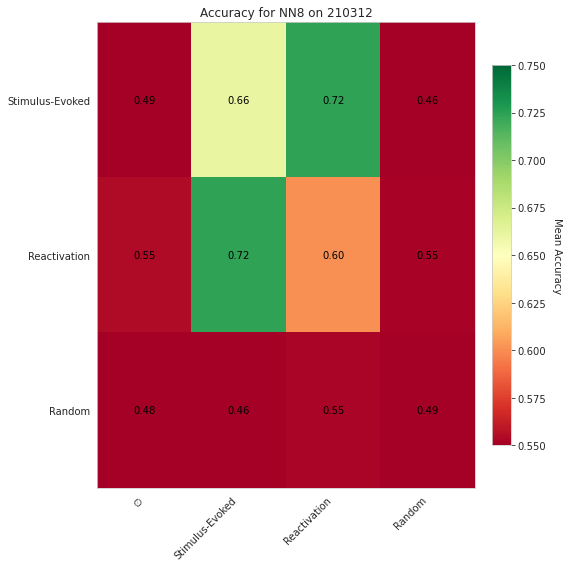

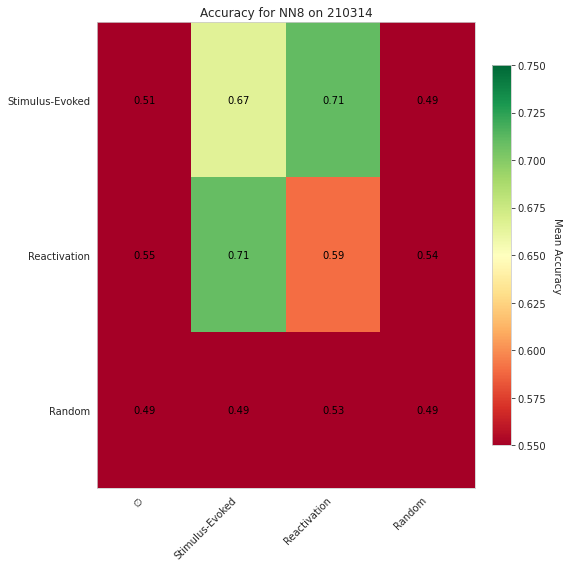

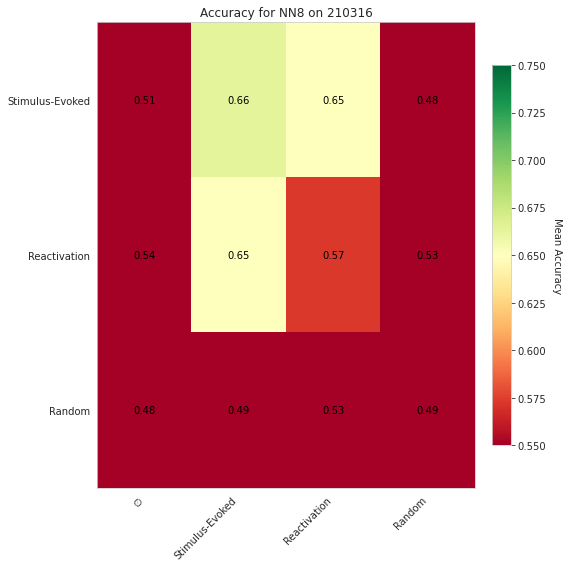

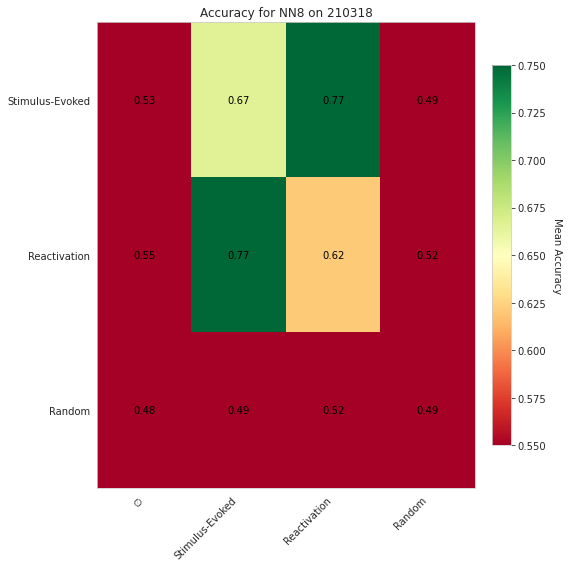

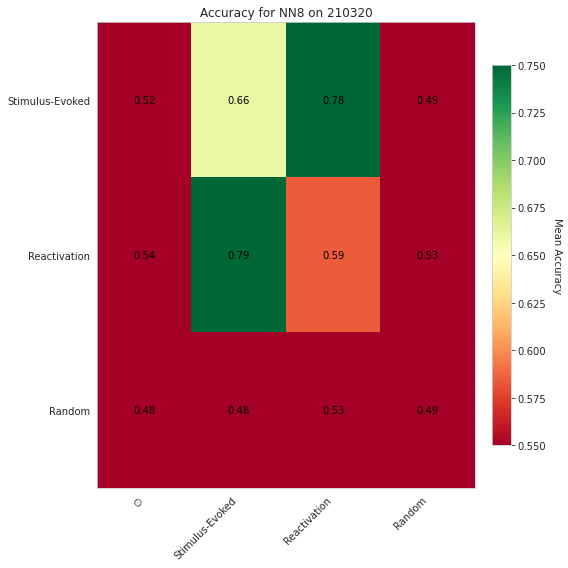

...

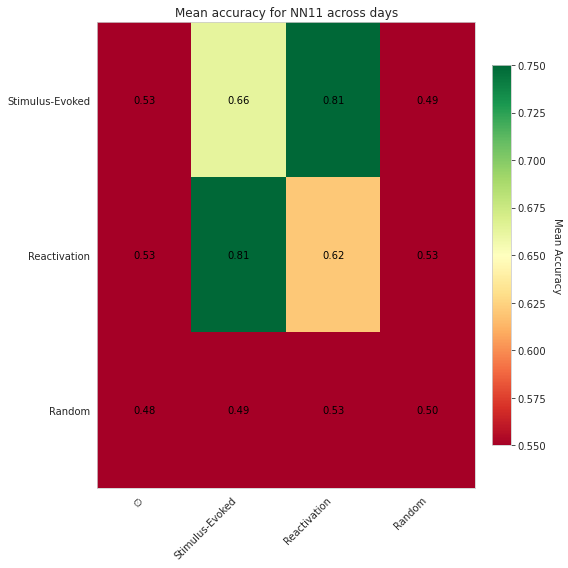

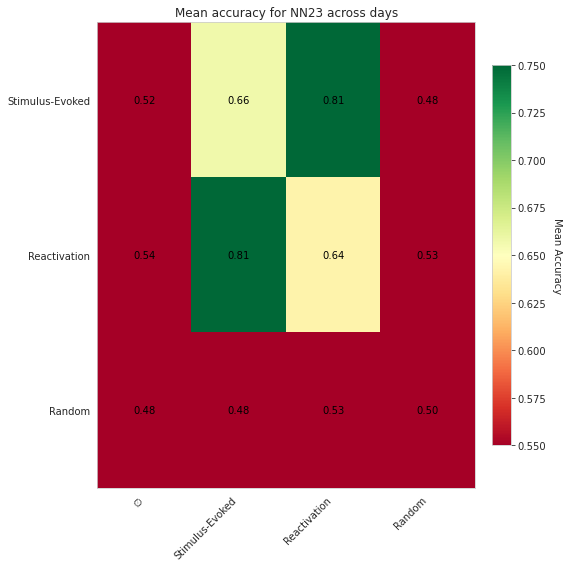

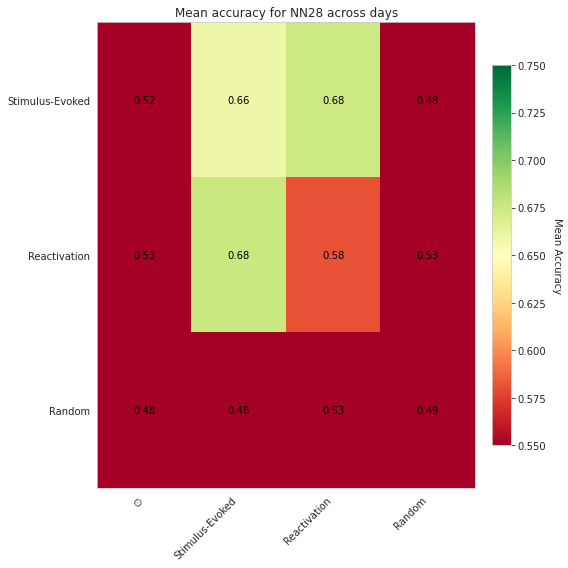

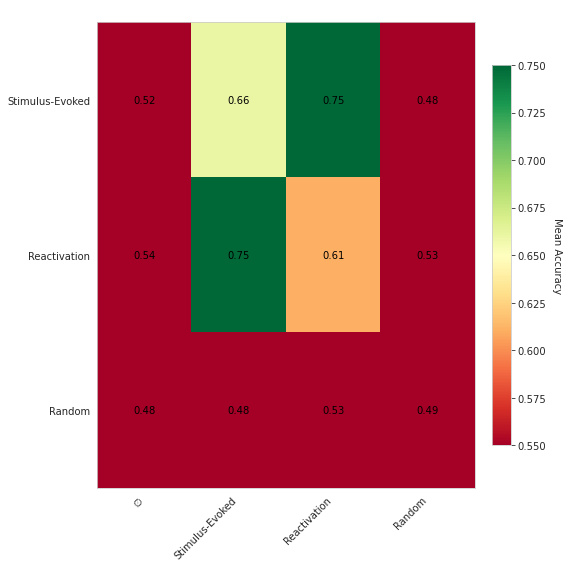

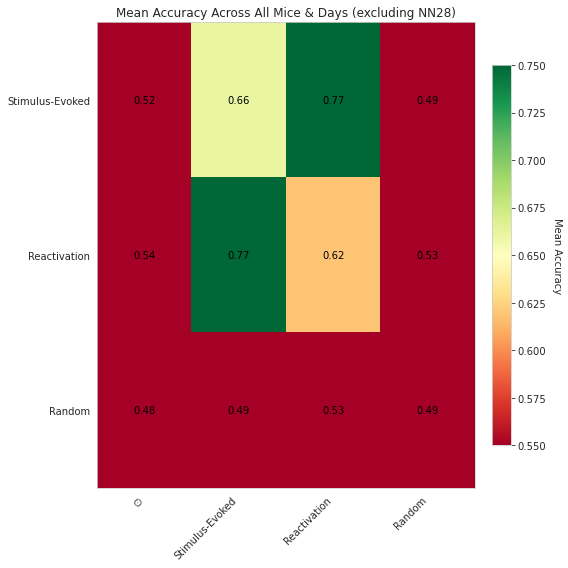

In [23]:
rows = ['Stimulus-Evoked', 'Reactivation', 'Random']
cols = ['∅', 'Stimulus-Evoked', 'Reactivation', 'Random']
cell_to_model = {
    ('Stimulus-Evoked',    '∅'):                        'SER_t_SER',
    ('Stimulus-Evoked',    'Stimulus-Evoked'):          'SER_min_SER_SER',
    ('Stimulus-Evoked',    'Reactivation'):             'SER_min_r_SER',
    ('Stimulus-Evoked',    'Random'):                   'RAND_ser_min_rand_SER',
    ('Reactivation',      '∅'):                         'r_SER',
    ('Reactivation',      'Stimulus-Evoked'):           'r_min_SER_SER',
    ('Reactivation',      'Reactivation'):              'r_plus_ri_SER',
    ('Reactivation',      'Random'):                    'ri_min_RAND_SER',
    ('Random', '∅'):                                    'RAND_SER',
    ('Random', 'Stimulus-Evoked'):                      'RAND_min_ser_SER',
    ('Random', 'Reactivation'):                         'RAND_ri_SER',
    ('Random', 'Random'):                               'RAND_min_rand_SER',
}

def plot_matrix(mean_acc, title, option):
    """Plot a single heatmap of mean accuracies."""
    mat = pd.DataFrame(index=rows, columns=cols, dtype=float)
    for (r, c), model_name in cell_to_model.items():
        mat.at[r, c] = mean_acc.get(model_name, np.nan)
    data = mat.values

    if option == 'normal' or None:
        fig, ax = plt.subplots(figsize=(8,8))
    if option == 'lags':
        fig, ax = plt.subplots(figsize=(15,8))
    im = ax.imshow(
        data,
        cmap='RdYlGn',
        vmin=0.55,
        vmax=0.75,
        aspect='auto'
    )

    ax.set_xticks(np.arange(len(cols)))
    ax.set_xticklabels(cols, rotation=45, ha='right')
    ax.set_yticks(np.arange(len(rows)))
    ax.set_yticklabels(rows)

    for i in range(len(rows)):
        for j in range(len(cols)):
            val = data[i, j]
            if not np.isnan(val):
                ax.text(j, i, f"{val:.2f}", ha='center', va='center', color='black')

    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label('Mean Accuracy', rotation=270, labelpad=15)
    ax.set_title(title)
    plt.tight_layout()
    plt.show()

# per mouse, per day
for mouse, df in all_mice_results.items():
    # df has columns: ['mouse', 'date', 'model', 'all_accs', 'mean_accuracy', 'std_accuracy']
    for date, df_date in df.groupby('date'):
        mean_acc = df_date.set_index('model')['mean_accuracy'].to_dict()
        plot_matrix(
            mean_acc,
            title=f"Accuracy for {mouse} on {date}",
            option='normal'
        )

# per mouse, across all days
for mouse, df in all_mice_results.items():
    mean_acc_mouse = df.groupby('model')['mean_accuracy'].mean().to_dict()
    plot_matrix(
        mean_acc_mouse,
        title=f"Mean accuracy for {mouse} across days",
        option='normal'
    )

# across all mice & days
combined = pd.concat(all_mice_results.values(), ignore_index=True)
mean_acc_across = combined.groupby('model')['mean_accuracy'].mean().to_dict()
plot_matrix(
    mean_acc_across,
    title=" ",
    option='normal'
)


combined_no_nn28 = combined[combined['mouse'] != 'NN28']
mean_acc_across = combined_no_nn28.groupby('model')['mean_accuracy'].mean().to_dict()
plot_matrix(
    mean_acc_across,
    title="Mean Accuracy Across All Mice & Days (excluding NN28)",
    option='normal'
)




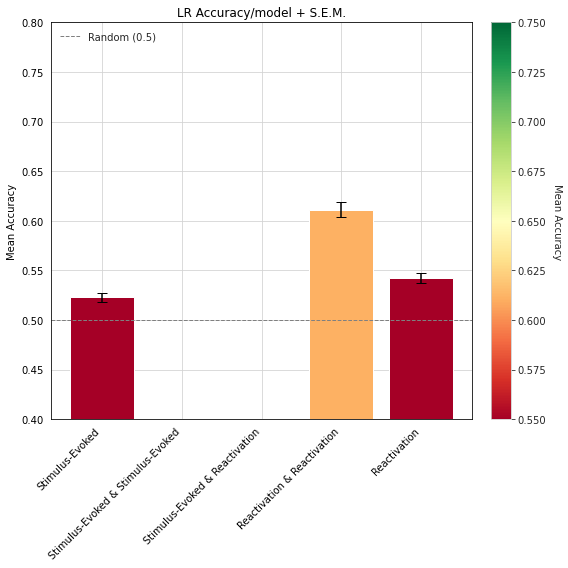

In [82]:
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

def plot_bar_mean_acc(all_mice_results, title=None):
    """
    Bar‐plot of mean accuracy ± SEM for chosen (row, col) pairs.
    
    Parameters
    ----------
    all_mice_results : dict
        mapping mouse → DataFrame with columns ['model','mean_accuracy'],
        indexed by day (or otherwise concatenable).
    title : str, optional
    """
    pairs = [
        ('Stimulus-Evoked',    '∅'),
        ('Stimulus-Evoked',    'Stimulus-Evoked'),
        ('Stimulus-Evoked',    'Reactivation'),
        ('Reactivation',   'Reactivation'),
        ('Reactivation',   '∅'),
    ]
    
    # build session‐wise lists
    session_vals = {pair: [] for pair in pairs}
    combined = pd.concat(all_mice_results.values(), ignore_index=True)
    
    for pair in pairs:
        model = cell_to_model[pair]
        # extract all accuracies for this model across sessions
        vals = combined.loc[combined['model'] == model, 'mean_accuracy'].values
        session_vals[pair] = vals
    
    # compute means and SEMs
    means = np.array([session_vals[p].mean() for p in pairs])
    sems  = np.array([session_vals[p].std(ddof=1)/np.sqrt(len(session_vals[p]))
                      for p in pairs])

    labels = []
    for r, c in pairs:
        if c == '∅':
            labels.append(r)
        else:
            labels.append(f"{r} & {c}")
    
    # colour map
    cmap = plt.get_cmap('RdYlGn')
    norm = Normalize(vmin=0.55, vmax=0.75)
    colors = [cmap(norm(m)) for m in means]
    
    # plot
    fig, ax = plt.subplots(figsize=(8,8))
    bars = ax.bar(labels, means, yerr=sems, capsize=5, color=colors)
    
    ax.axhline(0.5, linestyle='--', color='gray', linewidth=1, label='Random (0.5)')

    sm = ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])  
    cbar = fig.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label('Mean Accuracy', rotation=270, labelpad=15)
    
    ax.set_ylabel("Mean Accuracy")
    ax.set_ylim(0.4, 0.8)
    if title:
        ax.set_title(title)
    ax.legend(loc='upper left')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    for spine in ax.spines.values():
        spine.set_color('black')
    # force tick marks and tick labels to black
    ax.tick_params(axis='both', which='both', colors='black')
    # axis labels & title in black
    ax.set_ylabel("Mean Accuracy", color='black')
    ax.set_xlabel("")  # if you have an xlabel
    if title:
        ax.set_title(title, color='black')

    ax.set_ylim(0.4, 0.8)
    ax.legend(loc='upper left', frameon=False, edgecolor='black', facecolor='white')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.grid(True, color='lightgray') 
    plt.show()


plot_bar_mean_acc(
    all_mice_results,
    title="LR Accuracy/model + S.E.M."
)

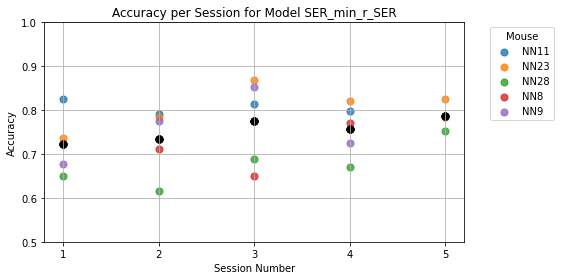

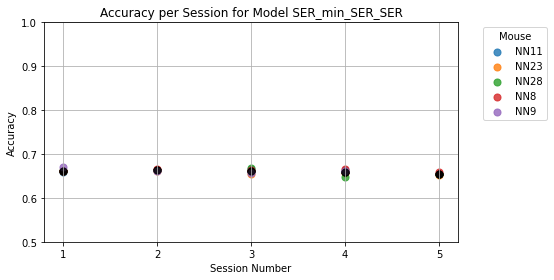

In [35]:
combined = pd.concat(all_mice_results.values(), ignore_index=True)

models = ['SER_min_r_SER', 'SER_min_SER_SER']

for model in models:
    df_model = combined[combined['model'] == model].copy()
    if df_model.empty:
        print(f"No data for model {model}, skipping.")
        continue

    df_model = df_model.sort_values(['mouse', 'date'])
    df_model['session'] = df_model.groupby('mouse').cumcount() + 1

    plt.figure(figsize=(8,4))
    for mouse, df_mouse in df_model.groupby('mouse'):
        plt.scatter(
            df_mouse['session'],
            df_mouse['mean_accuracy'],
            label=mouse,
            s=50,
            alpha=0.8
        )
        sess_means = df_model.groupby('session')['mean_accuracy'].mean()

        plt.scatter(
        sess_means.index,
        sess_means.values,
        color='black',
        s=50,           
        marker='o',
        alpha=.8
    )

    max_sess = df_model['session'].max()
    plt.xticks(ticks=range(1, max_sess+1))
    plt.xlabel('Session Number')
    plt.ylabel('Accuracy')
    plt.title(f'Accuracy per Session for Model {model}')
    plt.legend(title='Mouse', bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tight_layout()
    plt.grid(True)
    plt.ylim(0.5,1)
    plt.show()

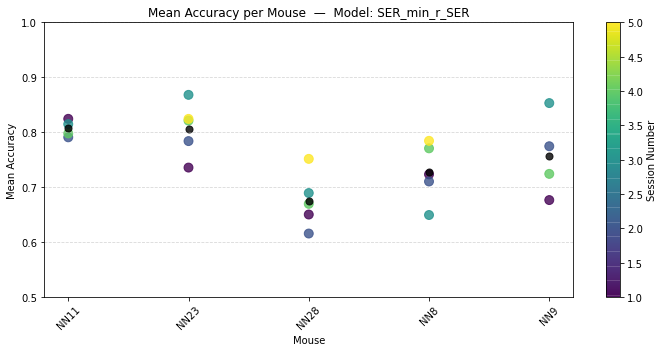

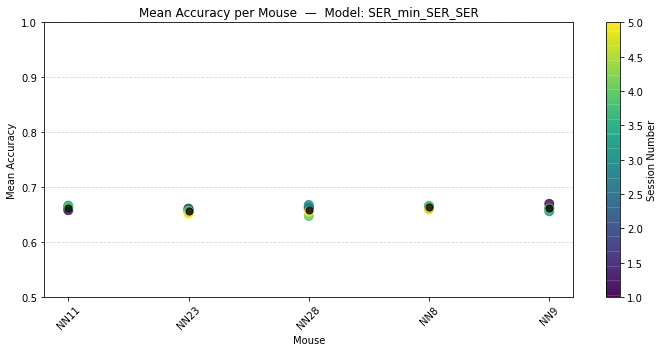

In [29]:
for model in models:
    df_model = combined[combined['model'] == model].copy()
    if df_model.empty:
        print(f"No data for model {model}, skipping.")
        continue

    # sort & assign session numbers per mouse
    df_model = df_model.sort_values(['mouse', 'date'])
    df_model['session'] = df_model.groupby('mouse').cumcount() + 1

    # now average across days *per* mouse & session
    df_avg = (
        df_model
        .groupby(['mouse', 'session'])['mean_accuracy']
        .mean()
        .reset_index()
    )

    # build a categorical x-axis for mice
    mice = sorted(df_avg['mouse'].unique())
    x_map = {m: i for i, m in enumerate(mice)}

    # set up colormap for session numbers
    sessions = df_avg['session'].unique()
    norm = plt.Normalize(vmin=sessions.min(), vmax=sessions.max())
    cmap = plt.cm.viridis

    plt.figure(figsize=(10,5))
    sc = plt.scatter(
        x=[x_map[m] for m in df_avg['mouse']],
        y=df_avg['mean_accuracy'],
        c=df_avg['session'],
        cmap=cmap,
        norm=norm,
        s=80,
        alpha=0.8
    )
    cbar = plt.colorbar(sc)
    cbar.set_label('Session Number')
    sess_means = df_model.groupby('mouse')['mean_accuracy'].mean()

    plt.scatter(
        sess_means.index,
        sess_means.values,
        color='black',
        s=50,           
        marker='o',
        alpha=0.8
    )

    plt.xticks(ticks=range(len(mice)), labels=mice, rotation=45)
    plt.xlabel('Mouse')
    plt.ylabel('Mean Accuracy')
    plt.title(f'Mean Accuracy per Mouse  —  Model: {model}')
    plt.ylim(0.5, 1.0)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

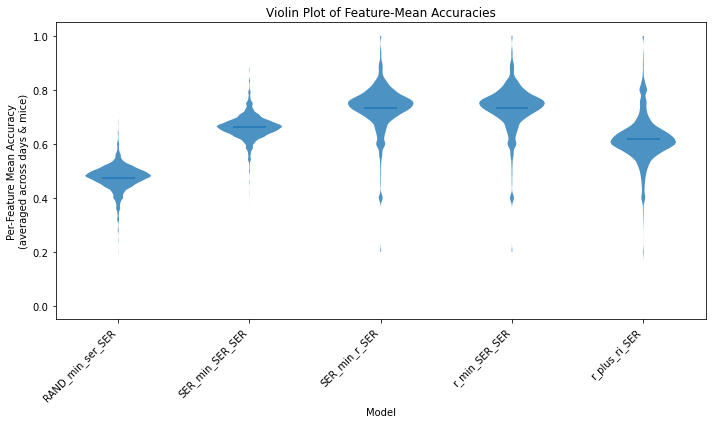

/opt/anaconda/lib/python3.7/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


                    Mixed Linear Model Regression Results
Model:                   MixedLM        Dependent Variable:       neuron_acc  
No. Observations:        4753135        Method:                   REML        
No. Groups:              5              Scale:                    0.0183      
Min. group size:         712880         Log-Likelihood:           2769153.6704
Max. group size:         1245545        Converged:                Yes         
Mean group size:         950627.0                                             
------------------------------------------------------------------------------
                                  Coef.  Std.Err.    z     P>|z| [0.025 0.975]
------------------------------------------------------------------------------
Intercept                          0.482    0.060    7.980 0.000  0.364  0.601
C(model)[T.RAND_min_rand_SER]      0.013    0.000   33.683 0.000  0.012  0.014
C(model)[T.RAND_min_ser_SER]       0.000    0.000    0.006 0.995 -0.001  

In [12]:
from scipy.stats import ttest_rel, probplot, ttest_ind
from statsmodels.stats.multitest import multipletests
import statsmodels.api as sm
from scipy.stats import wilcoxon
import scipy.stats as stats
import ast
import statsmodels.formula.api as smf



pairs_to_test = [
    ("SER_min_SER_SER",       "SER_min_r_SER"),
    ("SER_min_SER_SER",   "r_min_SER_SER"),
    ("SER_min_SER_SER",           "r_plus_ri_SER"),
    ("r_plus_ri_SER",        "RAND_min_ser_SER"),
    ("SER_min_SER_SER",       "RAND_min_ser_SER"),
    ("r_min_SER_SER",       "RAND_min_ser_SER"),
    ("SER_min_r_SER",       "RAND_min_ser_SER")
]

models = sorted({m for pair in pairs_to_test for m in pair})

accs_by_model = {m: [] for m in models}
for mouse, df in all_mice_results.items():
    df = df.copy()
    df['all_accs'] = df['all_accs'].apply(
        lambda cell: ast.literal_eval(cell) if isinstance(cell, str) else cell
    )
    for model in models:
        for lst in df.loc[df['model'] == model, 'all_accs']:
            accs_by_model[model].append(lst)

means_by_model = {}
for model, lists in accs_by_model.items():
    if not lists:
        continue
    max_len = max(len(l) for l in lists)
    padded = [
        np.array(l + [np.nan]*(max_len - len(l)), dtype=float)
        for l in lists
    ]
    mat = np.vstack(padded)
    means_by_model[model] = np.nanmean(mat, axis=0)

data = [means_by_model[m] for m in models if m in means_by_model]
labels = [m for m in models if m in means_by_model]

plt.figure(figsize=(10,6))
parts = plt.violinplot(data, showmeans=True, showmedians=False, showextrema=False)
for pc in parts['bodies']:
    pc.set_alpha(0.8)

plt.xticks(range(1, len(labels)+1), labels, rotation=45, ha='right')
plt.xlabel('Model')
plt.ylabel('Per-Feature Mean Accuracy\n(averaged across days & mice)')
plt.title('Violin Plot of Feature-Mean Accuracies')
plt.tight_layout()
plt.show()

rows = []
for mouse, df in all_mice_results.items():
    df = df.copy()
    df['all_accs'] = df['all_accs'].apply(
        lambda x: ast.literal_eval(x) if isinstance(x,str) else x
    )
    for _, row in df.iterrows():
        for acc in row['all_accs']:
            rows.append({
                'mouse': mouse,
                'model': row['model'],
                'neuron_acc': acc
            })
neuron_df = pd.DataFrame(rows)

md = smf.mixedlm("neuron_acc ~ C(model)", neuron_df, groups=neuron_df["mouse"])
res = md.fit()
print(res.summary())



# Predicting reactivations

In [ ]:
def compute_sign_changes_r(mean_activity_r):
    """
    Compute sign changes based on trial-to-trial differences and map them to reactivations.
    
    Parameters:
    - mean_activity_cs: Trial-level activity (shape: trials x neurons)
    - trial_r: Reactivation-to-trial mapping (shape: reactivations,)
    
    Returns:
    - sign_changes: Array of sign changes mapped to reactivations (-1 or +1) for each neuron wrt the next SER trial.
    """
    
    # Compute trial-to-trial differences
    trial_diff = np.diff(mean_activity_r, axis=0)  # Shape: (trials-1, neurons)

    # Compute signs of trial differences
    trial_sign_changes = np.where(trial_diff > 0, 1, -1)  # Shape: (trials-1, neurons)

    # Map trial-level changes to reactivations
    #reactivation_sign_changes = trial_sign_changes[trial_r]

    return trial_sign_changes #reactivation_sign_changes

def clean_and_prepare_data_r(mean_activity_r, mean_activity_cs, trial_r, metric):
    """
    Prepare predictors (X) and targets (y) for logistic regression
    
    Parameters:
    - mean_activity_r: Reactivation-level activity (shape: reactivations x neurons)
    - mean_activity_cs: Trial-level activity (shape: trials x neurons)
    - trial_r: Reactivation-to-trial mapping (shape: reactivations,)
    
    Returns:
    - X_all: Combined predictors (reactivation activity) for sensory evoked response (shape: total_reactivations, neurons).
    - y_all: Combined targets (sign changes) for all neurons (shape: total_reactivations, neurons).
    """
    X_list = []  # Predictors for all neurons
    y_list = []  # Targets for all neurons
    
    # Compute targets for all neurons
    for neuron in range(mean_activity_r.shape[1]):
        y_neuron = compute_sign_changes_r(mean_activity_r[:, neuron])
        y_list.append(y_neuron)

    # Prepare predictors for the subset of neurons
    for neuron in range(mean_activity_r.shape[1]):
        # Adjust SER activity by subtracting the reactivation activity
        if metric == 'substract':
            X_neuron = mean_activity_cs[trial_r, neuron] - mean_activity_r[:, neuron]
            X_list.append(X_neuron)
        
        if metric == 'add':
            X_neuron = mean_activity_cs[trial_r, neuron] + mean_activity_r[:, neuron]
            X_list.append(X_neuron)

        if metric == 'multiply':
            X_neuron = mean_activity_cs[trial_r, neuron] * mean_activity_r[:, neuron]
            X_list.append(X_neuron)

        if metric == 'divide':
            X_neuron = mean_activity_cs[trial_r, neuron] / mean_activity_r[:, neuron]
            X_list.append(X_neuron)

        if metric == 'other':
            X_neuron = mean_activity_r[:, neuron] - mean_activity_cs[trial_r, neuron] 
            X_list.append(X_neuron)
        
    # Stack all predictors and targets
    X_all = np.column_stack(X_list)  # Shape: (total_reactivations, subset_neurons)
    y_all = np.column_stack(y_list)  # Shape: (total_reactivations, total_neurons)
        
    return X_all, y_all

def add_random_baselines_R(results: dict,
                         activity: np.ndarray,
                         m1: np.ndarray,
                         m2: np.ndarray,
                         r1: np.ndarray,
                         r2: np.ndarray,
                         trial_r1: np.ndarray,
                         trial_r2: np.ndarray,
                         segment_length: int,
                         lr_fn) -> None:
    """
    Fill `results[...]` with the six random‐baseline models:
      - RAND_SER
      - RAND_min_rand_SER
      - RAND_min_ser_SER
      - RAND_ser_min_rand_SER
      - ri_min_RAND_SER
      - RAND_ri_SER
    """
    rand1 = sample_random_segments(activity, segment_length, r1.shape[0])
    rand2 = sample_random_segments(activity, segment_length, r2.shape[0])

    sign_changes = compute_sign_changes_rand(r1, r2)

    X = np.concatenate([rand1[:-2], rand2[:-2]], axis=0)
    results['RAND_R'] = lr_fn(X, sign_changes)

    rand1b = sample_random_segments(activity, segment_length, r1.shape[0])
    rand2b = sample_random_segments(activity, segment_length, r2.shape[0])

    X = np.concatenate([rand1b - rand1, rand2b - rand2], axis=0)[:-2]
    results['RAND_min_rand_R'] = lr_fn(X, sign_changes)

    n1 = min(rand1.shape[0], m1.shape[0])
    n2 = min(rand2.shape[0], m2.shape[0])

    X = np.concatenate([
        rand1[:n1] - m1[:n1], rand2[:n2] - m2[:n2]], axis=0)[:-2]
    results['RAND_min_ser_R'] = lr_fn(X, sign_changes)

    X = np.concatenate([
        m1[:n1] - rand1[:n1], m2[:n2] - rand2[:n2]], axis=0)[:-2]
    results['RAND_ser_min_rand_R'] = lr_fn(X, sign_changes)

    X = np.concatenate([rand1 - r1, rand2 - r2], axis=0)[:-2]
    results['RAND_ri_R'] = lr_fn(X, sign_changes)

    X = np.concatenate([r1 - rand1, r2 - rand2], axis=0)[:-2]
    results['ri_min_RAND_R'] = lr_fn(X, sign_changes)

In [ ]:
def LR_across_days_R(day_outputs):
    all_LR_results = {}
    output_dir="LR_results/R"
    os.makedirs(output_dir, exist_ok=True)

    for mouse, day_dict in day_outputs.items():
        if mouse not in ['NN23', 'NN28']:
            continue
        all_LR_results[mouse] = {}
        print(f"{mouse}")
        daily_dfs = [] 

        for date, out in day_dict.items():
            print(f"{date}")
            m1, m2 = out['mean_activity_cs_1'], out['mean_activity_cs_2']
            r1, r2 = out['mean_activity_r_1'], out['mean_activity_r_2']
            trial_r1, trial_r2 = out['trial_r_1'], out['trial_r_2']
            activity = out["activity"]

            LR_day_results = {}

            # 1) SER(t) - R → R(t+1)
            X_cs_1, y_cs_1_clean = clean_and_prepare_data_r(r1, m1, trial_r1, metric = 'substract')
            X_cs_2, y_cs_2_clean = clean_and_prepare_data_r(r2, m2, trial_r2, metric = 'substract')
            X_all = np.concatenate([X_cs_1[:-1, ], X_cs_2[:-1, ]])
            y_all = np.concatenate([y_cs_1_clean, y_cs_2_clean]) 
            LR_day_results['SER_min_r_R'] = LR_model_torch(X_all, y_all)

            # 2) SER(t) + R → R(t+1)
            X_cs_1, y_cs_1_clean = clean_and_prepare_data_r(r1, m1, trial_r1, metric = 'add')
            X_cs_2, y_cs_2_clean = clean_and_prepare_data_r(r2, m2, trial_r2, metric = 'add')
            X_all = np.concatenate([X_cs_1[:-1, ], X_cs_2[:-1, ]])  
            LR_day_results['SER_add_r_R'] = LR_model_torch(X_all, y_all)

            # 3) SER(t) * R
            X_cs_1, y_cs_1_clean = clean_and_prepare_data_r(r1, m1, trial_r1, metric = 'multiply')
            X_cs_2, y_cs_2_clean = clean_and_prepare_data_r(r2, m2, trial_r2, metric = 'multiply')
            X_all = np.concatenate([X_cs_1[:-1, ], X_cs_2[:-1, ]])  
            LR_day_results['SER_mult_r_R'] = LR_model_torch(X_all, y_all)

            # 4) SER(t) / R
            X_cs_1, y_cs_1_clean = clean_and_prepare_data_r(r1, m1, trial_r1, metric = 'divide')
            X_cs_2, y_cs_2_clean = clean_and_prepare_data_r(r2, m2, trial_r2, metric = 'divide')
            X_all = np.concatenate([X_cs_1[:-1, ], X_cs_2[:-1, ]])  
            LR_day_results['SER_div_r_R'] = LR_model_torch(X_all, y_all)

            # 5) R - SER
            X_cs_1, y_cs_1_clean = clean_and_prepare_data_r(r1, m1, trial_r1, metric = 'other')
            X_cs_2, y_cs_2_clean = clean_and_prepare_data_r(r2, m2, trial_r2, metric = 'other')
            X_all = np.concatenate([X_cs_1[:-1, ], X_cs_2[:-1, ]])  
            LR_day_results['R_min_SER_R'] = LR_model_torch(X_all, y_all)

            # 6) SER(t) 
            X_all = np.concatenate([m1[trial_r1[:-1], ], m2[trial_r2[:-1], ]]) 
            LR_day_results['SER_R'] = LR_model_torch(X_all, y_all)

            # 7) SER(t) - SER(t−1)
            X_cs_1_diff = np.diff(m1[trial_r1, ], axis=0)
            X_cs_2_diff = np.diff(m2[trial_r2, ], axis=0)
            X_all = np.concatenate([X_cs_1_diff, X_cs_2_diff]) 
            LR_day_results['SER_min_SER_R'] = LR_model_torch(X_all, y_all)

            # 8) SER + SER
            m1_t = m1[trial_r1, ]
            m2_t = m2[trial_r2, ]
            X_cs_1_sum = m1_t[:-1, ] + m1_t[1:, ]
            X_cs_2_sum = m2_t[:-1, ] + m2_t[1:, ]
            X_all = np.concatenate([X_cs_1_sum, X_cs_2_sum], axis=0)
            LR_day_results['SER_plus_SER_R'] = LR_model_torch(X_all, y_all)

            # 9) R
            X_all = np.concatenate([r1[:-1, ], r2[:-1, ]])
            y_1 = np.diff(r1, axis=0)
            y_2 = np.diff(r2, axis=0)
            y_all = np.concatenate([y_1, y_2])
            y_all = np.where(y_all > 0, 1, -1)
            LR_day_results['r_R'] = LR_model_torch(X_all, y_all)

            # 10) R - R
            x_1 = np.diff(r1, axis= 0)
            x_2 = np.diff(r2, axis= 0)
            X_all = np.concatenate([x_1[:-1, ], x_2[:-1, ]])
            y_all = np.concatenate([y_1[1:, ], y_2[1:, ]])
            y_all = np.where(y_all > 0, 1, -1)
            LR_day_results['r_min_r_R'] = LR_model_torch(X_all,
                                        y_all)

            # 11) R + R
            X_cs_1_sum = r1[:-1, ] + r1[1:, ]
            X_cs_2_sum = r2[:-1, ] + r2[1:, ]
            X_all = np.concatenate([X_cs_1_sum[:-1,  ], X_cs_2_sum[:-1, ]])
            LR_day_results['r_plus_r_R']= LR_model_torch(X_all,
                                        y_all)
            
            # 12) R * R
            X_cs_1_mult = r1[:-1, ] * r1[1:, ]
            X_cs_2_mult = r2[:-1, ] * r2[1:, ]
            X_all = np.concatenate([X_cs_1_mult[:-1,  ], X_cs_2_mult[:-1, ]])
            LR_day_results['r_mult_r_R'] = LR_model_torch(X_all, y_all)

            # 13) R / R
            X_cs_1_div = r1[:-1, ] / r1[1:, ]
            X_cs_2_div = r2[:-1, ] / r2[1:, ]
            X_all = np.concatenate([X_cs_1_div[:-1,  ], X_cs_2_div[:-1, ]])
            LR_day_results['r_mult_r_R'] = LR_model_torch(X_all, y_all)

            add_random_baselines_R(
                LR_day_results,
                activity, m1, m2, r1, r2, trial_r1, trial_r2,
                segment_length=5,
                lr_fn=LR_model_torch
            )

            all_accs = {k: v['Accuracy'] for k, v in LR_day_results.items()}
            mean_acc = {k: np.mean(v["Accuracy"]) for k, v in LR_day_results.items()}
            std_acc  = {k: np.std(v["Accuracy"])  for k, v in LR_day_results.items()}

            df = pd.DataFrame({
                'model': list(mean_acc.keys()),
                'all_accs': list(all_accs.values()),
                'mean_accuracy': list(mean_acc.values()),
                'std_accuracy':  [std_acc[k] for k in mean_acc.keys()]
            })

            all_LR_results[mouse][date] = df

            df_daily = df.copy()
            df_daily['mouse'] = mouse
            df_daily['date']  = date
            daily_fname = os.path.join(output_dir, f"{mouse}_{date}_LR_results_R.csv")
            df_daily.to_csv(daily_fname, index=False)
            daily_dfs.append(df_daily)

        if daily_dfs:
            df_mouse = pd.concat(daily_dfs, ignore_index=True)
            mouse_fname = os.path.join(output_dir, f"{mouse}_all_days_LR_results_R.csv")
            df_mouse.to_csv(mouse_fname, index=False)

    return all_LR_results

All_mice_LR_R = LR_across_days_R(day_outputs)

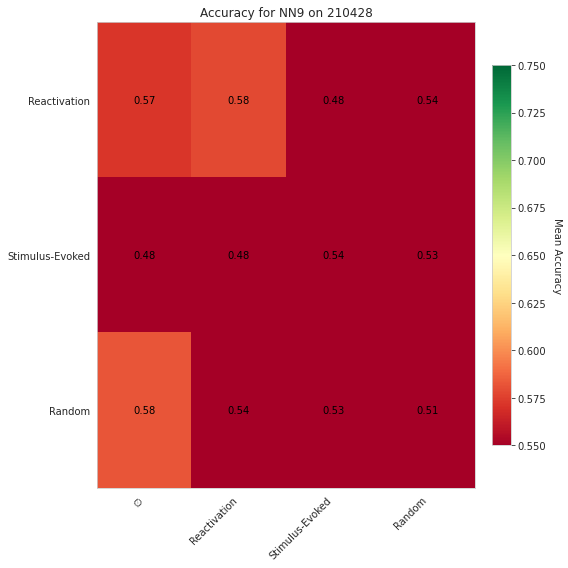

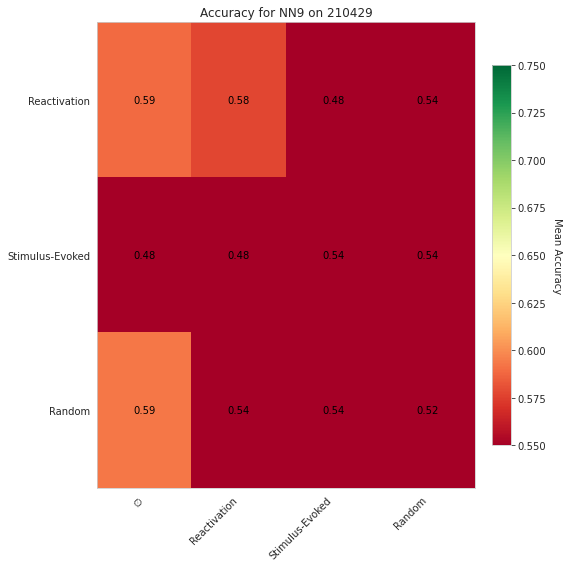

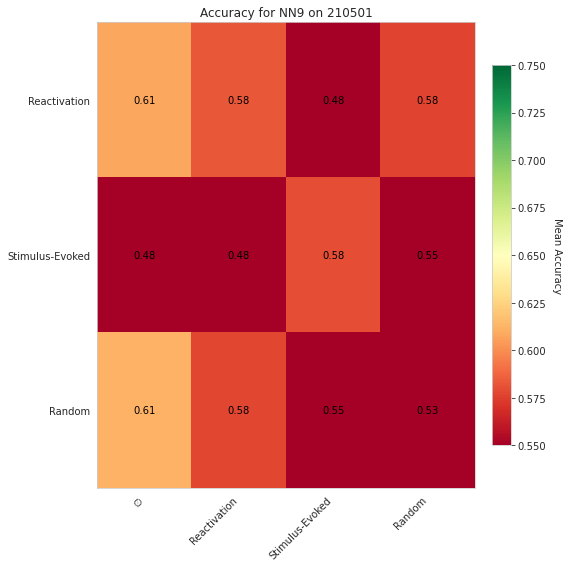

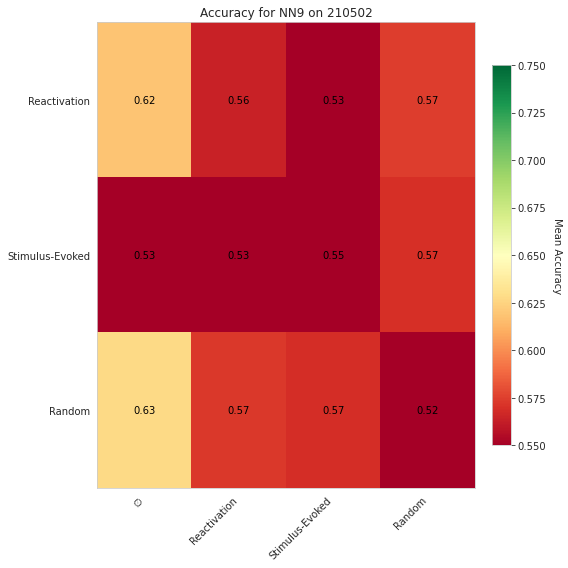

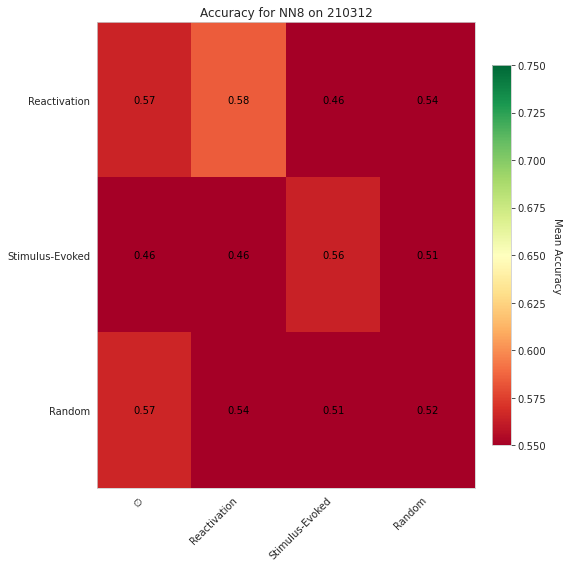

...

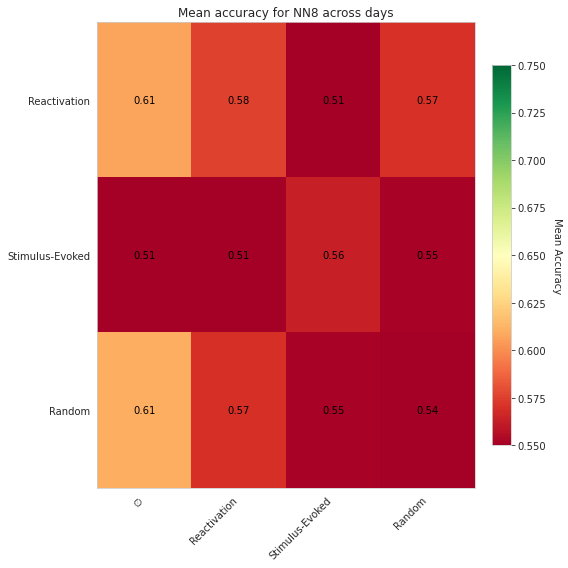

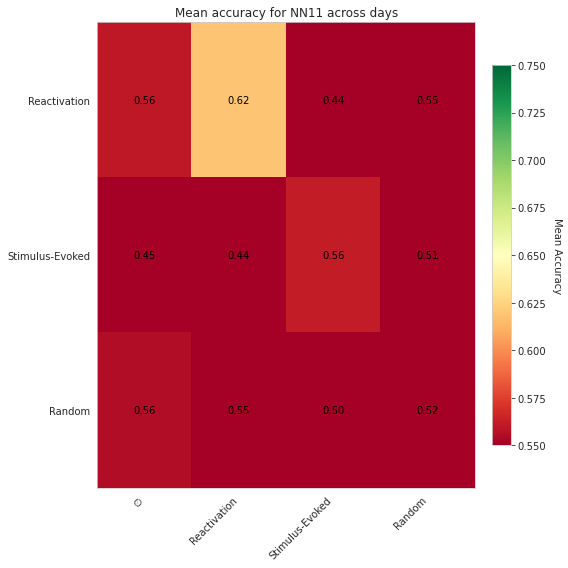

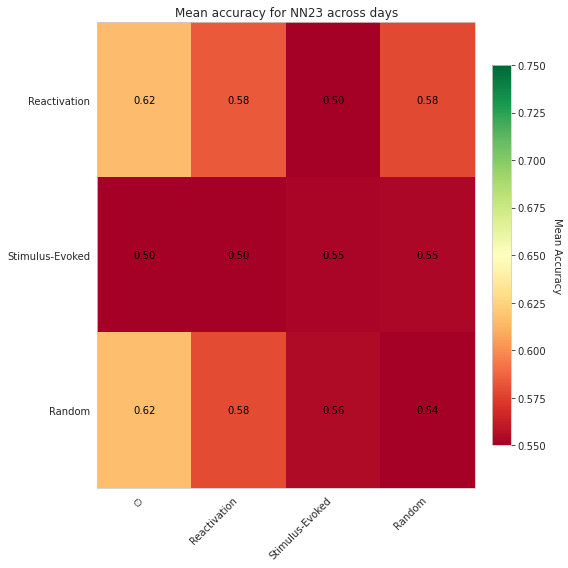

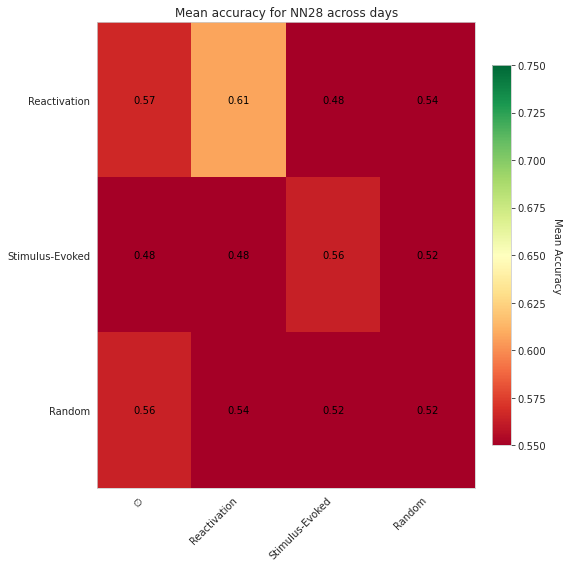

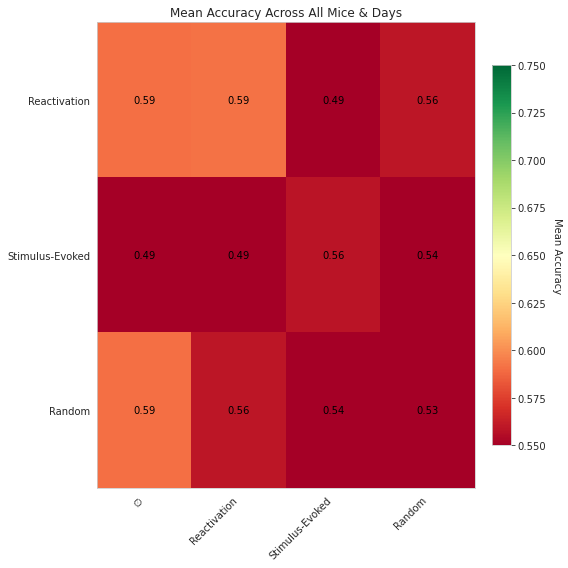

In [30]:
rows = ['Reactivation', 'Stimulus-Evoked', 'Random']
cols = ['∅', 'Reactivation', 'Stimulus-Evoked', 'Random']
cell_to_model = {
    ('Reactivation',      '∅'):                         'r_R',
    ('Reactivation',      'Stimulus-Evoked'):           'R_min_SER_R',
    ('Reactivation',      'Reactivation'):              'r_min_r_R',
    ('Reactivation',      'Random'):                    'ri_min_RAND_R',
    ('Stimulus-Evoked',    '∅'):                        'SER_R',
    ('Stimulus-Evoked',    'Stimulus-Evoked'):          'SER_min_SER_R',
    ('Stimulus-Evoked',    'Reactivation'):             'SER_min_r_R',
    ('Stimulus-Evoked',    'Random'):                   'RAND_ser_min_rand_R',
    ('Random', '∅'):                                    'RAND_R',
    ('Random', 'Stimulus-Evoked'):                      'RAND_min_ser_R',
    ('Random', 'Reactivation'):                         'RAND_ri_R',
    ('Random', 'Random'):                               'RAND_min_rand_R',
}

output_dir = "LR_results/R"

# find every file that ends with _all_days_LR_results.csv
pattern = os.path.join(output_dir, "*_all_days_LR_results_R.csv")

All_mice_LR_R = {}

for filepath in glob.glob(pattern):
    # extract the mouse ID from the filename, e.g. "NN23_all_days_LR_results.csv" → "NN23"
    fname = os.path.basename(filepath)
    mouse = fname.split("_all_days_LR_results_R.csv")[0]
    
    # load it
    df = pd.read_csv(filepath)
    
    # store in a dict keyed by mouse
    All_mice_LR_R[mouse] = df

for mouse, df in All_mice_LR_R.items():
    # df has columns: ['mouse', 'date', 'model', 'all_accs', 'mean_accuracy', 'std_accuracy']
    for date, df_date in df.groupby('date'):
        mean_acc = df_date.set_index('model')['mean_accuracy'].to_dict()
        plot_matrix(
            mean_acc,
            title=f"Accuracy for {mouse} on {date}",
            option='normal'
        )

# per mouse, across all days
for mouse, df in All_mice_LR_R.items():
    mean_acc_mouse = df.groupby('model')['mean_accuracy'].mean().to_dict()
    plot_matrix(
        mean_acc_mouse,
        title=f"Mean accuracy for {mouse} across days",
        option='normal'
    )

# across all mice & days
combined = pd.concat(All_mice_LR_R.values(), ignore_index=True)
mean_acc_across = combined.groupby('model')['mean_accuracy'].mean().to_dict()
plot_matrix(
    mean_acc_across,
    title="Mean Accuracy Across All Mice & Days",
    option='normal'
)


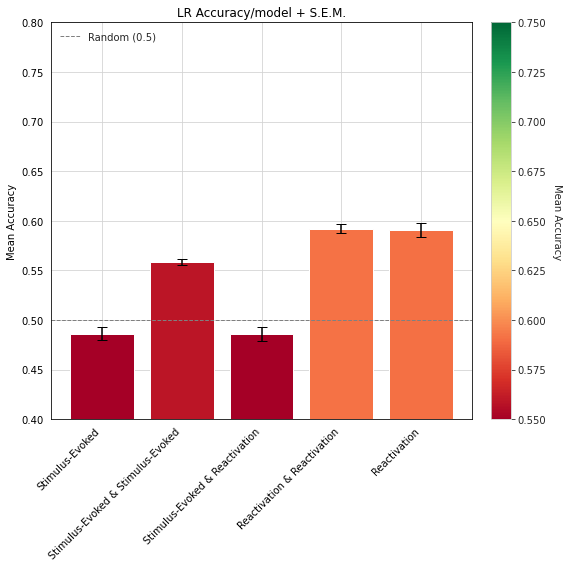

In [ ]:
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable


plot_bar_mean_acc(
    all_mice_results,
    title="LR Accuracy/model + S.E.M."
)

In [ ]:
from collections import defaultdict
from scipy.stats import ttest_rel 

pairs_to_test = [
    ("SER_min_SER_R",       "SER_min_r_R"),
    ("SER_min_SER_R",   "R_min_SER_R"),
    ("SER_min_SER_R",           "r_min_r_R"),
    ("r_min_r_R",        "RAND_min_ser_R"),
    ("SER_min_SER_R",       "RAND_min_ser_R"),
    ("R_min_SER_R",       "RAND_min_ser_R"),
    ("SER_min_r_R",       "RAND_min_ser_R")
]

# ─── per-mouse (across days) significance ───────────────────────
for mouse, date_dict in All_mice_LR_R.items():
    # build lists of per-day accuracies
    acc_lists = defaultdict(list)
    for date, df in date_dict.items():
        for _, row in df.iterrows():
            acc_lists[row['model']].append(row['mean_accuracy'])

    print(f"\n=== {mouse} per-mouse tests (across {len(date_dict)} days) ===")
    for m1, m2 in pairs_to_test:
        if m1 in acc_lists and m2 in acc_lists:
            a1 = np.array(acc_lists[m1])
            a2 = np.array(acc_lists[m2])
            t_stat, p_val = ttest_rel(a1, a2)
            print(f"{m1} vs {m2}: t={t_stat:.3f}, p={p_val:.3f}")
        else:
            print(f"Skipping {m1} vs {m2} (missing data)")

# ─── grand (all mice & days) significance ───────────────────────
acc_lists_all = defaultdict(list)
for mouse, date_dict in All_mice_LR_R.items():
    for date, df in date_dict.items():
        for _, row in df.iterrows():
            acc_lists_all[row['model']].append(row['mean_accuracy'])

print(f"\n=== Grand tests across all mice & days ===")
for m1, m2 in pairs_to_test:
    if m1 in acc_lists_all and m2 in acc_lists_all:
        a1 = np.array(acc_lists_all[m1])
        a2 = np.array(acc_lists_all[m2])
        t_stat, p_val = ttest_rel(a1, a2)
        print(f"{m1} vs {m2}: t={t_stat:.3f}, p={p_val:.3f}")
    else:
        print(f"Skipping {m1} vs {m2} (missing data)")


# Lags

In [ ]:
def safe_lr_call(name, X, y, lr_fn, n_splits=5):
    """
    If X has fewer than n_splits samples or y is constant,
    return a dummy dict with NaNs; otherwise run lr_fn.
    """
    n_samples = X.shape[0]
    # Need at least n_splits samples, and at least 2 classes in y
    if n_samples < n_splits or len(np.unique(y)) < 2:
        dummy = {
            "Accuracy": np.array([np.nan]),
            "Precision": np.array([np.nan]),
            "Recall": np.array([np.nan]),
            "F1": np.array([np.nan])
        }
        return dummy
    else:
        return lr_fn(X, y)


def LR_lags_across_days(day_outputs):

    all_LR_results = {}
    output_dir="LR_results/Lags"
    os.makedirs(output_dir, exist_ok=True)

    for mouse, day_dict in day_outputs.items():
        all_LR_results[mouse] = {}
        daily_dfs = [] 


        for date, out in day_dict.items():

            m1, m2 = out['mean_activity_cs_1'], out['mean_activity_cs_2']
            r1, r2 = out['mean_activity_r_1'], out['mean_activity_r_2']
            trial_r1, trial_r2 = out['trial_r_1'], out['trial_r_2']
            activity = out["activity"]
            LR_day_results = {}

            X_cs_1, y_cs_1_clean = clean_and_prepare_data(r1, m1, trial_r1, metric= 'substract')
            X_cs_2, y_cs_2_clean = clean_and_prepare_data(r2, m2, trial_r2, metric= 'substract')
            
            x1, y1 = np.diff(m1, axis= 0), np.diff(m1, axis= 0)
            x2, y2 = np.diff(m2, axis=0), np.diff(m2, axis= 0)

            for lag in range(6):
                #reactivations
                if lag == 0:
                    Xr = np.concatenate([X_cs_1, X_cs_2], axis=0)
                    yr = np.concatenate([y_cs_1_clean, y_cs_2_clean], axis=0)
                    print(Xr.shape, yr.shape)

                else:
                    Xr = np.concatenate([X_cs_1[:-lag, ], X_cs_2[:-lag, ]], axis=0)
                    yr = np.concatenate([y_cs_1_clean[lag:, ], y_cs_2_clean[lag:, ]], axis=0)
                
                key_r = f"ri_min_SER_lag_{lag}_SER"
                LR_day_results[key_r] = safe_lr_call(key_r, Xr, yr, LR_model_torch)
                print(f"{date} added model ri_min_SER_lag_{lag}_SER")

                #SERs
                if lag == 0:
                    Xs = np.concatenate([x1[:-1, ], x2[:-1, ]], axis=0)
                    ys = np.concatenate([y1[1:, ], y2[1:, ]], axis=0)
                else:
                    steps = lag + 1
                    Xs = np.concatenate([x1[:-steps, ], x2[:-steps, ]], axis=0)
                    ys = np.concatenate([y1[steps:, ],  y2[steps:, ]], axis=0)

                key_s = f"SER_lag_{lag}_SER"
                LR_day_results[key_s] = safe_lr_call(key_s, Xs, ys, LR_model_torch)
                print(f"{date} added model SER_lag_{lag}_SER")

            all_accs = {k: v['Accuracy'] for k, v in LR_day_results.items()}
            mean_acc = {k: np.mean(v["Accuracy"]) for k, v in LR_day_results.items()}
            std_acc  = {k: np.std(v["Accuracy"])  for k, v in LR_day_results.items()}

            df = pd.DataFrame({
                'model': list(mean_acc.keys()),
                'all_accs': list(all_accs.values()),
                'mean_accuracy': list(mean_acc.values()),
                'std_accuracy':  [std_acc[k] for k in mean_acc.keys()]
            })

            all_LR_results[mouse][date] = df

            df_daily = df.copy()
            df_daily['mouse'] = mouse
            df_daily['date']  = date
            daily_fname = os.path.join(output_dir, f"{mouse}_{date}_Lag_results.csv")
            df_daily.to_csv(daily_fname, index=False)
            daily_dfs.append(df_daily)

        if daily_dfs:
            df_mouse = pd.concat(daily_dfs, ignore_index=True)
            mouse_fname = os.path.join(output_dir, f"{mouse}_all_days_Lag_results_.csv")
            df_mouse.to_csv(mouse_fname, index=False)


    return all_LR_results

All_mice_lag = LR_lags_across_days(day_outputs)

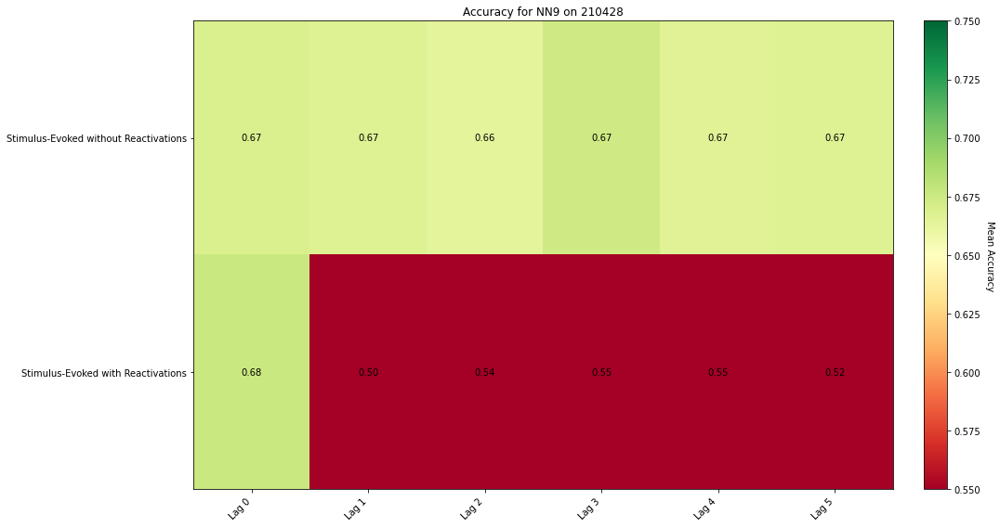

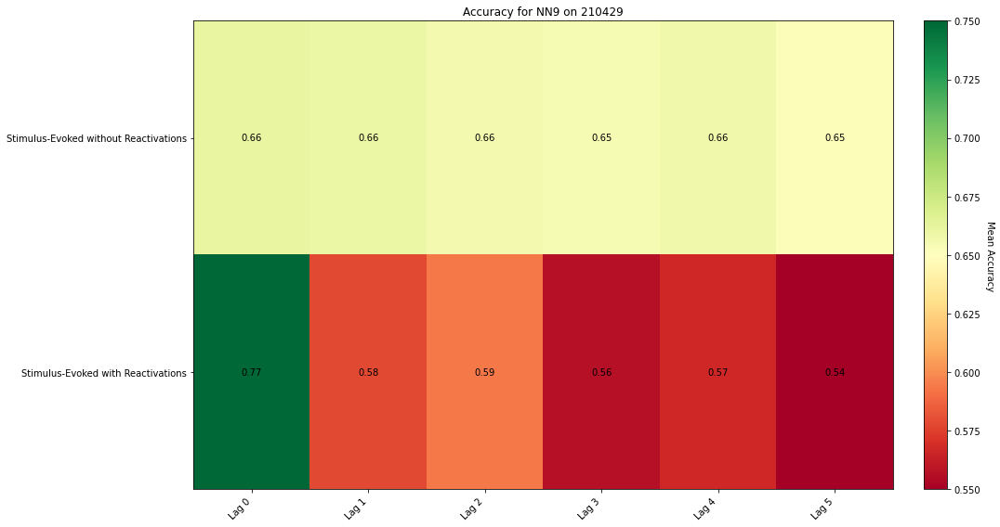

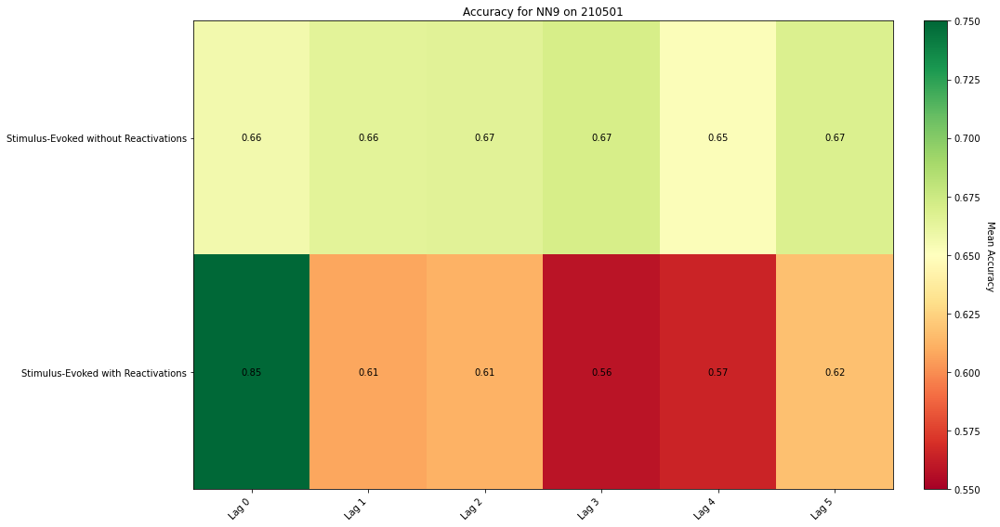

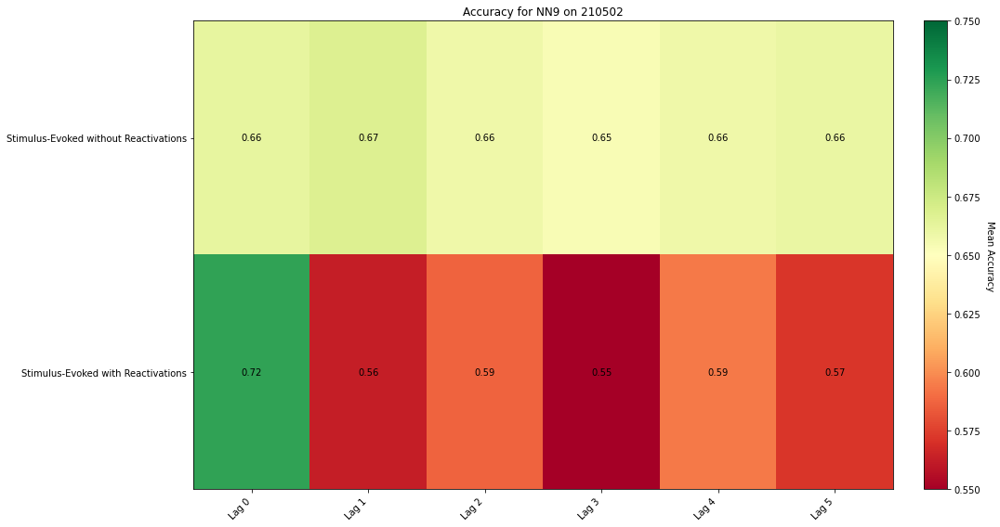

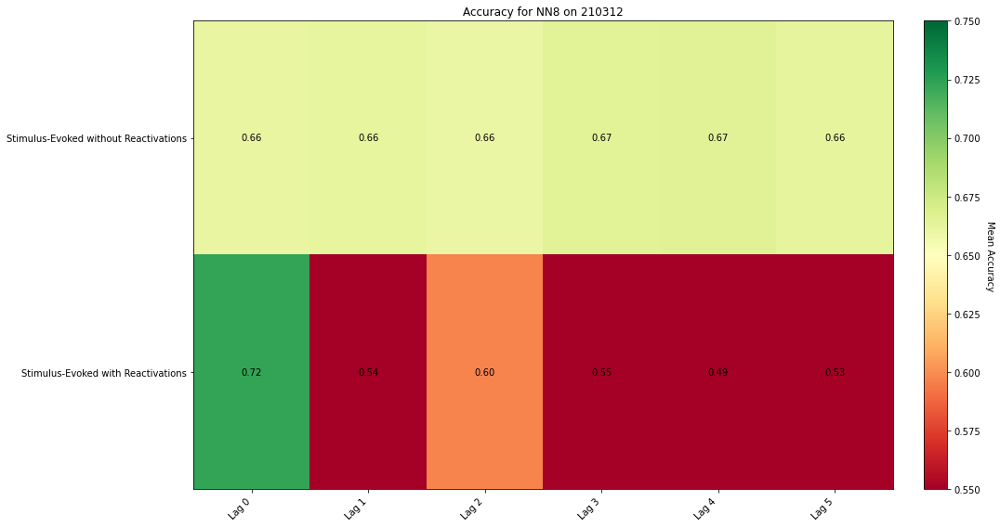

...

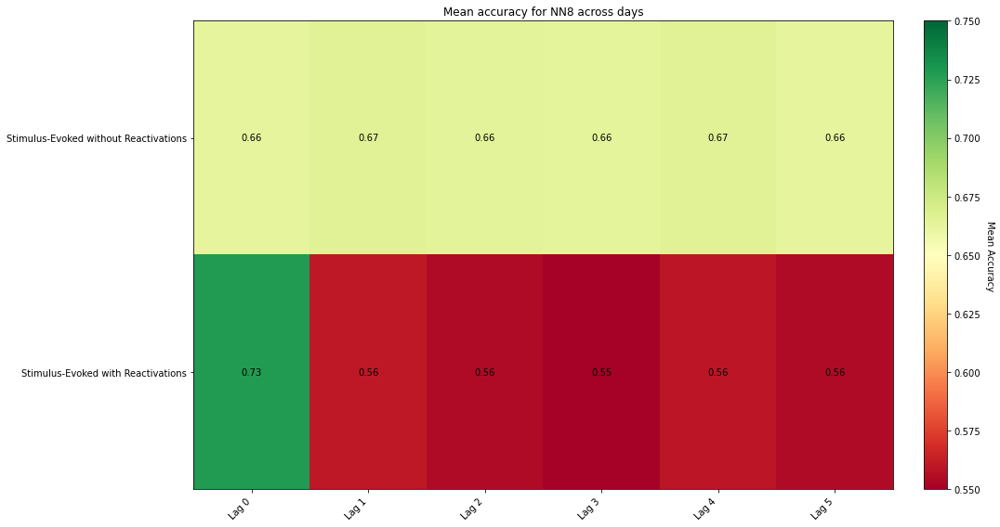

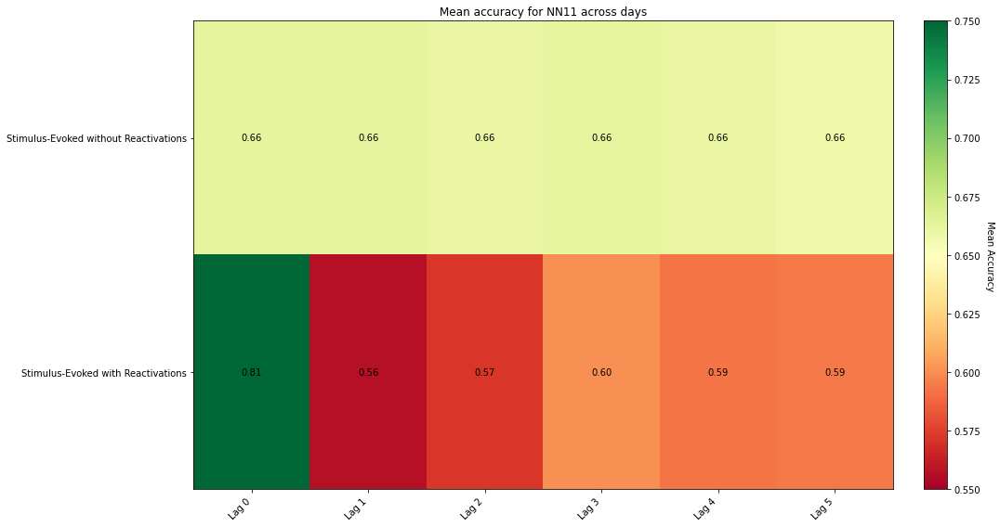

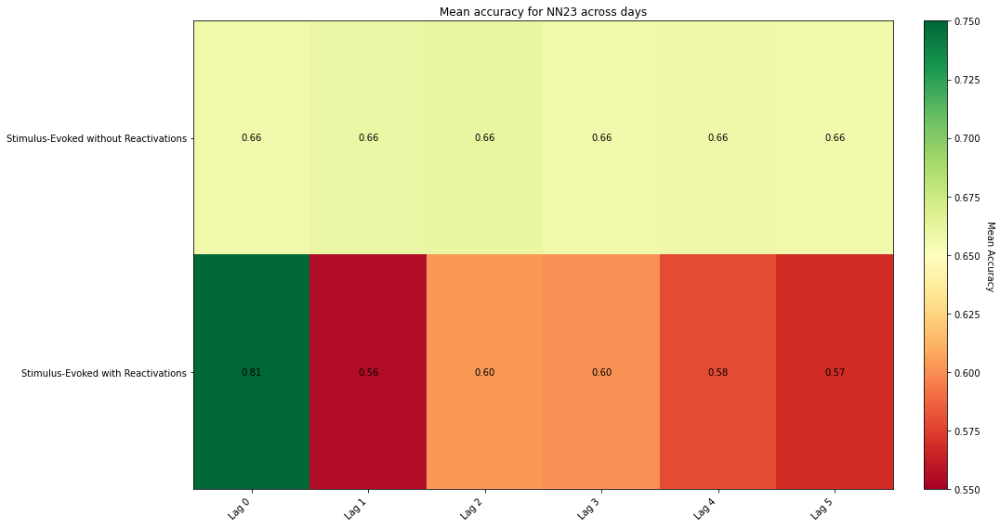

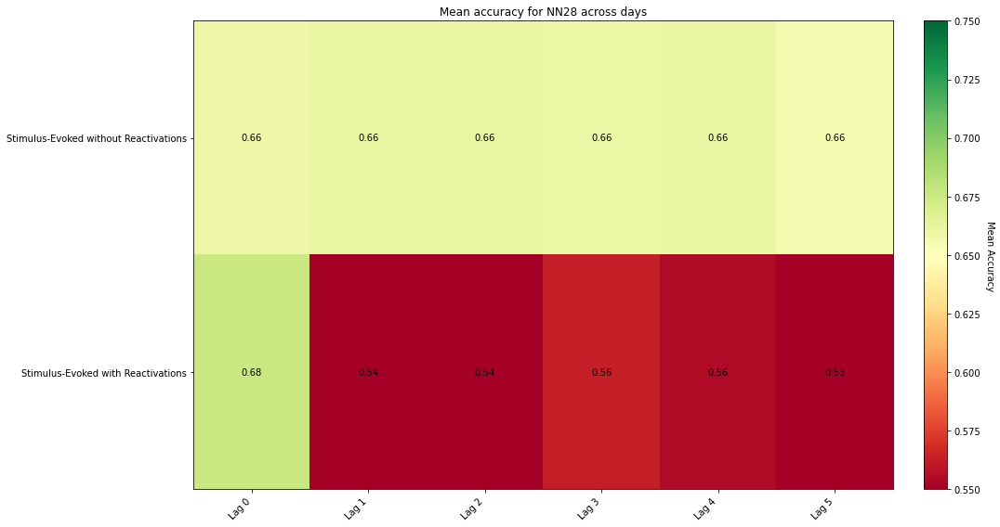

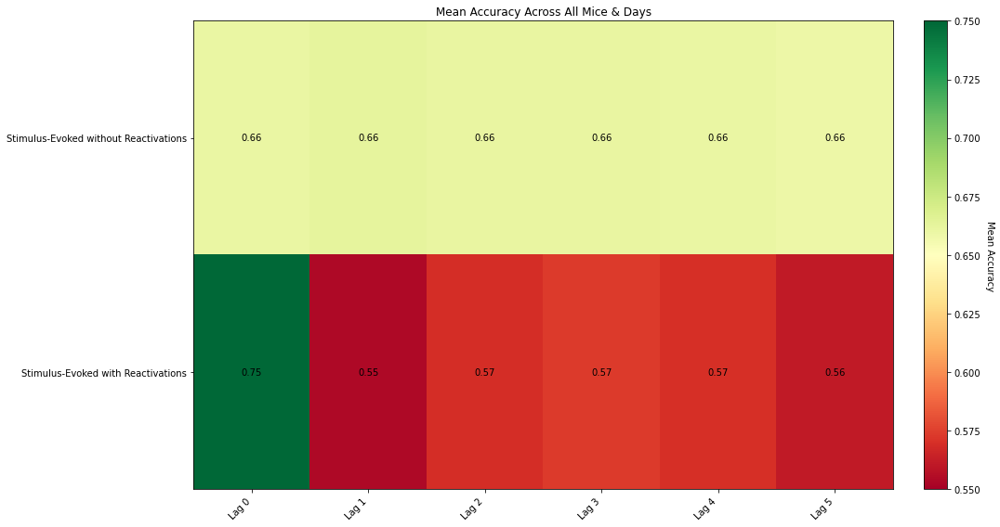

In [34]:
rows = ['Stimulus-Evoked without Reactivations', 'Stimulus-Evoked with Reactivations']
cols = ['Lag 0', 'Lag 1', 'Lag 2', 'Lag 3', 'Lag 4', 'Lag 5']
mat = pd.DataFrame(index=rows, columns=cols, dtype=float)

cell_to_model = {
    ('Stimulus-Evoked without Reactivations',    'Lag 0'):      'SER_lag_0_SER',
    ('Stimulus-Evoked without Reactivations',    'Lag 1'):    'SER_lag_1_SER',
    ('Stimulus-Evoked without Reactivations',    'Lag 2'):      'SER_lag_2_SER',
    ('Stimulus-Evoked without Reactivations',    'Lag 3'):      'SER_lag_3_SER',
    ('Stimulus-Evoked without Reactivations',    'Lag 4'):    'SER_lag_4_SER',
    ('Stimulus-Evoked without Reactivations',    'Lag 5'):      'SER_lag_5_SER',

    ('Stimulus-Evoked with Reactivations',    'Lag 0'):      'ri_min_SER_lag_0_SER',
    ('Stimulus-Evoked with Reactivations',    'Lag 1'):    'ri_min_SER_lag_1_SER',
    ('Stimulus-Evoked with Reactivations',    'Lag 2'):      'ri_min_SER_lag_2_SER',
    ('Stimulus-Evoked with Reactivations',    'Lag 3'):      'ri_min_SER_lag_3_SER',
    ('Stimulus-Evoked with Reactivations',    'Lag 4'):    'ri_min_SER_lag_4_SER',
    ('Stimulus-Evoked with Reactivations',    'Lag 5'):      'ri_min_SER_lag_5_SER'
}

lag_models = [
    'SER_lag_0_SER',
    'SER_lag_1_SER',
    'SER_lag_2_SER',
    'SER_lag_3_SER',
    'SER_lag_4_SER',
    'SER_lag_5_SER',
    'ri_min_SER_lag_0_SER',
    'ri_min_SER_lag_1_SER',
    'ri_min_SER_lag_2_SER',
    'ri_min_SER_lag_3_SER',
    'ri_min_SER_lag_4_SER',
    'ri_min_SER_lag_5_SER',
]

output_dir = "LR_results/Lags"

# find every file that ends with _all_days_LR_results.csv
pattern = os.path.join(output_dir, "*_all_days_Lag_results_.csv")

All_mice_lag = {}

for filepath in glob.glob(pattern):
    # extract the mouse ID from the filename, e.g. "NN23_all_days_LR_results.csv" → "NN23"
    fname = os.path.basename(filepath)
    mouse = fname.split("_all_days_Lag_results_.csv")[0]
    
    # load it
    df = pd.read_csv(filepath)
    
    # store in a dict keyed by mouse
    All_mice_lag[mouse] = df

for mouse, df in All_mice_lag.items():
    # df has columns: ['mouse', 'date', 'model', 'all_accs', 'mean_accuracy', 'std_accuracy']
    for date, df_date in df.groupby('date'):
        mean_acc = df_date.set_index('model')['mean_accuracy'].to_dict()
        plot_matrix(
            mean_acc,
            title=f"Accuracy for {mouse} on {date}",
            option='lags'
        )

# per mouse, across all days
for mouse, df in All_mice_lag.items():
    mean_acc_mouse = df.groupby('model')['mean_accuracy'].mean().to_dict()
    plot_matrix(
        mean_acc_mouse,
        title=f"Mean accuracy for {mouse} across days",
        option='lags'
    )

# across all mice & days
combined = pd.concat(All_mice_lag.values(), ignore_index=True)
mean_acc_across = combined.groupby('model')['mean_accuracy'].mean().to_dict()
plot_matrix(
    mean_acc_across,
    title="Mean Accuracy Across All Mice & Days",
    option='lags'
)


# Cross-category SER prediction

In [ ]:
def sign_changes_cross(mean_activity_cs: np.ndarray,
                       trial_r: np.ndarray) -> np.ndarray:
    # 1D trial‐to‐trial diff, pad one extra so we can index up to T-1
    diffs = np.diff(mean_activity_cs, axis=0)
    diffs = np.concatenate([diffs, diffs[-1:]], axis=0)
    # clip trial indices so we never go OOB
    trial_r_clip = np.clip(trial_r, 0, len(diffs)-1)
    # map to signs
    return np.where(diffs[trial_r_clip] > 0, 1, -1)


def clean_and_prepare_data_cross(mean_activity_r:  np.ndarray,
                                 mean_activity_cs: np.ndarray,
                                 trial_r, 
                                 metric: str):
    """
    Vectorized cross‐category prep:
      – X: (R, N) reactivation×neurons
      – y: (R,)    reactivation×1 label of sign‐change in the OTHER CS
    """
    trial_r = np.asarray(trial_r, dtype=int)
    # 1) compute y in one shot
    y = sign_changes_cross(mean_activity_cs.mean(axis=1) if mean_activity_cs.ndim>1 else mean_activity_cs,
                           trial_r)

    # 2) compute X in one shot
    trial_r_clip = np.clip(trial_r, 0, mean_activity_cs.shape[0]-1)

    if metric == 'substract':
        X = mean_activity_r - mean_activity_cs[trial_r_clip]
    elif metric == 'other':  # add
        X = mean_activity_r + mean_activity_cs[trial_r_clip]
    else:
        raise ValueError(f"Unknown metric {metric!r}")

    print(X.shape, y.shape)

    # ensure shapes: X (R,N), y (R,)
    return X, y

def LR_cross_category_SER(day_outputs):
    all_LR_results = {}
    output_dir="LR_results/cross"
    os.makedirs(output_dir, exist_ok=True)


    for mouse, day_dict in day_outputs.items():
        all_LR_results[mouse] = {}
        daily_dfs=[]

        for date, out in day_dict.items():
            all_LR_results[mouse][date] = {}
            m1, m2 = out['mean_activity_cs_1'], out['mean_activity_cs_2']
            r1, r2 = out['mean_activity_r_1'], out['mean_activity_r_2']
            trial_r1, trial_r2 = out['trial_r_1'], out['trial_r_2']
            LR_day_results = {}

            X1, y1 = clean_and_prepare_data_cross(r1, m2, trial_r1, metric='other')
            X2, y2 = clean_and_prepare_data_cross(r2, m1, trial_r2, metric='other')
            y_all = np.concatenate([y1, y2], axis=0)
            y_all = y_all.reshape(-1, 1)
            LR_day_results['SER_min_r_cross_SER'] = LR_model_torch(np.concatenate([X1, X2], axis=0), 
                                                            y_all)
        
            X1, y1 = clean_and_prepare_data_cross(r1, m2, trial_r1, metric='substract')
            X2, y2 = clean_and_prepare_data_cross(r2, m1, trial_r2, metric='substract')
            X_all = np.concatenate([X1, X2], axis=0)
            y_all = np.concatenate([y1, y2], axis=0)
            y_all = y_all.reshape(-1, 1)
            LR_day_results['r_min_SER_cross_SER'] = LR_model_torch(X_all, 
                                                            y_all)

            all_accs = {k: v['Accuracy'] for k, v in LR_day_results.items()}
            mean_acc = {k: np.mean(v["Accuracy"]) for k, v in LR_day_results.items()}
            std_acc  = {k: np.std(v["Accuracy"])  for k, v in LR_day_results.items()}

            df = pd.DataFrame({
                'model': list(mean_acc.keys()),
                'all_accs': list(all_accs.values()),
                'mean_accuracy': list(mean_acc.values()),
                'std_accuracy':  [std_acc[k] for k in mean_acc.keys()]
            })

            all_LR_results[mouse][date] = df

            df_daily = df.copy()
            df_daily['mouse'] = mouse
            df_daily['date']  = date
            daily_fname = os.path.join(output_dir, f"{mouse}_{date}_cross_results.csv")
            df_daily.to_csv(daily_fname, index=False)
            daily_dfs.append(df_daily)

        if daily_dfs:
            df_mouse = pd.concat(daily_dfs, ignore_index=True)
            mouse_fname = os.path.join(output_dir, f"{mouse}_all_days_cross_results.csv")
            df_mouse.to_csv(mouse_fname, index=False)

    return all_LR_results

cross_cat_SER = LR_cross_category_SER(day_outputs)


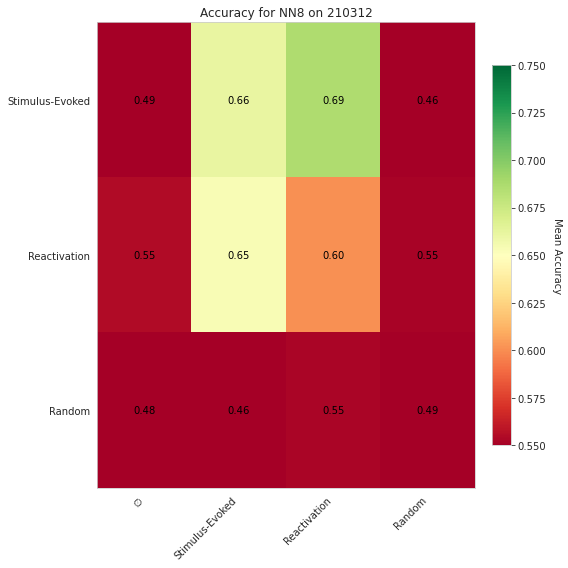

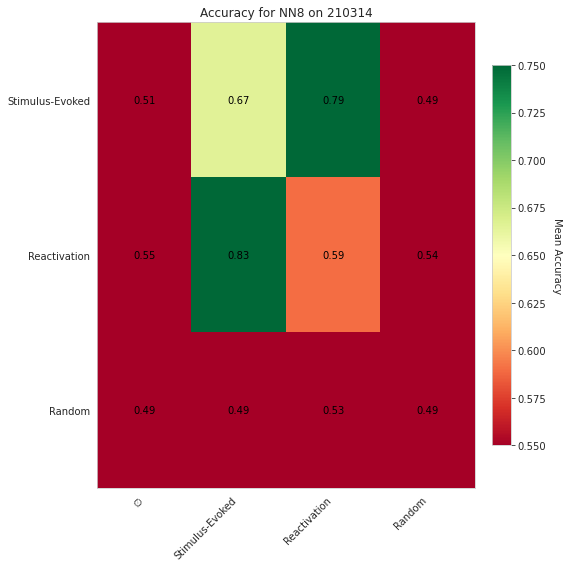

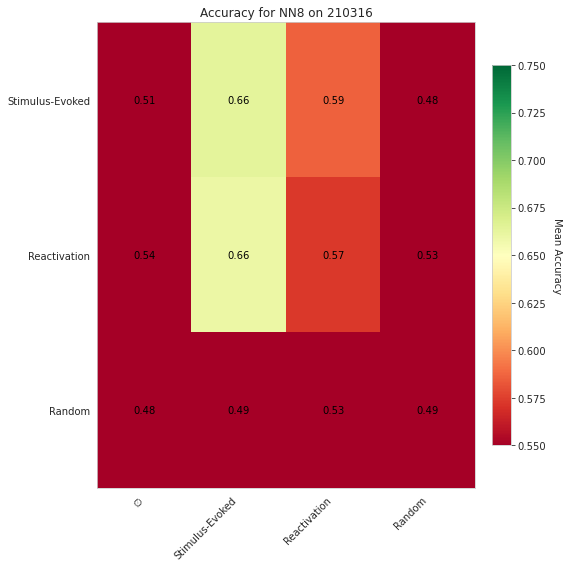

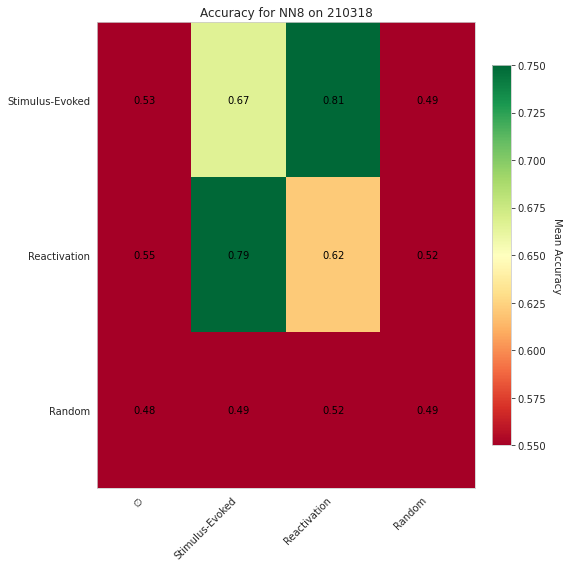

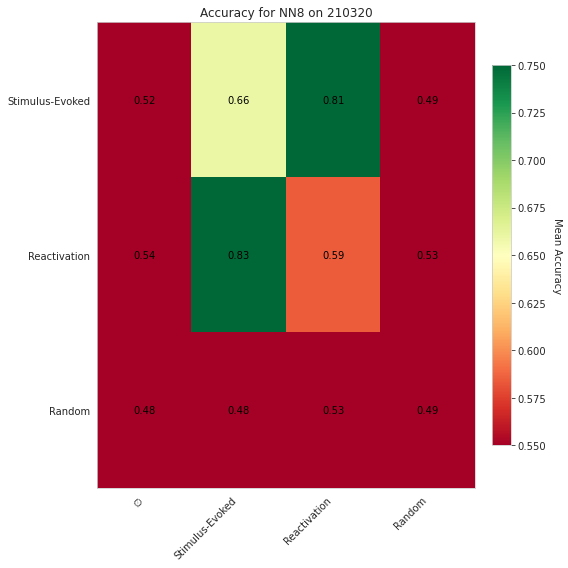

...

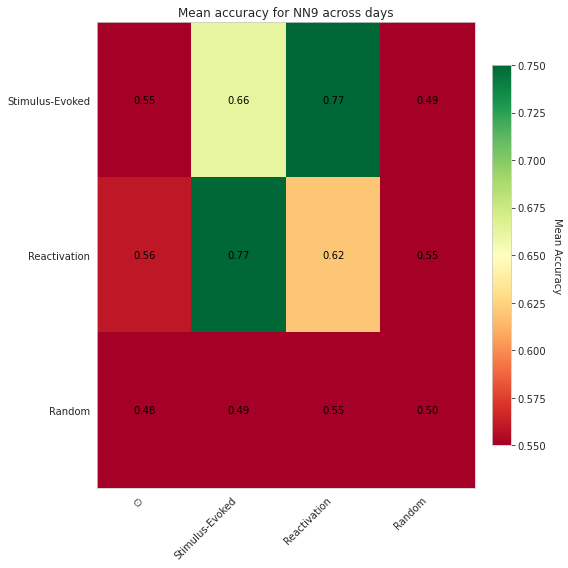

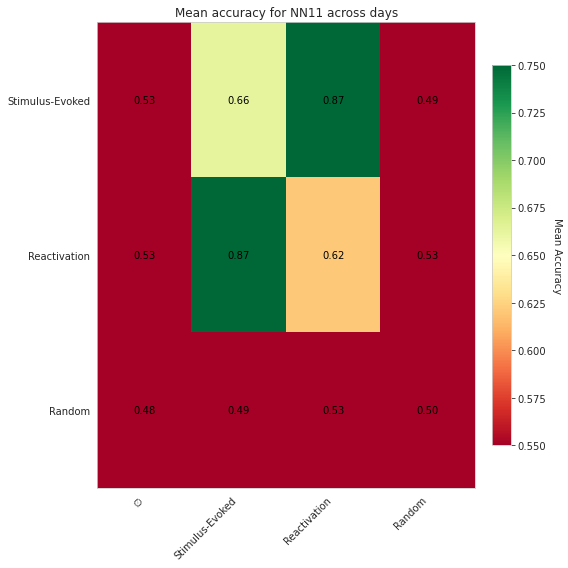

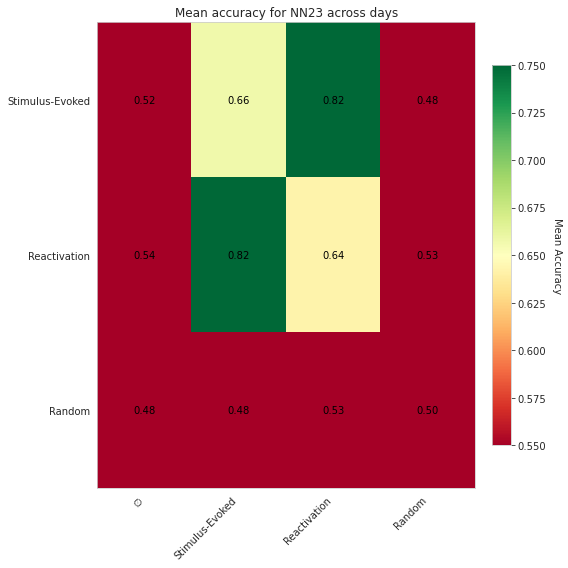

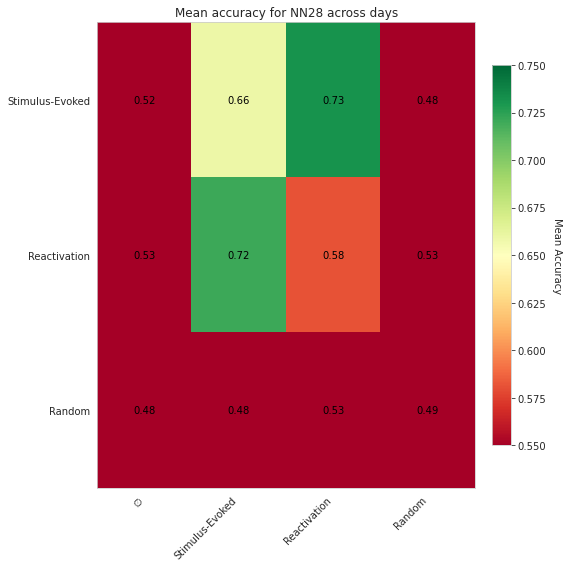

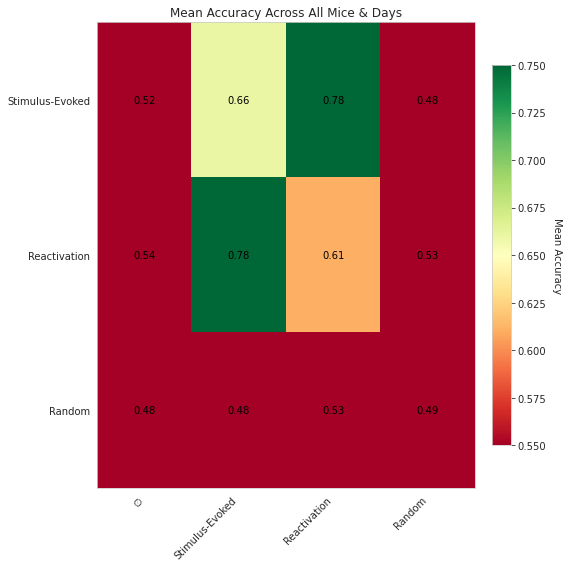

In [32]:
from collections import defaultdict
rows = ['Stimulus-Evoked', 'Reactivation', 'Random']
cols = ['∅', 'Stimulus-Evoked', 'Reactivation', 'Random']
cell_to_model = {
    ('Stimulus-Evoked',    '∅'):                        'SER_t_SER',
    ('Stimulus-Evoked',    'Stimulus-Evoked'):          'SER_min_SER_SER',
    ('Stimulus-Evoked',    'Reactivation'):             'SER_min_r_cross_SER',
    ('Stimulus-Evoked',    'Random'):                   'RAND_ser_min_rand_SER',
    ('Reactivation',      '∅'):                         'r_SER',
    ('Reactivation',      'Stimulus-Evoked'):           'r_min_SER_cross_SER',
    ('Reactivation',      'Reactivation'):              'r_plus_ri_SER',
    ('Reactivation',      'Random'):                    'ri_min_RAND_SER',
    ('Random', '∅'):                                    'RAND_SER',
    ('Random', 'Stimulus-Evoked'):                      'RAND_min_ser_SER',
    ('Random', 'Reactivation'):                         'RAND_ri_SER',
    ('Random', 'Random'):                               'RAND_min_rand_SER',
}



cross_dfs = []
for fp in glob.glob(os.path.join("LR_results", "cross", "*_all_days_cross_results.csv")):
    mouse = os.path.basename(fp).replace("_all_days_cross_results.csv", "")
    df = pd.read_csv(fp)
    df['mouse'] = mouse
    cross_dfs.append(df)

if cross_dfs:
    cross_all = pd.concat(cross_dfs, ignore_index=True)
else:
    cross_all = pd.DataFrame(columns=['mouse','date','model','mean_accuracy'])


for mouse, base_df in all_mice_results.items():
    my_cross = cross_all[cross_all['mouse'] == mouse]
    all_mice_results[mouse] = pd.concat([base_df, my_cross], ignore_index=True)

for mouse, df in all_mice_results.items():
    for date, df_date in df.groupby('date'):
        mean_acc = df_date.set_index('model')['mean_accuracy'].to_dict()
        plot_matrix(
            mean_acc,
            title=f"Accuracy for {mouse} on {date}",
            option='normal'
        )

for mouse, df in all_mice_results.items():
    mean_acc_mouse = df.groupby('model')['mean_accuracy'].mean().to_dict()
    plot_matrix(
        mean_acc_mouse,
        title=f"Mean accuracy for {mouse} across days",
        option='normal'
    )

combined = pd.concat(all_mice_results.values(), ignore_index=True)
mean_acc_all = combined.groupby('model')['mean_accuracy'].mean().to_dict()
plot_matrix(
    mean_acc_all,
    title="Mean Accuracy Across All Mice & Days",
    option='normal'
)


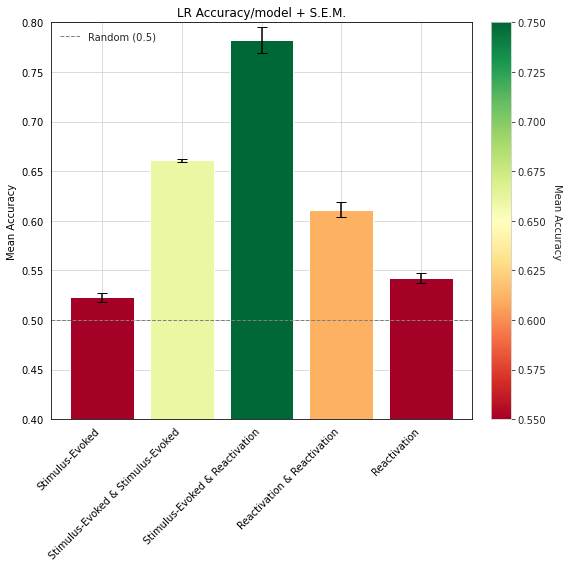

In [33]:
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

def plot_bar_mean_acc(all_mice_results, title=None):
    """
    Bar‐plot of mean accuracy ± SEM for chosen (row, col) pairs.
    
    Parameters
    ----------
    all_mice_results : dict
        mapping mouse → DataFrame with columns ['model','mean_accuracy'],
        indexed by day (or otherwise concatenable).
    title : str, optional
    """
    # which pairs (in desired order)?
    pairs = [
        ('Stimulus-Evoked',    '∅'),
        ('Stimulus-Evoked',    'Stimulus-Evoked'),
        ('Stimulus-Evoked',    'Reactivation'),
        ('Reactivation',   'Reactivation'),
        ('Reactivation',   '∅'),
    ]
    
    # build session‐wise lists
    session_vals = {pair: [] for pair in pairs}
    combined = pd.concat(all_mice_results.values(), ignore_index=True)
    
    for pair in pairs:
        model = cell_to_model[pair]
        # extract all accuracies for this model across sessions
        vals = combined.loc[combined['model'] == model, 'mean_accuracy'].values
        session_vals[pair] = vals
    
    # compute means and SEMs
    means = np.array([session_vals[p].mean() for p in pairs])
    sems  = np.array([session_vals[p].std(ddof=1)/np.sqrt(len(session_vals[p]))
                      for p in pairs])

    labels = []
    for r, c in pairs:
        if c == '∅':
            labels.append(r)
        else:
            labels.append(f"{r} & {c}")
    
    # colour map
    cmap = plt.get_cmap('RdYlGn')
    norm = Normalize(vmin=0.55, vmax=0.75)
    colors = [cmap(norm(m)) for m in means]
    
    # plot
    fig, ax = plt.subplots(figsize=(8,8))
    bars = ax.bar(labels, means, yerr=sems, capsize=5, color=colors)
    
    ax.axhline(0.5, linestyle='--', color='gray', linewidth=1, label='Random (0.5)')

    sm = ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])  
    cbar = fig.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label('Mean Accuracy', rotation=270, labelpad=15)
    
    ax.set_ylabel("Mean Accuracy")
    ax.set_ylim(0.4, 0.8)
    if title:
        ax.set_title(title)
    ax.legend(loc='upper left')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    for spine in ax.spines.values():
        spine.set_color('black')
    # force tick marks and tick labels to black
    ax.tick_params(axis='both', which='both', colors='black')
    # axis labels & title in black
    ax.set_ylabel("Mean Accuracy", color='black')
    ax.set_xlabel("")  # if you have an xlabel
    if title:
        ax.set_title(title, color='black')

    ax.set_ylim(0.4, 0.8)
    ax.legend(loc='upper left', frameon=False, edgecolor='black', facecolor='white')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.grid(True, color='lightgray') 
    plt.show()


plot_bar_mean_acc(
    all_mice_results,
    title="LR Accuracy/model + S.E.M."
)

In [ ]:
from collections import defaultdict
from scipy.stats import ttest_rel 

pairs_to_test = [
    ("SER_min_SER_R",       "SER_min_r_cross_SER"),
    ("SER_min_SER_R",   "r_min_SER_cross_SER")
]

#make it work cross is in cross_cat_ser, while others are in all_mice_lr_ser

# ─── per-mouse (across days) significance ───────────────────────
for mouse, date_dict in All_mice_LR_SER.items():
    # build lists of per-day accuracies
    acc_lists = defaultdict(list)
    for date, df in date_dict.items():
        for _, row in df.iterrows():
            acc_lists[row['model']].append(row['mean_accuracy'])

    print(f"\n=== {mouse} per-mouse tests (across {len(date_dict)} days) ===")
    for m1, m2 in pairs_to_test:
        if m1 in acc_lists and m2 in acc_lists:
            a1 = np.array(acc_lists[m1])
            a2 = np.array(acc_lists[m2])
            t_stat, p_val = ttest_rel(a1, a2)
            print(f"{m1} vs {m2}: t={t_stat:.3f}, p={p_val:.3f}")
        else:
            print(f"Skipping {m1} vs {m2} (missing data)")

# ─── grand (all mice & days) significance ───────────────────────
acc_lists_all = defaultdict(list)
for mouse, date_dict in All_mice_LR_SER.items():
    for date, df in date_dict.items():
        for _, row in df.iterrows():
            acc_lists_all[row['model']].append(row['mean_accuracy'])

print(f"\n=== Grand tests across all mice & days ===")
for m1, m2 in pairs_to_test:
    if m1 in acc_lists_all and m2 in acc_lists_all:
        a1 = np.array(acc_lists_all[m1])
        a2 = np.array(acc_lists_all[m2])
        t_stat, p_val = ttest_rel(a1, a2)
        print(f"{m1} vs {m2}: t={t_stat:.3f}, p={p_val:.3f}")
    else:
        print(f"Skipping {m1} vs {m2} (missing data)")


# General Learning Signal?

In [ ]:
def LR_across_days_general_SER(day_outputs):
    all_LR_results = {}
    output_dir="LR_results/No_cat2"
    os.makedirs(output_dir, exist_ok=True)

    for mouse, day_dict in day_outputs.items():
        all_LR_results[mouse] = {}
        print(f"{mouse}")
        daily_dfs = [] 

        for date, out in day_dict.items():
            print(f"{date}")

            m1 = out['sers_ordered']
            r1 = out['mean_activity_r_any']
            trial_reacts_all = out['trials_ordered']
            LR_day_results = {}

            d1 = np.diff(m1, axis=0)
            X1 = d1[trial_reacts_all[:-1]]
            y1 = d1[trial_reacts_all[1:]]      # same shape

            print(X1.shape)
            print(y1.shape)

            y = np.where(y1 > 0, 1, -1)
            print(f"ser min ser", X1.shape, y.shape)
            LR_day_results['SER_min_SER__CROSS_ALLSER'] = LR_model_torch(X1, y)

            X, y = clean_and_prepare_data(r1, m1, trial_reacts_all, metric= 'substract')
            # 1) no cats ser - r
            print(X.shape, y.shape)
            LR_day_results['SER_min_r_CROSS_ALL_SER'] = LR_model_torch(X, y)
            

            X, y = clean_and_prepare_data(r1, m1, trial_reacts_all, metric= 'other')
            # 2) no cats r - ser
            print(X.shape, y.shape)
            LR_day_results['r_min_SER_CROSS_ALL_SER'] = LR_model_torch(X, y)

            Rsum = r1[:-1]+r1[1:]
            LR_day_results['r_plus_ri_SER'] = LR_model_torch(Rsum, y)
            print(f"r plus r", Rsum.shape, y.shape)

            all_accs  = {k: v['Accuracy']   for k, v in LR_day_results.items()}
            mean_acc  = {k: np.mean(v["Accuracy"])  for k, v in LR_day_results.items()}
            std_acc   = {k: np.std(v["Accuracy"])   for k, v in LR_day_results.items()}
            all_probs = {k: v['probs'].tolist()     for k, v in LR_day_results.items()}
            all_ytrue = {k: v['y_true'].tolist()    for k, v in LR_day_results.items()}

            df = pd.DataFrame({
                'model':         list(mean_acc.keys()),
                'all_accs':      list(all_accs.values()),
                'mean_accuracy': list(mean_acc.values()),
                'std_accuracy':  [std_acc[k] for k in mean_acc.keys()],
                'probs':         list(all_probs.values()),
                'y_true':        list(all_ytrue.values())
                })
            
            df_daily = df.copy()
            df_daily['mouse'] = mouse
            df_daily['date']  = date

            # save the per-day CSV
            daily_fname = os.path.join(output_dir, f"{mouse}_{date}_LR_results.csv")
            df_daily.to_csv(daily_fname, index=False)

            daily_dfs.append(df_daily)

        if daily_dfs:
            df_mouse = pd.concat(daily_dfs, ignore_index=True)
            mouse_fname = os.path.join(output_dir, f"{mouse}_all_days_LR_results.csv")
            df_mouse.to_csv(mouse_fname, index=False)
            json_fname = mouse_fname.replace('.csv', '.json')
            df_mouse.to_json(json_fname, orient='records')
            all_LR_results[mouse] = df_mouse

    return all_LR_results

no_cat_SER = LR_across_days_general_SER(day_outputs)



NN9
210428
(37, 2713)
(37, 2713)
ser min ser (37, 2713) (37, 2713)
Fold 0: mean acc=0.505, f1=0.471
Fold 1: mean acc=0.448, f1=0.404
Fold 2: mean acc=0.494, f1=0.394
Fold 3: mean acc=0.508, f1=0.477
Fold 4: mean acc=0.371, f1=0.274

=== CV Summary ===
Accuracy:  0.465 ± 0.188
Precision: 0.419
Recall:    0.451
F1-score:  0.404
probs (37, 2713)
y_true_full (37, 2713)
(38, 2713) (38, 2713)
Fold 0: mean acc=0.788, f1=0.775
Fold 1: mean acc=0.635, f1=0.586


Fold 2: mean acc=0.769, f1=0.562
Fold 3: mean acc=0.742, f1=0.683
Fold 4: mean acc=0.735, f1=0.588

=== CV Summary ===
Accuracy:  0.734 ± 0.149
Precision: 0.692
Recall:    0.676
F1-score:  0.639
probs (38, 2713)
y_true_full (38, 2713)
(38, 2713) (38, 2713)
Fold 0: mean acc=0.788, f1=0.775
Fold 1: mean acc=0.637, f1=0.589
Fold 2: mean acc=0.769, f1=0.561
Fold 3: mean acc=0.743, f1=0.686
Fold 4: mean acc=0.737, f1=0.591

=== CV Summary ===
Accuracy:  0.735 ± 0.149
Precision: 0.694
Recall:    0.678
F1-score:  0.641
probs (38, 2713)
y_true_full (38, 2713)
Fold 0: mean acc=0.596, f1=0.478
Fold 1: mean acc=0.545, f1=0.486
Fold 2: mean acc=0.653, f1=0.447
Fold 3: mean acc=0.661, f1=0.593
Fold 4: mean acc=0.549, f1=0.434

=== CV Summary ===
Accuracy:  0.601 ± 0.174
Precision: 0.541
Recall:    0.521
F1-score:  0.488
probs (38, 2713)
y_true_full (38, 2713)
r plus r (37, 2713) (38, 2713)
210429
(62, 2402)
(62, 2402)
ser min ser (62, 2402) (62, 2402)
Fold 0: mean acc=0.522, f1=0.457
Fold 1: mean a

In [70]:
output_dir = "LR_results/No_cat2"

# find every file that ends with _all_days_LR_results.csv
pattern = os.path.join(output_dir, "*_all_days_LR_results.csv")

no_cat_SER = {}

for filepath in glob.glob(pattern):
    # extract the mouse ID from the filename, e.g. "NN23_all_days_LR_results.csv" → "NN23"
    fname = os.path.basename(filepath)
    mouse = fname.split("_all_days_LR_results.csv")[0]
    
    # load it
    df = pd.read_csv(filepath)
    
    # store in a dict keyed by mouse
    no_cat_SER[mouse] = df


In [85]:
target_models = {'SER_t_SER', 'r_SER'}

updated_no_cat_SER = {}

for mouse_id, base_df in no_cat_SER.items():
    # copy the original DataFrame
    df = base_df.copy()

    # pull out the metrics for this mouse (if any)
    metrics = all_mice_results.get(mouse_id)
    if metrics is None:
        # nothing to add
        updated_no_cat_SER[mouse_id] = df
        continue

    mf = metrics.get('model')

    # 3a) simple case: the metric is already a single string
    if isinstance(mf, str):
        if mf in target_models:
            # build a one‐row DataFrame from the metrics dict
            rec = {col: metrics[col] for col in df.columns if col in metrics}
            # also make sure we tag it with the mouse_id
            rec['mouse'] = mouse_id
            new_row = pd.DataFrame([rec])
            df = pd.concat([df, new_row], ignore_index=True, sort=False)

    elif hasattr(mf, '__iter__'):
    # turn it into a list so we can index
        models = list(mf)
        # scan for *every* index where the model is in your targets
        for idx, m in enumerate(models):
            if m in target_models:
                # slice out the idx'th element for list‐valued columns,
                # or take the scalar for everything else
                rec = {}
                for col in df.columns:
                    val = metrics.get(col)
                    if isinstance(val, (list, tuple, np.ndarray, pd.Series)):
                        rec[col] = val[idx]
                    else:
                        rec[col] = val
                # tag the mouse id
                rec['mouse'] = mouse_id
                new_row = pd.DataFrame([rec])
                df = pd.concat([df, new_row], ignore_index=True, sort=False)

    # save the extended DataFrame
    updated_no_cat_SER[mouse_id] = df



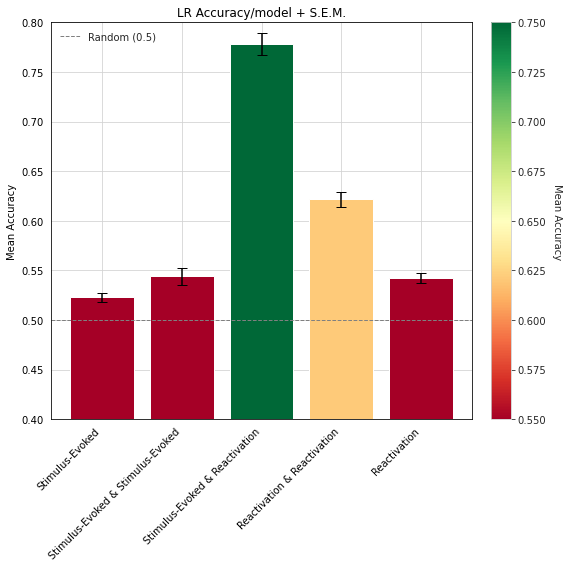

In [87]:
rows = ['Stimulus-Evoked', 'Reactivation', 'Random']
cols = ['∅', 'Stimulus-Evoked', 'Reactivation', 'Random']
cell_to_model = {
    ('Stimulus-Evoked',    '∅'):                        'SER_t_SER',
    ('Stimulus-Evoked',    'Stimulus-Evoked'):          'SER_min_SER__CROSS_ALLSER',
    ('Stimulus-Evoked',    'Reactivation'):             'SER_min_r_CROSS_ALL_SER',
    ('Reactivation',      '∅'):                         'r_SER',
    ('Reactivation',      'Stimulus-Evoked'):           'r_min_SER_CROSS_ALL_SER',
    ('Reactivation',      'Reactivation'):              'r_plus_ri_SER'}

plot_bar_mean_acc(
    updated_no_cat_SER,
    title="LR Accuracy/model + S.E.M."
)